# Time Series Analysis of Power Consumption Data and Weather for PJM's Eastern Mid Atlantic Power Grid 


With projections for climate change becoming more dire year over year, the need for the world’s economies to rapidly switch over to carbon-free sources of energy is more necessary than ever before. Renewable energy sources such as wind and solar are becoming cheaper and more cost-effective to install. However, one problem that continues to arise with these sources of energy, is intermittency, which has resulted in a common critique that the fossil fuel industry voices against renewables are “What happens when the wind stops blowing and the sun goes down?”  Renewable energy is directly tied to weather conditions, for example, wind speeds affect turbines, cloud conditions affect solar, and annual precipitation can affect hydroelectric generators. 

Historically power grids have operated with large centralized power plants that run constant baseload power, however recently this has begun to shift as societies adapt to using smart grids. In smart grids, energy production is distributed amongst small scale producers, such as residential solar. This results in larger fluctuations in power supply due to the problem of intermittency. In order to remain relevant, power suppliers will have to adapt from suplying electricity as a constant baseload to load following, which is where the power plant follows the demand for power and can add power when renewables cannot. This response to demand isn't always instant, for example nuclear reactors can throttle their output up between 2% and  10% a minute, which makes Accurate and robust forcasting critical for future opperations. 

In addition to electric production by renewables, electrical power consumption is inextricably connected to the weather. Air conditioning and space heating are some of the most energy-intensive processes that rely on the electric grid and are both affected by temperature, while seasonal daylight fluctuations affect lighting usage. Extreme weather events also affect the functionality of the grid, intense storms can snap limbs, uproot trees, and topple power lines resulting in outages.  The ability to accurately and robustly forecast both energy production and consumption with weather data will be critical to coordinating energy production between renewable and nonrenewable energy sources. In doing so, this would allow grid operators to extend the capacity for a renewable electric generation, and reduce the near term demand for additional grid-level electricity storage. 

In this Notebook, the relationships between weather and hourly power consumption are examined using Unsupervised clustering, Vector Auto Regression, Random Forrest, and Gradient Boosting Models. Modeling the relationship between demand and weather would provide a foundation on which to model the future interaction of renewable output and more traditional power sources. 


For more General  info on smart grids:
https://en.wikipedia.org/wiki/Smart_grid

For more General  info on load following power plants:
https://en.wikipedia.org/wiki/Load_following_power_plant

Technical Paper on Load following Nuclear Plants: 
https://www.oecd-nea.org/ndd/reports/2011/load-following-npp.pdf


In [605]:
#https://www.pnas.org/content/early/2020/07/14/1922205117

In [606]:
import numpy as np
from numpy.fft import fft, fftfreq, ifft 

import pandas as pd 

#ploting libraries 
import matplotlib.pyplot as plt
import seaborn as sns
#import plotly


#time Series Libraries 
import time
import datetime
import pytz
from pytz import timezone
from datetime import datetime, timedelta
from pandas.tseries.holiday import USFederalHolidayCalendar as calendar

local_time = pytz.timezone('US/Eastern')


# modeling libraries 
import scipy.stats as stats
import statsmodels

#sklearn libraries
import sklearn
from sklearn import datasets, metrics
from sklearn.datasets import make_regression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.mixture import GaussianMixture

import umap

import os
#from fbprophet import Prophet 

import pvlib

import warnings 
warnings.filterwarnings('ignore')

# set pandas display options
pd.set_option('display.max_rows',1000)
pd.set_option('display.max_columns',500)
pd.set_option('display.width',1000)


In [607]:
#import hourly power consumption CSV
#https://www.kaggle.com/robikscube/hourly-energy-consumption
#begins :'2002-12-31 01:00:00'
# ends : '2018-01-02 00:00:00'
PJM_df = pd.read_csv('/Users/robertshiles/CSV_files/pjm_hourly_est.csv',encoding= 'latin1')



#import the weather data into a dataframe
#www.weather.com
# see other note book for extraction techniques 
#Philly Weather
weather_data_PHL= pd.read_csv('/Users/robertshiles/CSV_files/weather_data_KPHL.csv')#,encoding= 'latin1')
#Dover Weather
weather_data_DOV= pd.read_csv('/Users/robertshiles/CSV_files/weather_data_KDOV.csv')#,encoding= 'latin1')
#Weather Data Eastern Shore
weather_data_KSBY= pd.read_csv('/Users/robertshiles/CSV_files/weather_data_KSBY.csv')#,encoding= 'latin1')
#Newjersy Airport data 'KACY'=Atlantic city 'KEWR'=Newark 
weather_data_NJAIR= pd.read_csv('/Users/robertshiles/CSV_files//weather_data_NJAIR.csv')#,encoding= 'latin1')


#import other data 

#CSV on Power outages
#http://insideenergy.org/2014/08/18/data-explore-15-years-of-power-outages/
outages_df = pd.read_csv('/Users/robertshiles/CSV_files/Grid_Disruption_00_14_standardized.csv')

#CSV with daily natural gas prices 
#https://datahub.io/core/natural-gas#resource-daily
nat_gas_price_df = pd.read_csv('/Users/robertshiles/CSV_files/daily_naturalgas_prices_csv.csv')


## Clean the Power Consumption Data

In [608]:
# set the date variable to timezone aware date time,
# and remove variables for non relivant variables 

#create a seperate column for date time to use for merging other data 
PJM_df['local_naive_Datetime'] = pd.to_datetime(PJM_df['Datetime'])

#note experimental case below removed time zone
#PJM_df['EST_tz_datetime'] = PJM_df['local_naive_Datetime'].dt.tz_localize('UTC').dt.tz_convert('US/Eastern')
PJM_df['EST_tz_datetime'] = PJM_df['local_naive_Datetime'].dt.tz_localize('UTC').dt.tz_convert('US/Eastern')

#convert power to date time index and remove all columns except pjme
PJM_df['Datetime'] = pd.to_datetime(PJM_df['Datetime'])
#drop irelivant collumns
PJM_df = PJM_df.drop(['AEP', 'COMED',
                    'DAYTON', 'DEOK',
                    'DOM', 'DUQ', 'EKPC', 'FE', 'NI','PJMW', 'PJM_Load'], axis=1 )
#set the index to date time
PJM_df = PJM_df.set_index('EST_tz_datetime')



In [609]:
# create a new dataframe that will be used to merge data from weather, power and other sources
#make this dataframe timezone aware and 

start=pd.Timestamp(year=2003, month=1, day=5, hour=5,freq='H',tz='US/Eastern')

date_range = pd.date_range(start=PJM_df.PJME.first_valid_index(),end=PJM_df.PJME.last_valid_index(),freq='H',tz='US/Eastern')

power = pd.DataFrame(data=date_range, columns=['EST_tz_datetime'])

# Map transition times to year for some efficiency gain                                                                                                                                                     
tz = timezone('US/Eastern')
transition_times = tz._utc_transition_times[1:]
transition_times = [t.astimezone(tz) for t in transition_times]
transition_times_by_year = {}
for start_time, stop_time in zip(transition_times[::2], transition_times[1::2]):
    year = start_time.year
    transition_times_by_year[year] = [start_time, stop_time]


In [610]:
#create a function to mark the dates     
def mark_dst(date_span):
    for date in date_span:
        try:
            start_dst, stop_dst = transition_times_by_year[date.year]
            yield start_dst <= date <= stop_dst
        except:
            None


In [611]:
# If the date is in DST, mark true, else false                                                                                                                                                              
power['dst_flag'] = [dst_flag for dst_flag in mark_dst(power['EST_tz_datetime'])]
#power = power.set_index('date_time')
power.head()


,EST_tz_datetime,dst_flag
0,2002-12-30 20:00:00-05:00,False
1,2002-12-30 21:00:00-05:00,False
2,2002-12-30 22:00:00-05:00,False
3,2002-12-30 23:00:00-05:00,False
4,2002-12-31 00:00:00-05:00,False


In [612]:
# Do a quick check to make sure we did this correctly for year 2018                                                                                                                                  
dst_start = power['EST_tz_datetime'][power['dst_flag'] == True].index[0] # First dst time 2018
dst_end = power['EST_tz_datetime'][power['dst_flag'] == True].index[-1] # Last dst time 2018
print(power['EST_tz_datetime'][dst_start])
print(power['EST_tz_datetime'][dst_end])


2003-04-06 07:00:00-04:00
2017-11-05 06:00:00-05:00


In [613]:
#power = power.merge(PJM_df[['PJME','Datetime']],how = 'left', left_on='date_time',right_index=True)
power = power.merge(PJM_df[['PJME','Datetime']],how = 'left', left_on='EST_tz_datetime',right_index=True)

power = power.set_index('EST_tz_datetime')

#experimental code below
power = power.assign(PJME=power.PJME.interpolate(method='time'))
power.head()

,dst_flag,PJME,Datetime
EST_tz_datetime,,,
2002-12-30 20:00:00-05:00,False,26498.0,2002-12-31 01:00:00
2002-12-30 21:00:00-05:00,False,25147.0,2002-12-31 02:00:00
2002-12-30 22:00:00-05:00,False,24574.0,2002-12-31 03:00:00
2002-12-30 23:00:00-05:00,False,24393.0,2002-12-31 04:00:00
2002-12-31 00:00:00-05:00,False,24860.0,2002-12-31 05:00:00


## Clean the Power Outage Data

In [614]:
#clean the outages dataframe

#print the length of the uncleaned dataframe
print(len(outages_df))

#select for certain regions that service EMAAC
nerc_regions=['PJM','NPCC, RFC','RFC, SERC','SERC','MRO','MAAC', 'RFC']
outages_df=outages_df.loc[outages_df['NERC Region'].isin(nerc_regions)]

#select states in PJME EMAAC
states = ['Delaware', 'Maryland','Unknown','New Jersey','Pennsylvania','Virginia']
match_pattern = fr"\b(?:{'|'.join(states)})\b"  # "\b(?:app|he)\b"
outages_df=outages_df.loc[ outages_df['Geographic Areas'].str.contains(match_pattern, case=False)]

#remove regions not aplicable to PJM EMAAC 
remove = ['West Virginia', 'West Virginia',
            'Baltimore, Maryland',
            'Virginia Service Territory',
            'Erie, Pennsylvania',
            'Ohio; Virginia; West Virginia', 
            'Richmond Metro area, Virginia',
            'District of Columbia; Maryland',
            'Henrico County, Virginia',
            'Northwest Virginia',
            'Southwest Virginia, Southern West Virginia',
            'Ohio, Tennessee, Virginia',
            'Indiana. Kentucky, Michigan, Ohio, Tennessee, Virginia, West Virginia',
            'West Virginia and Ohio', 'Allegheny and Beaver Counties in Pennsylvania',
            'Virginia and Eastern Part of North Carolina',
            'Southwestern Pennsylvania, West Virginia, Virginia, Maryland',
            'Virginia and West Virginia Area of AEP',
            'Virginia, West Virginia, Ohio, Pennsylvania',
            'Indiana, Ohio, W. Virginia and Virginia',
            'West Virginia, Kentucky, Ohio',
            'Southeastern Virginia, Northeastern North Carolina''Maryland, Southeastern West Virginia, Northern Virginia, Northern Pennsylvania and South Central Pennsylvania',
            'Harford County, Maryland',
            "Central Maryland (Baltimore City, Baltimore County, Anne Arundel County, Harford County, Montgomery County, Calvert County, Prince George's County, Carroll County and Howard County)",
            'Northern Virginia, Richmond area, Eastern Virginia']
outages_df=outages_df.loc[~outages_df['Geographic Areas'].isin(remove)]

#select for weather events 
events_of_interest = ['Severe Weather - Snow/Ice',
                      'Public Appeal due to Severe Weather - Cold',
                      'Voltage Reduction due to Severe Weather - Cold',
                      'Severe Weather - Cold','Severe Weather - Wind Storm',
                      'Severe Weather - Hurricane Sandy',
                      'Severe Weather - Thunderstorms',
                      'Severe Weather - Wind & Rain',
                      'Severe Weather - Winter Storm',
                      'Severe Weather','Earthquake',
                      'Severe Thunderstorms','Major Storm',
                      'Winter Storm', 'Thunderstorms',
                      'High Winds and rain','High Winds and Rain',
                      'High Winds and Flooding',
                      'Highwinds', 'Made Public Appeals',
                      'High Winds', 'Lines Loss/Transmission',
                      'Tropical Depression Ike', 'Wind Storm',
                      'Tropical Storm Hanna', 'Severe Storms',
                      'Lightning Storm', 'Severe Storm',
                      'Major Storms', 'Tropical Storm Ernesto',
                      'Severe Lightning Storms', 'Winter Snow/Ice Storm',
                      'Severe Snow Storm', 'Major Snow Storm',
                      'Hurricane Wilma', 'Severe Thunderstorm',
                      'Strong Thunderstorm', 'Heavy Rain and Wind Storm',
                      'Tropical Storm Gaston', 'High Winds and Heavy Rains',
                      'Ice Storm', 'Tornado', 'Hurricane Isabel']

outages_df=outages_df.loc[outages_df['Event Description'].isin(events_of_interest)]
#print the length of the cleaned dataframe
print(len(outages_df))

#create four columns one containing date information the other containing date and time information
#start
outages_df['start_date'] = pd.to_datetime(outages_df['Date Event Began'], format='%m/%d/%Y')

outages_df['start_date_time'] = outages_df['Date Event Began'] +'-' +outages_df['Time Event Began']
outages_df['start_date_time'] = pd.to_datetime(outages_df.start_date_time, errors='coerce')


#restored
outages_df['end_date'] = pd.to_datetime(outages_df['Date of Restoration'], format='%m/%d/%Y')

outages_df['end_date_time'] = outages_df['Date of Restoration'] +'-' +outages_df['Time of Restoration']
outages_df['end_date_time'] = pd.to_datetime(outages_df.start_date_time, errors='coerce')

# clean the demand loss column and convert to floating value
#dictionary for cleaning strings
demandloss_dict={'UNK':'0',
           'Unknown':'0',
           '800-1,000':'1000',
           '60 at peak, total':'',
           '900-1000':'1000',
            '500-':'','nan':'0',
           '--':'0',
            '-':'0',
            ',':'0'
           }
#clean using each dictionary entrt
outages_df['Demand Loss (MW)']=outages_df['Demand Loss (MW)'].astype(str)

for key in demandloss_dict:
    outages_df['Demand Loss (MW)']=outages_df['Demand Loss (MW)'].str.replace(key,demandloss_dict[key])

#convert the strings to an floating number
outages_df['Demand Loss (MW)']=outages_df['Demand Loss (MW)'].astype(float)


#show the edited dataframe 

#outages_df.info()
#outages_df.head()




1652
159


### Clean the Gas Price Data

In [615]:
# convert the data to date time and upsample the dataset from days to hours 
nat_gas_price_df.Date = pd.to_datetime(nat_gas_price_df.Date)
nat_gas_price_df.Date = nat_gas_price_df.Date.dt.tz_localize('UTC').dt.tz_convert('US/Eastern')
nat_gas_price_df = nat_gas_price_df.set_index('Date')
nat_gas_price_df =nat_gas_price_df.resample('H').interpolate(method='polynomial', order=2)
nat_gas_price_df.head()



,Price
Date,
1997-01-06 19:00:00-05:00,3.820000
1997-01-06 20:00:00-05:00,3.825214
1997-01-06 21:00:00-05:00,3.829901
1997-01-06 22:00:00-05:00,3.834063
1997-01-06 23:00:00-05:00,3.837699


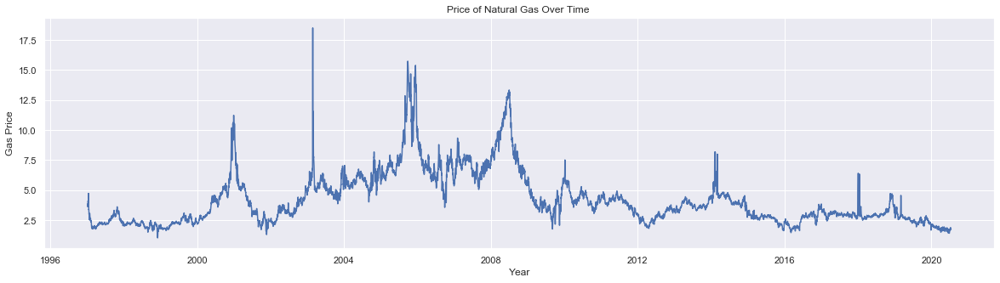

In [617]:
plt.figure(figsize=(20,5))
plt.plot(nat_gas_price_df)
plt.ylabel("Gas Price")
plt.xlabel('Year')
plt.title("Price of Natural Gas Over Time ")
plt.show()

### Clean and Merge the Weather Dataset


In [618]:

#define a function that can be used to clean each weather dataframe so that they can be merged 

def weather_cleaning(weather_data_df):
    weather_data_df = weather_data_df.dropna(subset=['temp'])

    #convert weather to date time index
    weather_data_df['DateTime'] = pd.to_datetime(weather_data_df['date/time'])

    # the weather datasets are labeled with greenwitch mean time and the time zones are not acounted for so, 
    # while the in power dataset timezone shifts are acounted for. 
    #The weather times will have to have 4 hours added 
    #in additon the majority of the data was collected at the end of the hour
    #so we will likely need to add an aditional hour
    weather_data_df['DateTime'] +=  pd.to_timedelta(-4, unit='h')

    #convert UTC to EST 
    weather_data_df['EST_tz_datetime'] = weather_data_df['DateTime'].dt.tz_localize('UTC').dt.tz_convert('US/Eastern')
   
    
    #drop all excessive weather information 
    weather_data_df = weather_data_df.drop(['expire_time_gmt','valid_time_gmt',
                                              'wx_icon', 'icon_extd',
                                              'qualifier', 'qualifier_svrty',
                                              'blunt_phrase', 'terse_phrase',
                                              'water_temp', 'primary_wave_period',
                                              'primary_wave_height', 'primary_swell_period',
                                              'primary_swell_height', 'primary_swell_direction',
                                              'secondary_swell_period', 'secondary_swell_height',
                                              'secondary_swell_direction', 'time_dif'], axis=1 )
    
    # there are several outliers in the temperature and pressur data
    #that are likely do to a recording or instrumentation error
    #since we are interested in maintaining as much information 
    # the data will be cliped/droped and then imputed below  
    #clip temperature data
    weather_data_df = weather_data_df.drop(weather_data_df[weather_data_df.temp<-10].index)
    weather_data_df = weather_data_df.drop(weather_data_df[weather_data_df.temp>110].index)
    
    #clip pressure data
    weather_data_df = weather_data_df.drop(weather_data_df[weather_data_df.pressure<28.5].index)
    weather_data_df = weather_data_df.drop(weather_data_df[weather_data_df.pressure>32].index)
    
    #clip wind data 69 MPH SATURDAY MAY 28 2005
    weather_data_df = weather_data_df.drop(weather_data_df[weather_data_df.wspd>70.0].index)
    
    #clip dew point data
    
    #set the weather to date time 
    weather_data_df = weather_data_df.set_index('EST_tz_datetime')

    #fill null values for data
    weather_data_df[['wspd',
                     'gust',
                     'dewPt',
                      'precip_hrly',
                      'snow_hrly']]=weather_data_df[['wspd',
                                                     'gust',
                                                     'dewPt',
                                                      'precip_hrly',
                                                      'snow_hrly']].fillna(0)
    #fill the string types with blank
    weather_data_df[['clds',
                      'wx_phrase','key']]=weather_data_df[['clds',
                                                      'wx_phrase','key']].fillna('none')


    #create an hourly date range the same size as the PJME dataset
    # this will be for storing the resampled weather data 
    #dates = pd.date_range(start=power.PJME.first_valid_index(),end=power.PJME.last_valid_index(),freq='H')

    #New_weather_data_PHL = pd.DataFrame(dates).set_index(dates)
    New_weather_data = pd.DataFrame()

    #Resample the weather data for every hour to remove duplicate data points 
    New_weather_data[['temp','pressure','wspd','gust','dewPt','precip_hrly','snow_hrly']] = weather_data_df[['temp','pressure','wspd','gust','dewPt','precip_hrly','snow_hrly']].resample('H').mean()
    New_weather_data[['clds','wx_phrase','key']] = weather_data_df[['clds','wx_phrase','key']].resample('H').last()

    # interpoplate missing values using slinear interpolation 
    #Temperature windspeed and inches of snow use integers
    New_weather_data = New_weather_data.assign(temp=np.round(New_weather_data.temp.interpolate(method='time')))
    New_weather_data = New_weather_data.assign(wspd=np.round(New_weather_data.wspd.interpolate(method='time')))
    New_weather_data = New_weather_data.assign(gust=np.round(New_weather_data.gust.interpolate(method='time')))
    New_weather_data = New_weather_data.assign(dewPt=np.round(New_weather_data.dewPt.interpolate(method='time')))
    New_weather_data = New_weather_data.assign(snow_hrly=np.round(New_weather_data.snow_hrly.interpolate(method='time')))
    #pressure and Hourly precipitation and pressure go to the hundreth decimal 
    New_weather_data = New_weather_data.assign(pressure=np.round(New_weather_data.pressure.interpolate(method='time'),2))
    New_weather_data = New_weather_data.assign(precip_hrly=np.round(New_weather_data.precip_hrly.interpolate(method='time'),2))
    
    #set the original dataframe equal to new data frame
    weather_data_df = New_weather_data
    return(weather_data_df)


In [619]:
# split the NJ weather into two dataframes for each airport one for Atlantic City and one for Newark
#create Weather Data For atlantic City 
weather_data_KACY = pd.DataFrame()
weather_data_KACY = weather_data_NJAIR.loc[weather_data_NJAIR.obs_id == 'KACY']
# create weather data for newark
weather_data_KEWR = pd.DataFrame()
weather_data_KEWR = weather_data_NJAIR.loc[weather_data_NJAIR.obs_id == 'KEWR']


In [620]:
weather_data_KACY.head()

,key,class,date/time,expire_time_gmt,obs_id,obs_name,valid_time_gmt,day_ind,temp,wx_icon,icon_extd,wx_phrase,pressure_tend,pressure_desc,dewPt,heat_index,rh,pressure,vis,wc,wdir,wdir_cardinal,gust,wspd,max_temp,min_temp,precip_total,precip_hrly,snow_hrly,uv_desc,feels_like,uv_index,qualifier,qualifier_svrty,blunt_phrase,terse_phrase,clds,water_temp,primary_wave_period,primary_wave_height,primary_swell_period,primary_swell_height,primary_swell_direction,secondary_swell_period,secondary_swell_height,secondary_swell_direction,time_dif
0,KACY,observation,1998-01-01 06:54:00,883637640,KACY,Atlantic City,883630440,N,20.0,33.0,3300.0,Fair,NaN,NaN,4.0,20.0,50.0,30.23,10.0,7.0,330.0,NNW,NaN,13.0,36.0,20.0,NaN,NaN,NaN,Low,7.0,0,NaN,NaN,NaN,NaN,CLR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-7200
1,KACY,observation,1998-01-01 07:54:00,883641240,KACY,Atlantic City,883634040,N,18.0,33.0,3300.0,Fair,1.0,Rising,5.0,18.0,57.0,30.27,10.0,9.0,310.0,NW,NaN,7.0,26.0,18.0,NaN,NaN,NaN,Low,9.0,0,NaN,NaN,NaN,NaN,CLR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-7200
2,KACY,observation,1998-01-01 08:54:00,883644840,KACY,Atlantic City,883637640,N,15.0,33.0,3300.0,Fair,NaN,NaN,6.0,15.0,68.0,30.30,10.0,6.0,300.0,WNW,NaN,6.0,NaN,NaN,NaN,NaN,NaN,Low,6.0,0,NaN,NaN,NaN,NaN,CLR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-7200
3,KACY,observation,1998-01-01 10:54:00,883652040,KACY,Atlantic City,883644840,N,18.0,33.0,3300.0,Fair,1.0,Rising,4.0,18.0,54.0,30.35,10.0,5.0,290.0,WNW,NaN,13.0,NaN,NaN,NaN,NaN,NaN,Low,5.0,0,NaN,NaN,NaN,NaN,CLR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-7200
4,KACY,observation,1998-01-01 11:54:00,883655640,KACY,Atlantic City,883648440,N,17.0,33.0,3300.0,Fair,NaN,NaN,4.0,17.0,56.0,30.38,10.0,7.0,300.0,WNW,NaN,8.0,NaN,NaN,NaN,NaN,NaN,Low,7.0,0,NaN,NaN,NaN,NaN,CLR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-7200


In [621]:
# run only once
# run each weather dataframe through the cleaning function 

weather_data_DOV = weather_cleaning(weather_data_DOV)
weather_data_KEWR = weather_cleaning(weather_data_KEWR)
weather_data_KACY = weather_cleaning(weather_data_KACY)
weather_data_PHL = weather_cleaning(weather_data_PHL)
weather_data_KSBY = weather_cleaning(weather_data_KSBY)


In [622]:
# count the Nan values for each weather dataframe and add them to a new dataframe 
null_df =  pd.DataFrame()

null_df['null_DOV']  = weather_data_DOV.isin([np.nan]).sum()
null_df['null_KEWR']= weather_data_KEWR.isin([np.nan]).sum()
null_df['null_KACY']= weather_data_KACY.isin([np.nan]).sum()
null_df['null_PHL']= weather_data_PHL.isin([np.nan]).sum()
null_df['null_KSBY']= weather_data_KSBY.isin([np.nan]).sum()

#transpose dataframe 
null_df = null_df.T
null_df.head()


,temp,pressure,wspd,gust,dewPt,precip_hrly,snow_hrly,clds,wx_phrase,key
null_DOV,0,0,0,0,0,0,0,4106,4106,4106
null_KEWR,0,0,0,0,0,0,0,2182,2182,2182
null_KACY,0,0,0,0,0,0,0,5379,5379,5379
null_PHL,0,0,0,0,0,0,0,2433,2433,2433
null_KSBY,0,0,0,0,0,0,0,6298,6298,6298


In [623]:
#create a temperature dataframe to merge with the power dataframe 
Temp_df = pd.DataFrame()
Temp_df['temp_PHL'] = weather_data_PHL.temp
Temp_df['temp_DOV'] = weather_data_DOV.temp
Temp_df['temp_KEWR'] = weather_data_KEWR.temp
Temp_df['temp_KSBY'] = weather_data_KSBY.temp
Temp_df['temp_KACY'] = weather_data_KACY.temp

#create a pressure dataframe to merge with the power dataframe 
pressure_df =pd.DataFrame()
pressure_df['pres_PHL'] = weather_data_PHL.pressure
pressure_df['pres_DOV'] = weather_data_DOV.pressure
pressure_df['pres_KEWR'] = weather_data_KEWR.pressure
pressure_df['pres_KSBY'] = weather_data_KSBY.pressure
pressure_df['pres_KACY'] = weather_data_KACY.pressure

#create a windspeed dataframe to merge with the power dataframe 
windspeed_df =pd.DataFrame()
windspeed_df['wspd_PHL'] = weather_data_PHL.wspd
windspeed_df['wspd_DOV'] = weather_data_DOV.wspd
windspeed_df['wspd_KEWR'] = weather_data_KEWR.wspd
windspeed_df['wspd_KSBY'] = weather_data_KSBY.wspd
windspeed_df['wspd_KACY'] = weather_data_KACY.wspd

#create a gust dataframe to merge with the power dataframe 
gust_df =pd.DataFrame()
gust_df['gust_PHL'] = weather_data_PHL.gust
gust_df['gust_DOV'] = weather_data_DOV.gust
gust_df['gust_KEWR'] = weather_data_KEWR.gust
gust_df['gust_KSBY'] = weather_data_KSBY.gust
gust_df['gust_KACY'] = weather_data_KACY.gust

#create a gust dataframe to merge with the power dataframe 
dewPt_df =pd.DataFrame()
dewPt_df['dewPt_PHL'] = weather_data_PHL.dewPt
dewPt_df['dewPt_DOV'] = weather_data_DOV.dewPt
dewPt_df['dewPt_KEWR'] = weather_data_KEWR.dewPt
dewPt_df['dewPt_KSBY'] = weather_data_KSBY.dewPt
dewPt_df['dewPt_KACY'] = weather_data_KACY.dewPt

#create a hourly precipitation dataframe to merge with the power dataframe 
precip_df =pd.DataFrame()
precip_df['precip_hrly_PHL'] = weather_data_PHL.precip_hrly
precip_df['precip_hrly_DOV'] = weather_data_DOV.precip_hrly
precip_df['precip_hrly_KEWR'] = weather_data_KEWR.precip_hrly
precip_df['precip_hrly_KSBY'] = weather_data_KSBY.precip_hrly
precip_df['precip_hrly_KACY'] = weather_data_KACY.precip_hrly

#create a snow dataframe to merge with the power dataframe 
snow_df =pd.DataFrame()
snow_df['snow_PHL'] = weather_data_PHL.snow_hrly
snow_df['snow_DOV'] = weather_data_DOV.snow_hrly
snow_df['snow_KEWR'] = weather_data_KEWR.snow_hrly
snow_df['snow_KSBY'] = weather_data_KSBY.snow_hrly
snow_df['snow_KACY'] = weather_data_KACY.snow_hrly

#create a snow dataframe to merge with the power dataframe 
clouds_df =pd.DataFrame()
clouds_df['clds_PHL'] = weather_data_PHL.clds
clouds_df['clds_DOV'] = weather_data_DOV.clds
clouds_df['clds_KEWR'] = weather_data_KEWR.clds
clouds_df['clds_KSBY'] = weather_data_KSBY.clds
clouds_df['clds_KACY'] = weather_data_KACY.clds


In [624]:
# merge the weather data with the power dataframe

power = power.merge(Temp_df[['temp_PHL', 'temp_DOV', 'temp_KEWR', 'temp_KSBY', 'temp_KACY']],how = 'left',left_index=True, right_index=True)
power = power.merge(pressure_df[['pres_PHL', 'pres_DOV', 'pres_KEWR', 'pres_KSBY', 'pres_KACY']],how = 'left',left_index=True,right_index=True)
power = power.merge(windspeed_df[['wspd_PHL', 'wspd_DOV', 'wspd_KEWR', 'wspd_KSBY', 'wspd_KACY']],how = 'left',left_index=True,right_index=True)
power = power.merge(gust_df[['gust_PHL', 'gust_DOV', 'gust_KEWR', 'gust_KSBY', 'gust_KACY']],how = 'left',left_index=True,right_index=True)
power = power.merge(dewPt_df[['dewPt_PHL', 'dewPt_DOV', 'dewPt_KEWR', 'dewPt_KSBY', 'dewPt_KACY']],how = 'left',left_index=True,right_index=True)
power = power.merge(precip_df[['precip_hrly_PHL', 'precip_hrly_DOV', 'precip_hrly_KEWR', 'precip_hrly_KSBY', 'precip_hrly_KACY']],how = 'left',left_index=True,right_index=True)
power = power.merge(snow_df[['snow_PHL', 'snow_DOV', 'snow_KEWR', 'snow_KSBY', 'snow_KACY']],how = 'left', left_index=True, right_index=True)
power = power.merge(clouds_df[['clds_PHL', 'clds_DOV', 'clds_KEWR', 'clds_KSBY', 'clds_KACY']],how = 'left',left_index=True,right_index=True)


In [625]:
# merge gas price data with the power dataframe
power = power.merge(nat_gas_price_df['Price'],how = 'left',left_index=True, right_index=True)
power = power.rename({'Price': 'gas_price'}, axis='columns')


In [626]:
# add calender features to use in non parametric models
power['day_of_week'] = power.index.dayofweek
power['hour_of_day'] = power.index.hour
power['day_of_year'] = power.index.dayofyear


In [627]:
#shift the PJME variable forward so that it can be used as a lag value in the non time series models 
power["PJME_-1hour"] = power.PJME.shift(1)
power["PJME_-2hour"] = power.PJME.shift(2)
power["PJME_-1hour"] =power["PJME_-1hour"].bfill(axis =0)#axis ='rows'
power["PJME_-2hour"] =power["PJME_-2hour"].bfill(axis =0)#axis ='rows'

power[['PJME',"PJME_-1hour","PJME_-2hour"]].head()


,PJME,PJME_-1hour,PJME_-2hour
2002-12-30 20:00:00-05:00,26498.0,26498.0,26498.0
2002-12-30 21:00:00-05:00,25147.0,26498.0,26498.0
2002-12-30 22:00:00-05:00,24574.0,25147.0,26498.0
2002-12-30 23:00:00-05:00,24393.0,24574.0,25147.0
2002-12-31 00:00:00-05:00,24860.0,24393.0,24574.0


In [628]:
power.head()

,dst_flag,PJME,Datetime,temp_PHL,temp_DOV,temp_KEWR,temp_KSBY,temp_KACY,pres_PHL,pres_DOV,pres_KEWR,pres_KSBY,pres_KACY,wspd_PHL,wspd_DOV,wspd_KEWR,wspd_KSBY,wspd_KACY,gust_PHL,gust_DOV,gust_KEWR,gust_KSBY,gust_KACY,dewPt_PHL,dewPt_DOV,dewPt_KEWR,dewPt_KSBY,dewPt_KACY,precip_hrly_PHL,precip_hrly_DOV,precip_hrly_KEWR,precip_hrly_KSBY,precip_hrly_KACY,snow_PHL,snow_DOV,snow_KEWR,snow_KSBY,snow_KACY,clds_PHL,clds_DOV,clds_KEWR,clds_KSBY,clds_KACY,gas_price,day_of_week,hour_of_day,day_of_year,PJME_-1hour,PJME_-2hour
2002-12-30 20:00:00-05:00,False,26498.0,2002-12-31 01:00:00,41.0,40.0,42.0,42.0,44.0,30.19,30.15,30.22,30.12,30.13,3.0,4.0,2.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,35.0,40.0,30.0,42.0,42.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,OVC,OVC,OVC,FEW,BKN,4.588024,0,20,364,26498.0,26498.0
2002-12-30 21:00:00-05:00,False,25147.0,2002-12-31 02:00:00,42.0,41.0,42.0,40.0,45.0,30.17,30.13,30.19,30.11,30.10,7.0,2.0,0.0,3.0,5.0,0.0,0.0,0.0,0.0,0.0,36.0,41.0,31.0,40.0,43.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,OVC,OVC,OVC,FEW,OVC,4.586579,0,21,364,26498.0,26498.0
2002-12-30 22:00:00-05:00,False,24574.0,2002-12-31 03:00:00,42.0,41.0,40.0,37.0,45.0,30.16,30.12,30.17,30.10,30.08,6.0,2.0,8.0,2.0,8.0,0.0,0.0,0.0,0.0,0.0,30.0,41.0,31.0,37.0,44.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,OVC,OVC,OVC,OVC,BKN,4.585664,0,22,364,25147.0,26498.0
2002-12-30 23:00:00-05:00,False,24393.0,2002-12-31 04:00:00,42.0,39.0,39.0,42.0,45.0,30.14,30.10,30.15,30.08,30.06,4.0,2.0,8.0,4.0,3.0,0.0,0.0,0.0,0.0,0.0,15.0,39.0,30.0,42.0,44.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,OVC,OVC,OVC,SCT,OVC,4.585279,0,23,364,24574.0,25147.0
2002-12-31 00:00:00-05:00,False,24860.0,2002-12-31 05:00:00,43.0,37.0,39.0,42.0,44.0,30.13,30.09,30.12,30.08,30.05,3.0,2.0,8.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,30.0,37.0,31.0,42.0,44.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BKN,OVC,OVC,CLR,FEW,4.585425,1,0,365,24393.0,24574.0


# Train Test Split
The data set will be split here to avoid biasing the models and to prevent information leakage during any of the data manipulation, removal of seasonality, or unsupervized learning. Four years will be used so that the test region contains a leap year in 2016. It should provide ample time to test models for errors. 



In [629]:
#split the data into train and test sets 
#start = '2003-01-05 06:00:00' end = '2018-01-02 00:00:00'

#train_start_date = '2004-01-01 00:00:00'#power.PJME.first_valid_index()#
train_start_date =power.PJME.first_valid_index()
train_end_date = '2014-01-01 00:00:00'#'2014-12-31 23:00:00'

test_start_date = '2014-01-01 00:00:00'
test_end_date =  power.PJME.last_valid_index()#'2018-01-02 00:00:00'#power.PJME.last_valid_index()#ower.PJME.last_valid_index()#


train_mask = (power.index >= train_start_date) & (power.index <= train_end_date)
test_mask = (power.index > test_start_date) & (power.index <= test_end_date)

train_power = power.loc[train_mask]
test_power = power.loc[test_mask]

#start_date = power.PJME.first_valid_index()
#end_date =power.PJME.last_valid_index()

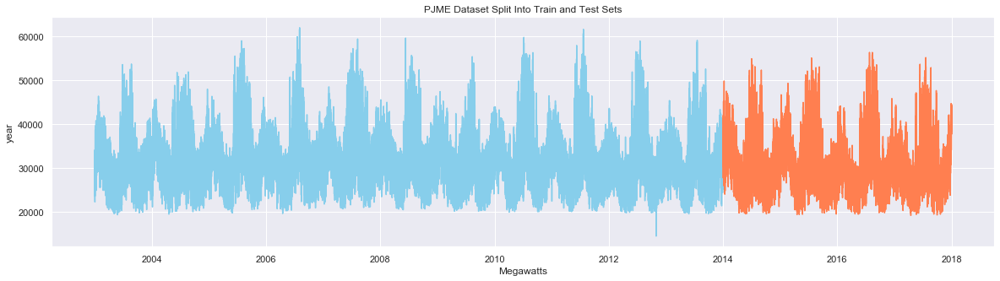

In [631]:
plt.figure(figsize=(20,5))
plt.plot(train_power['PJME'],color = 'skyblue', alpha = 1)

plt.plot(test_power['PJME'], color = 'coral', alpha = 1)
plt.grid(True)
plt.xlabel("Megawatts")
plt.ylabel('year')
plt.title("PJME Dataset Split Into Train and Test Sets")
plt.show()
#doesnt recognize hourly data 

## Finding Seasonal Period 

### Fast Fourier Transformation to Extract Seasonal Periods

In [632]:
#Check for missing dates and missing values 
Missing_dates = pd.date_range(start = train_power.PJME.first_valid_index(), end = train_power.PJME.last_valid_index() ).difference(train_power.index).to_list()
Missing_values = test_power.isin([np.nan]).sum()
print('missing Dates: {}\n'.format(Missing_dates), Missing_values)

missing Dates: []
 dst_flag               0
PJME                   0
Datetime               0
temp_PHL               0
temp_DOV               0
temp_KEWR              0
temp_KSBY              0
temp_KACY              0
pres_PHL               0
pres_DOV               0
pres_KEWR              0
pres_KSBY              0
pres_KACY              0
wspd_PHL               0
wspd_DOV               0
wspd_KEWR              0
wspd_KSBY              0
wspd_KACY              0
gust_PHL               0
gust_DOV               0
gust_KEWR              0
gust_KSBY              0
gust_KACY              0
dewPt_PHL              0
dewPt_DOV              0
dewPt_KEWR             0
dewPt_KSBY             0
dewPt_KACY             0
precip_hrly_PHL        0
precip_hrly_DOV        0
precip_hrly_KEWR       0
precip_hrly_KSBY       0
precip_hrly_KACY       0
snow_PHL               0
snow_DOV               0
snow_KEWR              0
snow_KSBY              0
snow_KACY              0
clds_PHL              46
clds_D

In [633]:
#to avoid complications from leap years we will only use 4 years worth of data for the fourier transformation
# this should be able to show us the period lengths for various seasons 
#21st century is therefore 2000, 2004, 2008, 2012, 2016, 2020, 2024, 2028, 2032, 2036, 2040, 2044, and 2048.

from numpy.fft import fft, fftfreq, ifft 
fft_start_date = '2010-01-01 00:00:00'
fft_end_date = '2014-01-01 00:00:00'
train_mask = (train_power.index > fft_start_date) & (train_power.index <= fft_end_date)

hourly_power = []
hourly_power =  train_power['PJME'].loc[train_mask].fillna(0).tolist()#.dropna().tolist()#.dropna().tolist().loc[fft_mask]



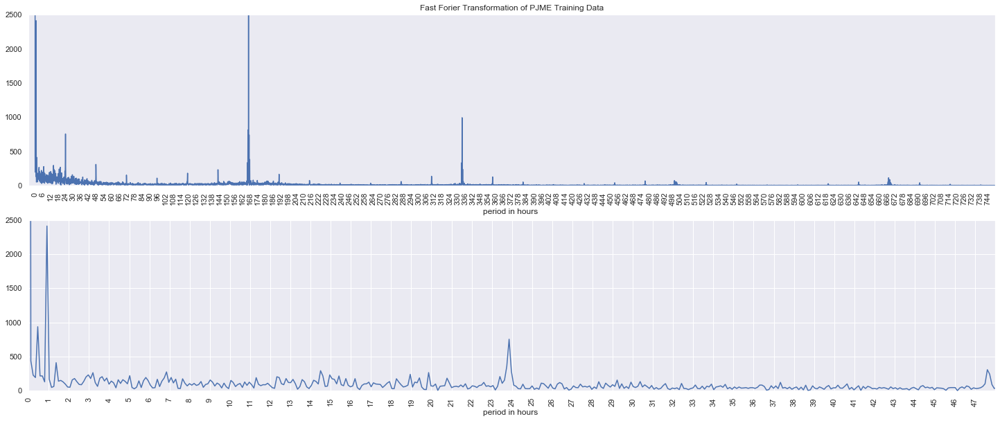

In [636]:

# Number of sample points
N = 35040
# sample spacing
T = 1.0 / 4000

x = np.linspace(0.0, N*T, N)
yf = fft(hourly_power)
xf = np.linspace(0.0, 1.0/(2.0*T), N//2)

#Plot the FFTransformaton results 
plt.figure(figsize=(25,10))
plt.tight_layout(pad=8,h_pad=8.0)
plt.subplot(2,1,1)
plt.title("Fast Forier Transformation of PJME Training Data")
plt.plot(xf, 1.0/N * np.abs(yf[0:N//2]))
plt.xlabel('period in hours ')

plt.xlim(-5,750)
plt.ylim(-5,2500)

plt.xticks(np.arange(0, 750, step=6),rotation=90)

plt.grid()

plt.subplot(2,1,2)
plt.plot(xf, 1.0/N * np.abs(yf[0:N//2]))
plt.xlabel('period in hours ')
plt.xlim(0,48)
plt.ylim(-5,2500)
plt.xticks(np.arange(0, 48, step=1),rotation=90)


plt.show()

Results from the Fast Fourier Transformation suggest that seasonality exists at intervals of 168 hours which is the length of a 7 day week. The plot also has a peak at 24 hours suggesting daily seasonality. 


### Check for Colinearity between the first differences and conduct PCA


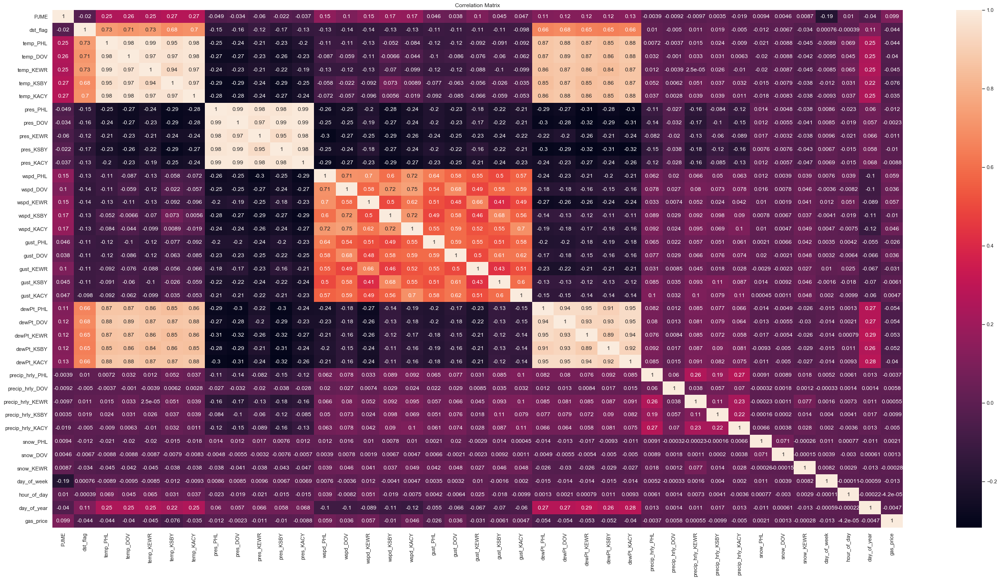

In [637]:
heat_corr  = train_power[[ 'PJME','dst_flag',
                          'Datetime', 'temp_PHL',
                          'temp_DOV', 'temp_KEWR',
                          'temp_KSBY', 'temp_KACY',
                          'pres_PHL', 'pres_DOV', 
                          'pres_KEWR', 'pres_KSBY',
                          'pres_KACY', 'wspd_PHL',
                          'wspd_DOV', 'wspd_KEWR',
                          'wspd_KSBY', 'wspd_KACY', 
                          'gust_PHL', 'gust_DOV',
                          'gust_KEWR', 'gust_KSBY',
                          'gust_KACY', 'dewPt_PHL',
                          'dewPt_DOV', 'dewPt_KEWR',
                          'dewPt_KSBY', 'dewPt_KACY', 
                          'precip_hrly_PHL', 'precip_hrly_DOV',
                          'precip_hrly_KEWR', 'precip_hrly_KSBY',
                          'precip_hrly_KACY', 'snow_PHL',
                          'snow_DOV', 'snow_KEWR',
                          'clds_PHL', 'clds_DOV',
                          'clds_KEWR', 'clds_KSBY', 
                          'clds_KACY', 'day_of_week',
                          'hour_of_day', 'day_of_year','gas_price']].corr()

plt.figure(figsize=(40,20))
sns.set(rc={ 'figure.facecolor':'w'})
sns.heatmap(heat_corr, annot=True) 
plt.title("Correlation Matrix")
plt.show()

In the above plot, the weather variables are highly co-linear. Therefore they will need to be combined via PCA.  Newark, Philadelphia, and Atlantic City show higher correlations with temperature and electrical consumption. This could be explained by the higher population densities in those areas, whereas the eastern shore has a very low population density. Most of the variables show little co-variance with the target variable PJME. This could be due to the lack of a relationship or it could be that the relationship is non-linear.
 


### PCA

In [638]:
#create a function to display the explained Variance related to principle components
def Number_of_Principle_Components(X_standardized,n_components):
    #Dimensionality reduction 
    # conduct principle compenent analysis on the data and examine the explained variance of the components
    from sklearn.decomposition import PCA
    sklearn_pca = PCA(n_components=n_components)
    Y_sklearn = sklearn_pca.fit_transform(X_standardized)
    pca = sklearn_pca.fit_transform(temp_std)
    plt.plot(sklearn_pca.explained_variance_ratio_)
    plt.show()
    print(
        'The percentage of total variance in the dataset explained by each',
        'component from Sklearn PCA.\n',
        sklearn_pca.explained_variance_ratio_
    )

    explained_variance = []
    explained_variance = sklearn_pca.explained_variance_ratio_

    total_variace = 0
    total_variace = 0
    components = 0
    num_prints = 0
    print('\n')
    for v in explained_variance:
        total_variace+=v
        components +=1

        if total_variace>=0.5 and total_variace<0.7 and num_prints < 1 :
            print(" to retain {}% of total variance  {} components are required".format(round(100*total_variace,2),components))
            num_prints+=1

        if total_variace>=0.7 and total_variace<0.8 and num_prints < 2 :
            print(" to retain {}% of total variance {} components required".format(round(100*total_variace,2),components))
            num_prints+=1

        elif total_variace>=0.8 and total_variace<0.9 and num_prints < 3 :
            print(" to retain {}% of total variance {} components required".format(round(100*total_variace,2),components))
            num_prints+=1

        elif total_variace>=0.9 and num_prints < 4  :
            print(" to retain {}% of total variance {} components required".format(round(100*total_variace,2),components))
            num_prints+=1

        else:
            None

    print(sum(explained_variance))

In [639]:
from sklearn.preprocessing import StandardScaler
#X_temp = train_power[['temp_PHL', 'temp_DOV', 'temp_KEWR', 'temp_KSBY', 'temp_KACY']].dropna()
X_temp = train_power[['temp_PHL',  'temp_KEWR','temp_DOV', 'temp_KACY']].dropna()

# Normalize the features
temp_scaler = StandardScaler()
temp_std = temp_scaler.fit_transform(X_temp)

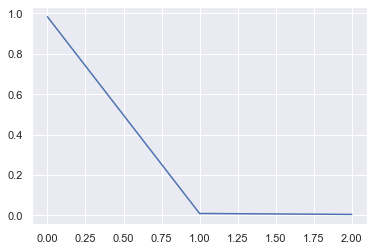

The percentage of total variance in the dataset explained by each component from Sklearn PCA.
 [0.98349734 0.00925431 0.00463695]


 to retain 98.35% of total variance 1 components required
 to retain 99.28% of total variance 2 components required
 to retain 99.74% of total variance 3 components required
0.9973885993805989


In [640]:
Number_of_Principle_Components(temp_std,3)

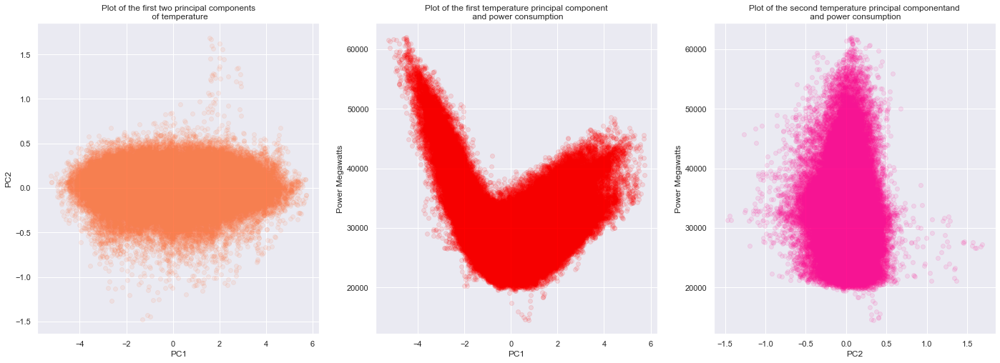

In [641]:
# For temperature We just want the first two principal components though only one will be needed 
from sklearn.decomposition import PCA
n_components=2
pca = PCA(n_components)
temp_pca_components = pca.fit_transform(temp_std)

#adding the principle components to the training dataframe 
for n in range(n_components):
    train_power['TempPC{}'.format(n+1)]= temp_pca_components[:, n]
plt.figure(figsize=(24,8))
plt.subplot(1,3,1)
plt.scatter(temp_pca_components[:,0],temp_pca_components[:,1],color ='coral',alpha=0.1)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Plot of the first two principal components\n of temperature')

plt.subplot(1,3,2)
plt.scatter(temp_pca_components[:,0],train_power['PJME'],color ='red',alpha=0.1)
plt.xlabel('PC1')
plt.ylabel('Power Megawatts')
plt.title('Plot of the first temperature principal component\n and power consumption')

plt.subplot(1,3,3)
plt.scatter(temp_pca_components[:,1],train_power['PJME'],color ='deeppink',alpha=0.1)
plt.xlabel('PC2')
plt.ylabel('Power Megawatts')
plt.title('Plot of the second temperature principal componentand\n and power consumption')
plt.show()

In [642]:
# Recreate the principle component for the test set 
X_temp_test = test_power[['temp_PHL',  'temp_KEWR','temp_DOV', 'temp_KACY']].dropna()
# Normalize the features
temp_std_test = temp_scaler.transform(X_temp_test)
temp_pca_test = pca.transform(temp_std_test)

#adding the principle components to the training dataframe 
for n in range(n_components):
    test_power['TempPC{}'.format(n+1)]= temp_pca_test[:, n]



In [643]:
#pressure

In [644]:
from sklearn.preprocessing import StandardScaler
X_press = train_power[['pres_PHL', 'pres_DOV', 'pres_KEWR', 'pres_KSBY', 'pres_KACY']].dropna()
# Normalize the features
std_press_scaler = StandardScaler()
press_std = std_press_scaler.fit_transform(X_press)

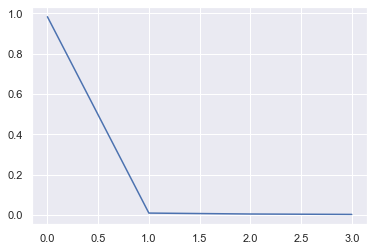

The percentage of total variance in the dataset explained by each component from Sklearn PCA.
 [0.98349734 0.00925431 0.00463695 0.0026114 ]


 to retain 98.35% of total variance 1 components required
 to retain 99.28% of total variance 2 components required
 to retain 99.74% of total variance 3 components required
 to retain 100.0% of total variance 4 components required
1.0


In [645]:
Number_of_Principle_Components(press_std,4)

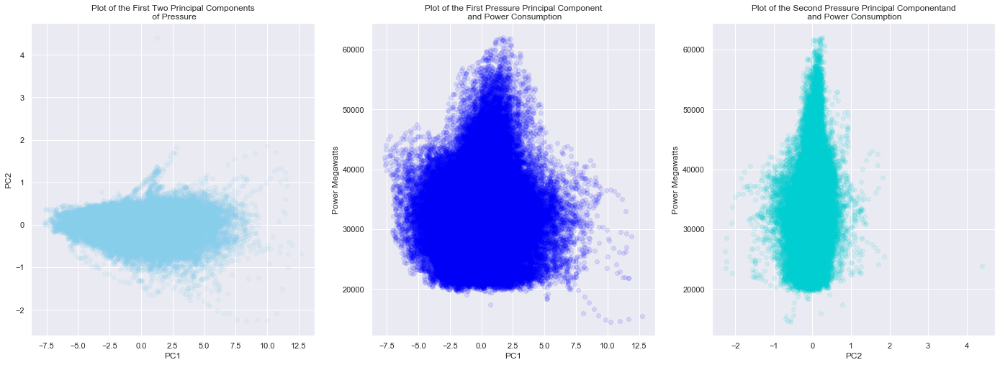

In [646]:
# 
# For pressure We just want the first two principal components
n_components=2
pca = PCA(n_components)
press_pca_components = pca.fit_transform(press_std)

#adding the principle components to the training dataframe 
for n in range(n_components):
    train_power['pressPC{}'.format(n+1)]= press_pca_components[:, n]
plt.figure(figsize=(24,8))
plt.subplot(1,3,1)
plt.scatter(press_pca_components[:,0],press_pca_components[:,1],color='skyblue',alpha=0.1)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Plot of the First Two Principal Components\n of Pressure')

plt.subplot(1,3,2)
plt.scatter(press_pca_components[:,0],train_power['PJME'],color='blue',alpha=0.1)
plt.xlabel('PC1')
plt.ylabel('Power Megawatts')
plt.title('Plot of the First Pressure Principal Component\n and Power Consumption')

plt.subplot(1,3,3)
plt.scatter(press_pca_components[:,1],train_power['PJME'],color='darkturquoise',alpha=0.1)
plt.xlabel('PC2')
plt.ylabel('Power Megawatts')
plt.title('Plot of the Second Pressure Principal Componentand\n and Power Consumption')
plt.show()
plt.show()

In [647]:
# Recreate the principle component for the test set 
X_press_test = test_power[['pres_PHL', 'pres_DOV', 'pres_KEWR', 'pres_KSBY', 'pres_KACY']].dropna()
# Normalize the features
press_std_test = std_press_scaler.transform(X_press_test)

press_pca_test = pca.transform(press_std_test)

#adding the principle components to the training dataframe 
for n in range(n_components):
    test_power['pressPC{}'.format(n+1)]= press_pca_test[:, n]


In [648]:
from sklearn.preprocessing import StandardScaler
X_wind = train_power[['wspd_PHL', 'wspd_DOV', 'wspd_KEWR', 'wspd_KSBY', 'wspd_KACY']].dropna()
# Normalize the features
std_wind_scaler = StandardScaler()
wind_std = std_press_scaler.fit_transform(X_wind)

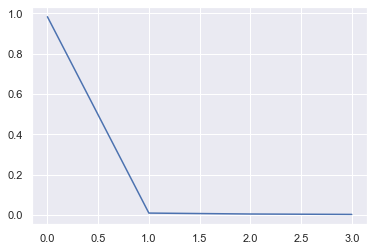

The percentage of total variance in the dataset explained by each component from Sklearn PCA.
 [0.98349734 0.00925431 0.00463695 0.0026114 ]


 to retain 98.35% of total variance 1 components required
 to retain 99.28% of total variance 2 components required
 to retain 99.74% of total variance 3 components required
 to retain 100.0% of total variance 4 components required
1.0


In [649]:
Number_of_Principle_Components(wind_std,4)

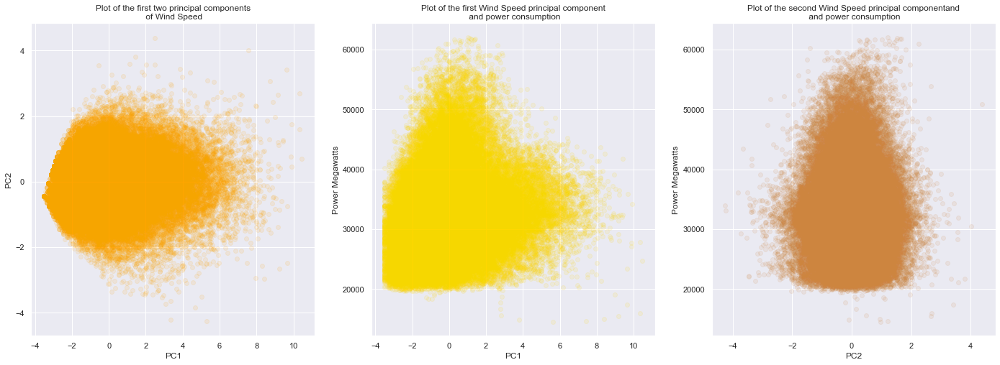

In [650]:
# 
# For pressure We just want the first two principal components
n_components=2
pca = PCA(n_components)
wind_pca_components = pca.fit_transform(wind_std)

#adding the principle components to the training dataframe 
for n in range(n_components):
    train_power['wspdPC{}'.format(n+1)]= wind_pca_components[:, n]
plt.figure(figsize=(24,8))
plt.subplot(1,3,1)
plt.scatter(wind_pca_components[:,0],wind_pca_components[:,1],color='orange',alpha=0.1)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Plot of the first two principal components\n of Wind Speed')

plt.subplot(1,3,2)
plt.scatter(wind_pca_components[:,0],train_power['PJME'],color='gold',alpha=0.1)
plt.xlabel('PC1')
plt.ylabel('Power Megawatts')
plt.title('Plot of the first Wind Speed principal component\n and power consumption')

plt.subplot(1,3,3)
plt.scatter(wind_pca_components[:,1],train_power['PJME'],color='peru',alpha=0.1)
plt.xlabel('PC2')
plt.ylabel('Power Megawatts')
plt.title('Plot of the second Wind Speed principal componentand\n and power consumption')
plt.show()
plt.show()

In [651]:
# Recreate the principle component for the test set 
X_wspd_test = test_power[['wspd_PHL', 'wspd_DOV', 'wspd_KEWR', 'wspd_KSBY', 'wspd_KACY']].dropna()
# Normalize the features
wspd_std_test = std_press_scaler.transform(X_wspd_test)

press_pca_test = pca.transform(wspd_std_test)

#adding the principle components to the training dataframe 
for n in range(n_components):
    test_power['wspdPC{}'.format(n+1)]= press_pca_test[:, n]


In [652]:
from sklearn.preprocessing import StandardScaler
X_dew = train_power[['dewPt_PHL', 'dewPt_DOV', 'dewPt_KEWR', 'dewPt_KSBY', 'dewPt_KACY']].dropna()
# Normalize the features
std_dew_scaler = StandardScaler()
dew_std = std_press_scaler.fit_transform(X_dew)

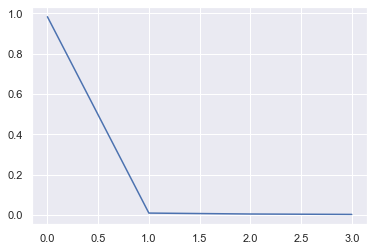

The percentage of total variance in the dataset explained by each component from Sklearn PCA.
 [0.98349734 0.00925431 0.00463695 0.0026114 ]


 to retain 98.35% of total variance 1 components required
 to retain 99.28% of total variance 2 components required
 to retain 99.74% of total variance 3 components required
 to retain 100.0% of total variance 4 components required
1.0


In [653]:
Number_of_Principle_Components(dew_std,4)

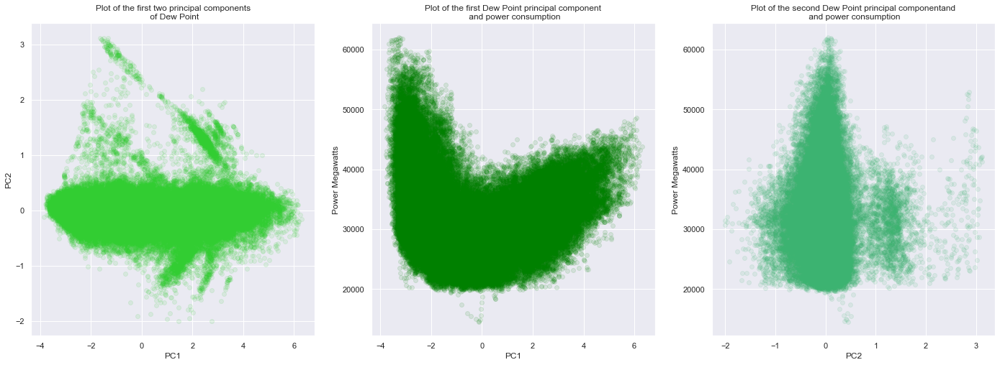

In [654]:
# 
# For pressure We just want the first two principal components
n_components=2
pca = PCA(n_components)
dew_pca_components = pca.fit_transform(dew_std)

#adding the principle components to the training dataframe 
for n in range(n_components):
    train_power['dewPtPC{}'.format(n+1)]= dew_pca_components[:, n]
plt.figure(figsize=(24,8))
plt.subplot(1,3,1)
plt.scatter(dew_pca_components[:,0],dew_pca_components[:,1],color='limegreen',alpha=0.1)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Plot of the first two principal components\n of Dew Point')

plt.subplot(1,3,2)
plt.scatter(dew_pca_components[:,0],train_power['PJME'],color='green',alpha=0.1)
plt.xlabel('PC1')
plt.ylabel('Power Megawatts')
plt.title('Plot of the first Dew Point principal component\n and power consumption')

plt.subplot(1,3,3)
plt.scatter(dew_pca_components[:,1],train_power['PJME'],color='mediumseagreen',alpha=0.1)
plt.xlabel('PC2')
plt.ylabel('Power Megawatts')
plt.title('Plot of the second Dew Point principal componentand\n and power consumption')
plt.show()
plt.show()

In [655]:
# Recreate the principle component for the test set 
X_dewPt_test = test_power[['dewPt_PHL', 'dewPt_DOV', 'dewPt_KEWR', 'dewPt_KSBY', 'dewPt_KACY']].dropna()
# Normalize the features
dewPt_std_test = std_press_scaler.transform(X_dewPt_test)

dewPt_pca_test = pca.transform(dewPt_std_test)

#adding the principle components to the training dataframe 
for n in range(n_components):
    test_power['dewPtPC{}'.format(n+1)]= press_pca_test[:, n]


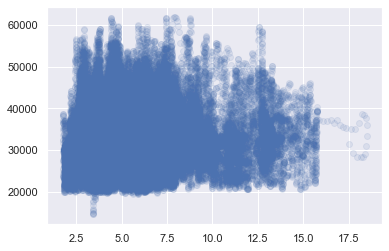

,gas_price,PJME
gas_price,1.000000,0.099129
PJME,0.099129,1.000000


In [656]:


plt.scatter(train_power['gas_price'],train_power['PJME'],alpha = 0.1)
plt.show()

train_power[['gas_price','PJME']].corr()

### Compare the Correlation Between the Principal Components 

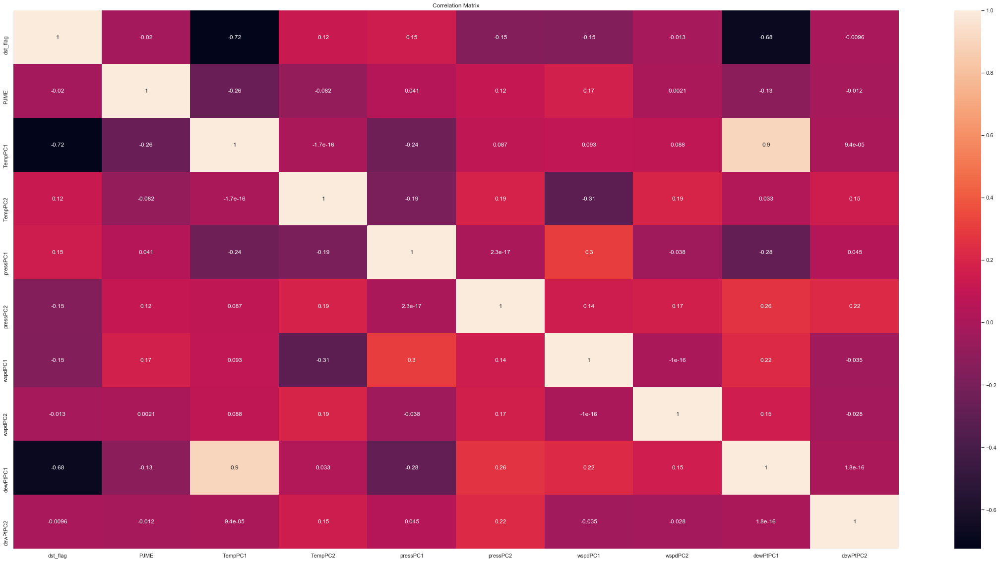

In [657]:
## corelation of the first differences

heat_corr = train_power[['dst_flag', 'PJME',
                                     'TempPC1', 'TempPC2',
                                      'pressPC1', 'pressPC2',
                                      'wspdPC1','wspdPC2',
                                     'dewPtPC1','dewPtPC2']].corr()

plt.figure(figsize=(40,20))
sns.set(rc={ 'figure.facecolor':'w'})
sns.heatmap(heat_corr, annot=True) 
plt.title("Correlation Matrix")
plt.show()

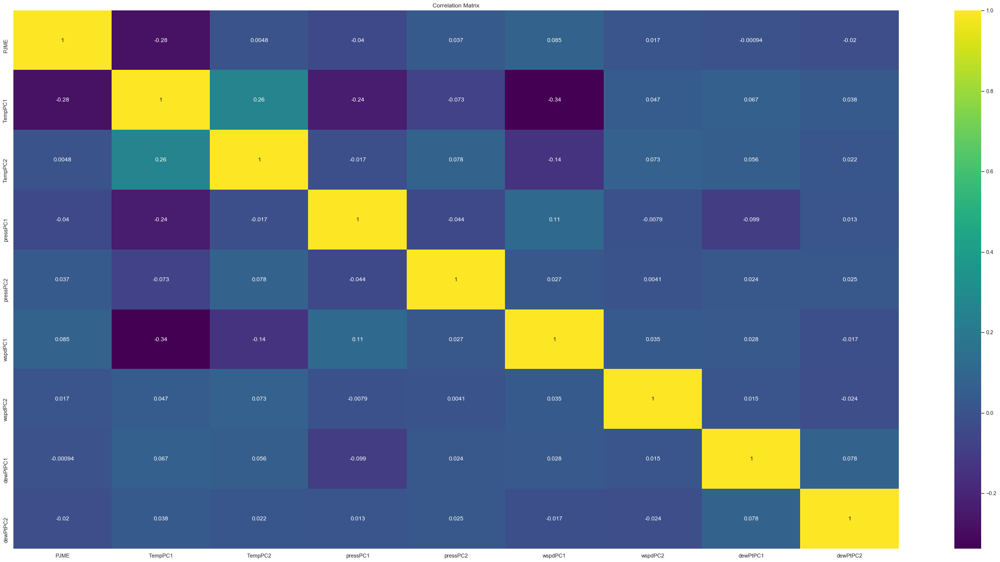

In [658]:
## corelation of the first differences
train_power_first_diff = pd.DataFrame()
train_power_first_diff = train_power[['dst_flag', 'PJME',
                                     'TempPC1', 'TempPC2',
                                      'pressPC1', 'pressPC2',
                                      'wspdPC1','wspdPC2',
                                     'dewPtPC1','dewPtPC2']].diff(1)
heat_corr = train_power_first_diff.corr()

plt.figure(figsize=(40,20))
sns.set(rc={ 'figure.facecolor':'w'})
sns.heatmap(heat_corr, annot=True,cmap='viridis') 
plt.title("Correlation Matrix")
plt.show()

## Unsupervised Learning 

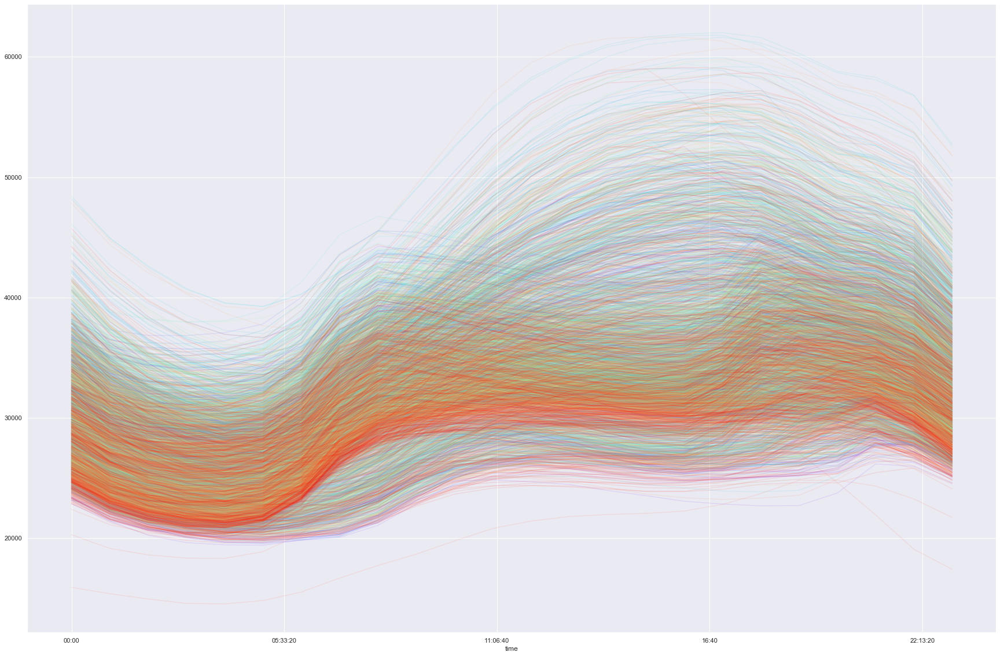

In [659]:
# create a dataframe with the index reset to local time 
unsup_df = pd.DataFrame()
unsup_df = train_power.set_index('Datetime')

PJME_pivoted = unsup_df.pivot_table('PJME', index =unsup_df.index.time,columns = unsup_df.index.date)


Month_of_Year = pd.DatetimeIndex(PJME_pivoted.columns).month
PJME_pivoted.plot(legend = False,c= Month_of_Year, cmap = 'rainbow', alpha=0.1,figsize = (30,20))
plt.show()

The plot above shows each day ploted overtop of one another and hued by season.

In [660]:
PJME_pivoted = PJME_pivoted.dropna(axis=1)
X_piv=PJME_pivoted.T.values
X_piv.shape


(3995, 24)

In [661]:

# Normalize the features
scaler = StandardScaler()
X_piv_std = scaler.fit_transform(X_piv)

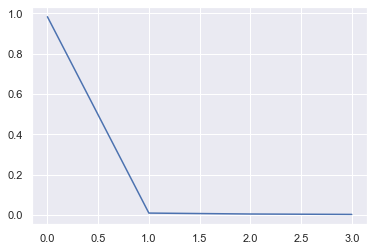

The percentage of total variance in the dataset explained by each component from Sklearn PCA.
 [0.98349734 0.00925431 0.00463695 0.0026114 ]


 to retain 98.35% of total variance 1 components required
 to retain 99.28% of total variance 2 components required
 to retain 99.74% of total variance 3 components required
 to retain 100.0% of total variance 4 components required
1.0


In [662]:
Number_of_Principle_Components(X_piv_std,4)

In [663]:
#from sklearn.decomposition import PCA
# use 4 compoents 
X2=pd.DataFrame()
X2 = PCA(4,svd_solver='full').fit_transform(X_piv_std)


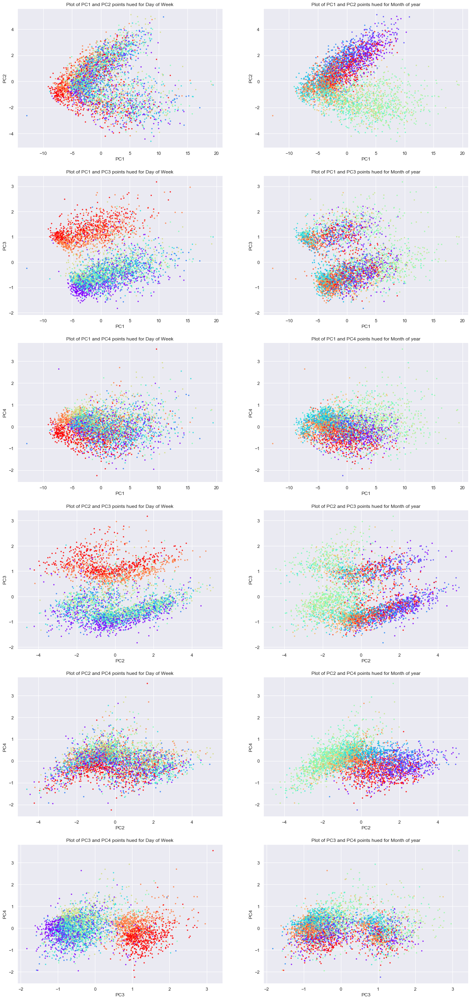

In [664]:
xplot = X2[:,0]
yplot = X2[:,1]
zplot = X2[:,2]
aplot = X2[:,3]

day_of_week = pd.DatetimeIndex(PJME_pivoted.columns).dayofweek
Month_of_Year = pd.DatetimeIndex(PJME_pivoted.columns).month
#Year = pd.DatetimeIndex(PJME_pivoted.index).year

plt.figure(figsize=[20,90])
p=0
for i in np.arange(0,3,1):  
    for j in np.arange((i+1),4,1):
        #increment the counter to the next subplotlevel
        p+=2
        plt.subplot(12,2,p-1)
        plt.scatter(X2[:,i],X2[:,j],c=day_of_week,s=5,cmap='rainbow',alpha = 0.8)
        plt.xlabel('PC{}'.format(str(i+1)))
        plt.ylabel('PC{}'.format(str(j+1)))
        plt.title('Plot of PC{} and PC{} points hued for Day of Week'.format(str(i+1),str(j+1)))

        plt.subplot(12,2,p)
        plt.scatter(X2[:,i],X2[:,j],c=Month_of_Year,s=5,cmap='rainbow',alpha = 0.8)
        plt.xlabel('PC{}'.format(str(i+1)))
        plt.ylabel('PC{}'.format(str(j+1)))
        plt.title('Plot of PC{} and PC{} points hued for Month of year'.format(str(i+1),str(j+1)))


plt.show()

In the plots above of Principle component 1,2,3 two clusters are visible and are seperable by the day of the week. 

In [665]:

# Dimensionality reduction 
#UMAP
# try setting min distance to 0.1 or 0.15
#time_start = time.time()

umap_results = umap.UMAP(n_neighbors=30,
                      min_dist=0.1,
                      #metric='correlation',
                    metric='cosine',
                        n_components=2,
                        random_state=42
                        ).fit_transform(X_piv_std)

#print('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

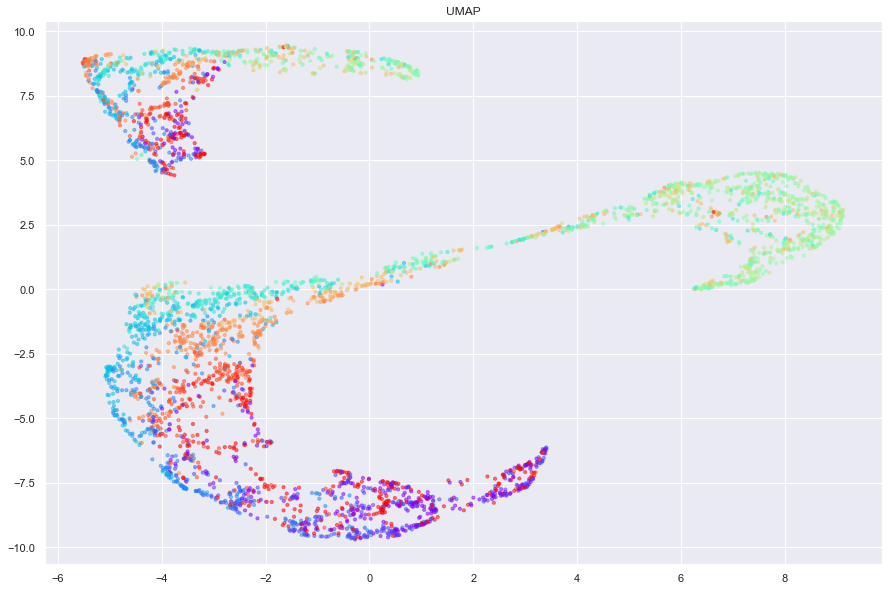

In [666]:
#plot the first two results of each reduction technique
plt.figure(figsize=(15,10))
plt.title('UMAP')


plt.scatter(umap_results[:,0],  umap_results[:,1],#color=(color_array),
            c=Month_of_Year,
            cmap='rainbow',
             s=10, alpha = .5)
plt.show()

In [667]:

X2_1,X2_2,umap_1,umap_2,= train_test_split(X2,
                                            umap_results,
                                            test_size=0.5,
                                            random_state=135)



In [668]:

gmm = GaussianMixture(n_components=2,covariance_type ='tied', random_state=42)# full tied diag sphere
scaler = StandardScaler()
X2_1_std = scaler.fit_transform(X2_1)
X2_2_std = scaler.fit_transform(X2_2)

#gmm.fit(X2[:,(0,2)])
gmm_labels1 = gmm.fit_predict(X2_1_std[:,(1,2,3)])
gmm_labels2 = gmm.fit_predict(X2_2_std[:,(1,2,3)])

#gmm_labels = gmm.fit_predict(X2_1_std[:,(1,2,3)])

day_of_week = pd.DatetimeIndex(PJME_pivoted.columns).dayofweek
Month_of_Year = pd.DatetimeIndex(PJME_pivoted.columns).month
print(day_of_week)

Int64Index([2, 3, 4, 5, 6, 0, 1, 2, 3, 4,
            ...
            6, 0, 1, 2, 3, 4, 5, 6, 0, 1], dtype='int64', length=3995)


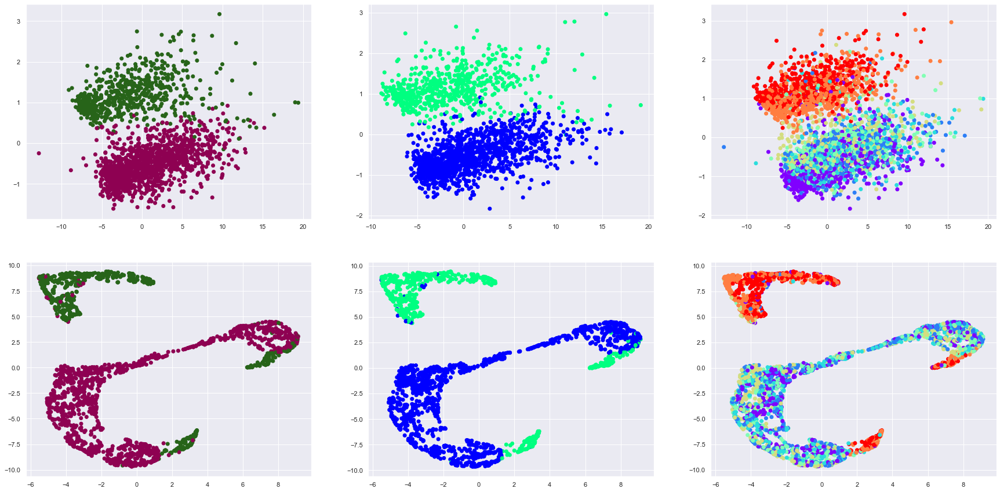

the silhouette score for group 1: 0.3118673511408589 
the silhouette score for group 2: 0.3106149257529404


In [669]:
xplot = X2[:,1]
yplot = X2[:,2]
zplot = X2[:,0]
plt.figure(figsize=[30,15])
plt.subplot(2,3,1)
plt.scatter(X2_1[:,0], X2_1[:,2],c=gmm_labels1,cmap='PiYG')
plt.subplot(2,3,2)
plt.scatter(X2_2[:,0], X2_2[:,2],c=gmm_labels2,cmap='winter',)
plt.subplot(2,3,3)
plt.scatter(X2[:,0], X2[:,2],c=day_of_week,cmap='rainbow',)
plt.subplot(2,3,4)

plt.scatter( umap_1[:,0], umap_1[:,1],c=gmm_labels1,cmap='PiYG',)
plt.subplot(2,3,5)

plt.scatter( umap_2[:,0], umap_2[:,1],c=gmm_labels2,cmap='winter',)

plt.subplot(2,3,6)
plt.scatter( umap_results[:,0], umap_results[:,1],c=day_of_week,cmap='rainbow',)

plt.show()


sil_score1 = metrics.silhouette_score(X2_1_std[:,(1,2,3)], gmm_labels1, metric='mahalanobis')
sil_score2 = metrics.silhouette_score(X2_2_std[:,(1,2,3)], gmm_labels2, metric='mahalanobis')
print('the silhouette score for group 1:', sil_score1,'\nthe silhouette score for group 2:',sil_score2)

In [670]:
#Apply the Clustering to the rest of the group
X2_std = scaler.fit_transform(X2)
#gmm.fit(X2[:,(0,2)])
#gmm_labels = gmm.fit_predict(X2_std[:,(1,2,3)])
gmm_labels = gmm.fit_predict(X2_std[:,(1,2,3)])


In [671]:
from sklearn.mixture import GaussianMixture
#gmm = GaussianMixture(3)
gmm = GaussianMixture(n_components=2,covariance_type ='tied', random_state=42)# full tied diag sphere
scaler = StandardScaler()
X2_std = scaler.fit_transform(X2)
#gmm.fit(X2[:,(0,2)])
#gmm_labels = gmm.fit_predict(X2_std[:,(1,2,3)])
gmm_labels = gmm.fit_predict(X2_std[:,(1,2,3)])

day_of_week = pd.DatetimeIndex(PJME_pivoted.columns).dayofweek
Month_of_Year = pd.DatetimeIndex(PJME_pivoted.columns).month
print(day_of_week)

Int64Index([2, 3, 4, 5, 6, 0, 1, 2, 3, 4,
            ...
            6, 0, 1, 2, 3, 4, 5, 6, 0, 1], dtype='int64', length=3995)


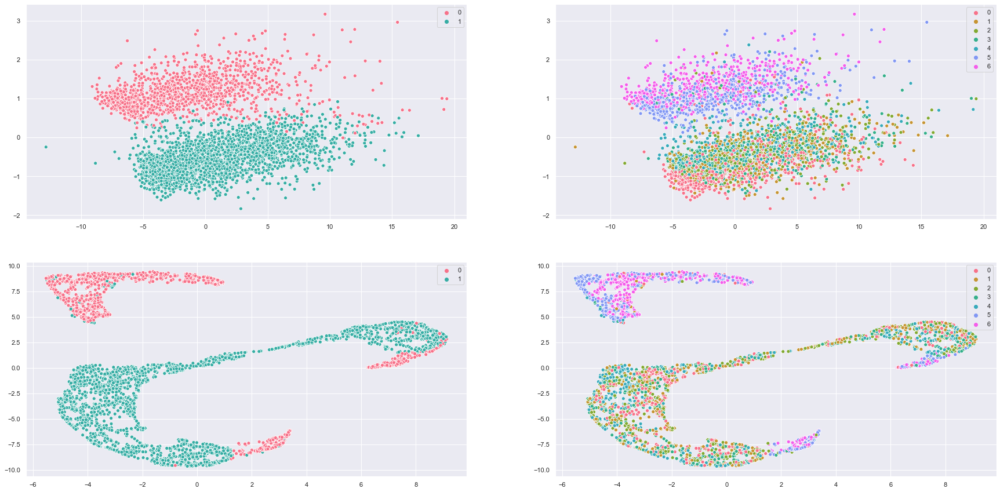

Number of days in cluster 0: 1267
Number of days in cluster 1: 2728
the Silhouette score for the entire data is  0.26819477416908954


In [672]:
xplot = X2[:,1]
yplot = X2[:,2]
zplot = X2[:,0]

plt.figure(figsize=[30,15])
plt.subplot(2,2,1)
cmap1=sns.color_palette("husl", 2)
cmap2=sns.color_palette("husl", 7)

sns.scatterplot(x = X2[:,0],y =  X2[:,2],palette=cmap1,hue=gmm_labels)
#plt.legend([gmm_labels])

plt.subplot(2,2,2)
sns.scatterplot(x=X2[:,0], y=X2[:,2],palette=cmap2,hue=day_of_week)

plt.subplot(2,2,3)
cmap=sns.color_palette("husl", 2)
sns.scatterplot( x=umap_results[:,0], y=umap_results[:,1],palette=cmap1,hue=gmm_labels)
#plt.legend([gmm_labels])

plt.subplot(2,2,4)
sns.scatterplot( x=umap_results[:,0], y=umap_results[:,1],palette=cmap2,hue=day_of_week)

plt.show()
sil_score = metrics.silhouette_score(X2_std, gmm_labels, metric='mahalanobis')

print('Number of days in cluster 0:',len(gmm_labels)-np.count_nonzero(gmm_labels))
print('Number of days in cluster 1:',np.count_nonzero(gmm_labels))
print('the Silhouette score for the entire data is ',sil_score)

### Explore Clusters

In [673]:
dates = pd.DatetimeIndex(PJME_pivoted.columns)
print('group 0 length:{}'.format(len(dates[(gmm_labels == 0)])))
print('group 1 length:{}'.format(len(dates[(gmm_labels == 1)])))
print('group 0 Weekday length:{}'.format(len(dates[(gmm_labels == 0)&(day_of_week<5)])))
print('group 0 Weekend length:{}'.format(len(dates[(gmm_labels == 0)&(day_of_week>=5)])))
print('group 1 Weekend length:{}'.format(len(dates[(gmm_labels == 1)&(day_of_week>=5)])))
print('group 1 Weekday length:{}'.format(len(dates[(gmm_labels == 1)&(day_of_week<5)])))


group 0 length:1267
group 1 length:2728
group 0 Weekday length:150
group 0 Weekend length:1117
group 1 Weekend length:9
group 1 Weekday length:2719


#### Extract Holidays from Clusters

In [674]:
#create a list of holidays and their adjacent days for the entire data series 
from datetime import datetime, timedelta
from pandas.tseries.holiday import USFederalHolidayCalendar as calendar
PJME_pivoted.columns
#train_power.PJME.last_valid_index().date
#dr = pd.date_range(start=train_power.PJME.first_valid_index().date(), end=train_power.PJME.last_valid_index().date())
power.PJME.last_valid_index().date
dr = pd.date_range(start=power.PJME.first_valid_index().date(), end=power.PJME.last_valid_index().date())

df = pd.DataFrame()
df['Date'] = dr
cal = calendar()
Hol_names=[]
Holi_dates=[]

Holi_names = cal.holidays(start=dr.min(), end=dr.max(),return_name=True).to_list()
Holi_dates = cal.holidays(start=dr.min(), end=dr.max()).to_list()
holidays = np.column_stack((Holi_dates, Holi_names))

#create a list of days adjacent to holidays to acount for travel days and unmarked vactation days
vaca_name=[]
vaca_dates=[] 
#vacations = []
adjac_holidays = []
for i in range(-2,3):
    if i<0:
        for j, holiday in enumerate(holidays):
            vaca_name.append(holidays[j,1]+' {}'.format(i))
            vaca_dates.append(holidays[j,0]- timedelta(days=i)) 
    elif i>0:
        for j, holiday in enumerate(holidays):
            vaca_name.append(holidays[j,1]+' +{}'.format(i))
            vaca_dates.append(holidays[j,0]- timedelta(days=i))
    else:
        None

adjac_holidays = np.column_stack([vaca_dates,vaca_name])
vacation_days = np.concatenate([holidays,adjac_holidays],axis=0)

# add the adjacent 
#vacation_days=np.append(holidays,new_holidays)


In [675]:
#create lists which contain dates that are cluster 0 weekdays and fall into vacation days or weather outage days
weekends = dates[(day_of_week>=5)]
weekday_holidays=dates[(gmm_labels == 0)&(day_of_week<5)&(dates.isin(vacation_days[:,0])==True)].to_list()
week_day_vacadays=dates[(gmm_labels == 0)&(day_of_week<5)&(dates.isin(vacation_days[:,0])==True)].to_list()
cluster0_weekday_hoidays = dates[(gmm_labels == 0)&(day_of_week<5)&(dates.isin(vacation_days[:,0])==True)]#.astype(str)
unclustered_weekday_hoidays = dates[(gmm_labels == 1)&(day_of_week<5)&(dates.isin(vacation_days[:,0])==True)]#.astype(str)


In [676]:
week_day_vacadays
holidays_in_cluster=[]
for day in week_day_vacadays:
    #print(vacation_days[:,1][vacation_days[:,0]==day])
    holidays_in_cluster = np.append(holidays_in_cluster,vacation_days[:,1][vacation_days[:,0]==day])
print(len(holidays_in_cluster))    
print(np.unique(holidays_in_cluster))
type(holidays_in_cluster)

84
['Christmas' 'Christmas +1' 'July 4th' 'July 4th +1' 'July 4th +2'
 'July 4th -1' 'July 4th -2' 'Labor Day' 'Memorial Day' 'New Years Day'
 'New Years Day +1' 'New Years Day +2' 'New Years Day -1' 'Presidents Day'
 'Thanksgiving' 'Thanksgiving -1']


numpy.ndarray

In [677]:
#create a column in the train and test set to flag holidays hourly
holidays_to_flag = ['Christmas', 'Christmas 1', 'July 4th', 'July 4th -1', 'July 4th -2',
 'July 4th 1', 'July 4th 2', 'Labor Day', 'Memorial Day', 'New Years Day',
 'New Years Day -1', 'New Years Day 1', 'New Years Day 2', 'Presidents Day',
 'Thanksgiving', 'Thanksgiving -1']
holiday_flags=[]
for i in range(0,24):
        holiday_flags=np.append(holiday_flags,(vacation_days[:,0][np.isin(vacation_days[:,1],holidays_to_flag)]+timedelta(hours=i)))
      
    
holiday_flags.flatten()

        

array([Timestamp('2003-01-01 00:00:00'), Timestamp('2003-02-17 00:00:00'),
       Timestamp('2003-05-26 00:00:00'), ...,
       Timestamp('2017-07-05 23:00:00'), Timestamp('2017-11-24 23:00:00'),
       Timestamp('2018-01-02 23:00:00')], dtype=object)

In [678]:
# add the holiday flags to the dataframes
train_power['holiday_flags'] = train_power.index.isin(holiday_flags)

test_power['holiday_flags'] = test_power.index.isin(holiday_flags)


Holidays and the adjacent days in gmm cluster 0 were flagged with booleans and added to the train and test data frame.   
Holidays in the weekend cluster0:
- Christmas
- the day after Christmas
- July 4th 
- the two days after July 4th
- the two days before July 4th 
- Labor Day
- Memorial Day
- New Years Day
- the two days after New Years Day
- New Years Eve
- Presidents Day
- Thanksgiving
- the day before Thanksgiving 

Weekday Holidays in the weekday cluster1:
- MLK day 
- Columbus Day 
- Veterans Day


### Extract extreme weather events from clusters 

In [699]:
# get descriptive statistics for the outagas dataset
outages_df.describe()

,Year,Demand Loss (MW)
count,159.000000,159.000000
mean,2009.238994,1531.792453
std,3.216766,7259.807727
min,2002.000000,0.000000
25%,2007.000000,0.000000
50%,2010.000000,0.000000
75%,2012.000000,260.000000
max,2014.000000,60512.000000


In [700]:
# create a list of outage dates
outages_start = outages_df.start_date.to_list()
outages_end = outages_df.end_date.to_list()
outage_dates=[]
for i,date in enumerate(outages_start):
    outage_dates.append(pd.date_range(start=date, end=outages_end[i]))
#flatten the list
flat_list = []
for time_index in outage_dates:
    flat_list = np.append(flat_list,time_index.to_pydatetime())#index.values)
outage_dates = flat_list
                        

In [702]:
# test to see if any of the clusterd days fall into the outage list
clustered_outages = dates[(gmm_labels == 1)&(day_of_week<5)&(dates.isin(outage_dates)==True)]#.astype(str)
#&(dates.isin(outage_dates)==True)
#&(~dates.isin(vacation_days[:,0])==True)
print(len(clustered_outages))

167


In [704]:
#create a new dataframe to store the outage information that has been cross refreenced with Cluster0
pertinant_outages=pd.DataFrame()
pertinant_outages = outages_df.loc[outages_df.start_date.isin(clustered_outages)]
pertinant_outages['log_Demand_Loss_MW'] = np.log(pertinant_outages['Demand Loss (MW)']+1)

In [711]:
train_power[['temp_PHL', 'temp_DOV',
            'temp_KEWR', 'temp_KSBY',
            'temp_KACY', 'pres_PHL',
            'pres_DOV', 'pres_KEWR',
            'pres_KSBY', 'pres_KACY',
            'wspd_PHL', 'wspd_DOV',
            'wspd_KEWR', 'wspd_KSBY',
            'wspd_KACY', 'gust_PHL', 
            'gust_DOV', 'gust_KEWR', 
            'gust_KSBY', 'gust_KACY',
            'dewPt_PHL', 'dewPt_DOV',
            'dewPt_KEWR', 'dewPt_KSBY',
            'dewPt_KACY', 'precip_hrly_PHL', 
            'precip_hrly_DOV', 'precip_hrly_KEWR', 
            'precip_hrly_KSBY', 'precip_hrly_KACY',
            'snow_PHL', 'snow_DOV',
            'snow_KEWR', 'snow_KSBY',
            'snow_KACY', 'clds_PHL',
            'clds_DOV', 'clds_KEWR',
            'clds_KSBY', 'clds_KACY']].loc[train_power.Datetime.isin(clustered_outages)].describe()




,temp_PHL,temp_DOV,temp_KEWR,temp_KSBY,temp_KACY,pres_PHL,pres_DOV,pres_KEWR,pres_KSBY,pres_KACY,wspd_PHL,wspd_DOV,wspd_KEWR,wspd_KSBY,wspd_KACY,gust_PHL,gust_DOV,gust_KEWR,gust_KSBY,gust_KACY,dewPt_PHL,dewPt_DOV,dewPt_KEWR,dewPt_KSBY,dewPt_KACY,precip_hrly_PHL,precip_hrly_DOV,precip_hrly_KEWR,precip_hrly_KSBY,precip_hrly_KACY,snow_PHL,snow_DOV,snow_KEWR,snow_KSBY,snow_KACY
count,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.00000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.0,167.0,167.000000,167.0,167.0
mean,59.275449,58.251497,59.023952,57.017964,56.928144,29.959521,29.94018,29.931437,29.926347,29.896168,8.443114,9.119760,9.658683,5.688623,6.946108,2.988024,4.497006,4.059880,3.574850,4.005988,48.125749,50.682635,45.239521,50.269461,48.748503,0.003353,0.001796,0.005509,0.005449,0.004012,0.0,0.0,0.005988,0.0,0.0
std,18.285442,17.564586,18.421096,17.665047,17.959314,0.236181,0.23525,0.253449,0.255968,0.258976,5.932964,6.343389,5.791323,6.286248,6.680540,9.251498,11.035471,10.483895,9.884518,10.547938,20.233629,19.627891,20.773654,19.984162,20.262648,0.012055,0.013984,0.031078,0.025191,0.021342,0.0,0.0,0.077382,0.0,0.0
min,18.000000,19.000000,15.000000,6.000000,14.000000,28.980000,28.96000,28.800000,28.680000,28.560000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,2.000000,-3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0
25%,45.000000,44.500000,44.500000,43.000000,43.000000,29.840000,29.82000,29.815000,29.815000,29.785000,5.000000,5.500000,6.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,34.000000,38.000000,30.000000,36.000000,35.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0
50%,65.000000,64.000000,64.000000,63.000000,60.000000,29.950000,29.94000,29.930000,29.940000,29.900000,8.000000,7.000000,8.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,54.000000,57.000000,52.000000,58.000000,56.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0
75%,74.000000,73.000000,74.500000,71.500000,72.000000,30.110000,30.09000,30.090000,30.080000,30.050000,10.500000,12.000000,12.000000,8.000000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,66.000000,68.000000,63.000000,68.000000,66.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0
max,87.000000,84.000000,89.000000,93.000000,88.000000,30.530000,30.53000,30.530000,30.510000,30.480000,34.000000,34.000000,46.000000,28.000000,36.000000,48.000000,46.000000,72.000000,48.000000,51.000000,76.000000,76.000000,73.000000,78.000000,75.000000,0.080000,0.170000,0.290000,0.220000,0.230000,0.0,0.0,1.000000,0.0,0.0


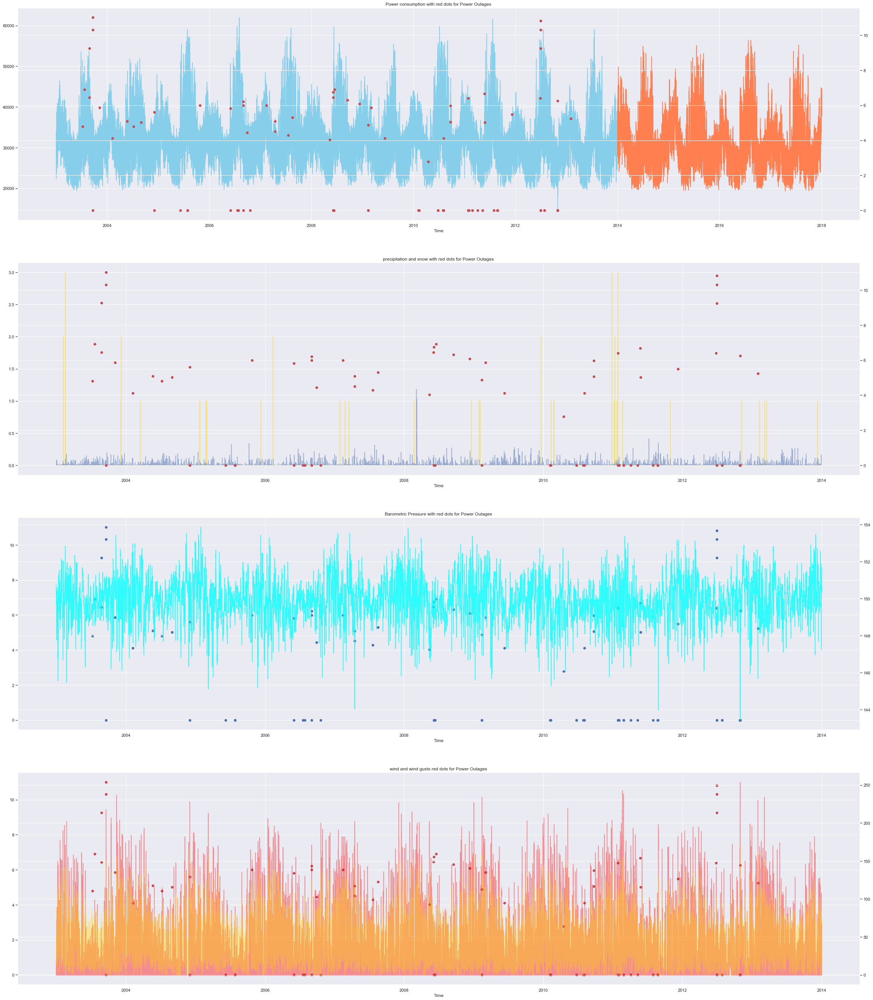

In [709]:

plt.figure(figsize=(40,60))
plt.subplot(5,1,1)
plt.title('Power consumption with red dots for Power Outages ')
plt.xlabel('Megawatts')
plt.xlabel('Time')

plt.plot(train_power['PJME'],color = 'skyblue', alpha = 1)
plt.plot(test_power['PJME'], color = 'coral', alpha = 1)
plt.twinx()
plt.scatter(pertinant_outages['start_date_time'],pertinant_outages['log_Demand_Loss_MW'],color='r')

plt.subplot(5,1,2)
plt.title('precipitation and snow with red dots for Power Outages ')
plt.xlabel('Inches per Hour')
plt.xlabel('Time')
plt.plot(train_power[['snow_PHL','snow_DOV','snow_KEWR','snow_KSBY','snow_KACY']].sum(axis=1),color = 'gold', alpha = .5)
plt.plot(train_power[['precip_hrly_PHL','precip_hrly_DOV','precip_hrly_KEWR','precip_hrly_KSBY','precip_hrly_KACY']].mean(axis=1),color = 'b', alpha = .5)
plt.twinx()
plt.scatter(pertinant_outages['start_date_time'],pertinant_outages['log_Demand_Loss_MW'],color='r')

plt.subplot(5,1,3)
plt.title('Barometric Pressure with red dots for Power Outages ')
plt.xlabel('Barometric Pressure')
plt.xlabel('Time')
plt.scatter(pertinant_outages['start_date_time'],np.log(pertinant_outages['Demand Loss (MW)']+1))
plt.twinx()
plt.plot(train_power[['pres_PHL','pres_DOV','pres_KEWR','pres_KSBY','pres_KACY']].sum(axis=1),color = 'cyan', alpha = .8)

plt.subplot(5,1,4)
plt.title('wind and wind gusts red dots for Power Outages ')
plt.xlabel('wind and gust speed')
plt.xlabel('Time')
plt.scatter(pertinant_outages['start_date_time'],pertinant_outages['log_Demand_Loss_MW'],color='r')
plt.twinx()
plt.plot(train_power[['gust_PHL','gust_DOV','gust_KEWR','gust_KSBY','gust_KACY']].sum(axis=1),color = 'red', alpha = .4)
plt.plot(train_power[['wspd_PHL','wspd_DOV','wspd_KEWR','wspd_KSBY','wspd_KACY']].sum(axis=1),color = 'gold', alpha = .4)


plt.grid(True)
plt.show()
#doesnt recognize hourly data 

It appears that many of the outages are adjacent to extreme weather events, however there are also many extreme weather events and more data is needed on weather related power outages, including minor outages.  It may then be possible to measure the probability of an outage at a certain scale depending on the weather conditions. Below weather data is run through a umap to see if there are any discernable clusters for outages.

In [710]:
pivoted_weather = pd.DataFrame()
weather_var=['temp_PHL', 'temp_DOV',
             'temp_KEWR', 'temp_KSBY',
             'temp_KACY','pres_PHL', 
            'pres_DOV', 'pres_KEWR', 
            'pres_KSBY', 'pres_KACY',
            'wspd_PHL', 'wspd_DOV', 
            'wspd_KEWR', 'wspd_KSBY',
            'wspd_KACY', 'gust_PHL', 
            'gust_DOV', 'gust_KEWR',
            'gust_KSBY', 'gust_KACY',
            'dewPt_PHL', 'dewPt_DOV',
            'dewPt_KEWR', 'dewPt_KSBY',
            'dewPt_KACY', 'precip_hrly_PHL',
            'precip_hrly_DOV', 'precip_hrly_KEWR',
            'precip_hrly_KSBY', 'precip_hrly_KACY',
            'snow_PHL', 'snow_DOV', 
            'snow_KEWR', 'snow_KSBY', 'snow_KACY']
for var in weather_var:
    pivot = train_power.pivot_table(var, index =unsup_df.index.time,columns = unsup_df.index.date)

    pivoted_weather = pd.concat((pivoted_weather, pivot.T), axis=1)

In [680]:
train_power['true_outage_flags']=train_power.index.isin(outages_start)

In [681]:
X_weather = train_power[[ 'pres_PHL', 
            'pres_DOV', 'pres_KEWR', 
            'pres_KSBY', 'pres_KACY',
            'wspd_PHL', 'wspd_DOV', 
            'wspd_KEWR', 'wspd_KSBY',
            'wspd_KACY', 'gust_PHL', 
            'gust_DOV', 'gust_KEWR',
            'gust_KSBY', 'gust_KACY',
            'dewPt_PHL', 'dewPt_DOV',
            'dewPt_KEWR', 'dewPt_KSBY',
            'dewPt_KACY', 'precip_hrly_PHL',
            'precip_hrly_DOV', 'precip_hrly_KEWR',
            'precip_hrly_KSBY', 'precip_hrly_KACY',
            'snow_PHL', 'snow_DOV', 
            'snow_KEWR', 'snow_KSBY', 'snow_KACY']]

scaler = StandardScaler()
X_weather_std = scaler.fit_transform(X_weather.fillna(0))

In [682]:

# Dimensionality reduction 
#UMAP
# try setting min distance to 0.1 or 0.15
#time_start = time.time()

umap_weather_results = umap.UMAP(n_neighbors=10,
                      min_dist=0.2,
                      metric='correlation',
                    #metric='cosine',
                        n_components=2,
                        random_state=42
                        ).fit_transform(X_weather_std)

#print('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

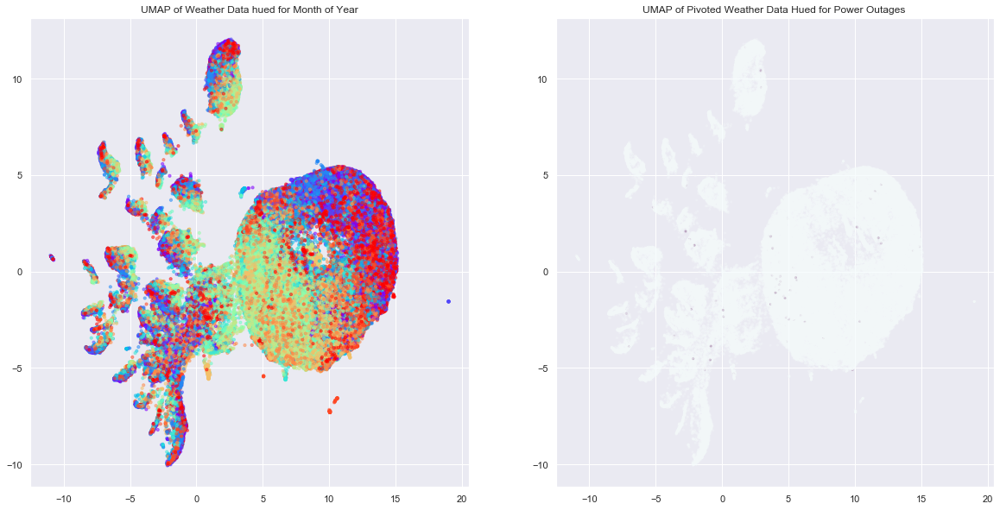

In [697]:
#plot the first two results of each reduction technique

Month_of_Year = pd.DatetimeIndex(train_power.index).month
outage_flags = train_power.index.isin(outages_start)

plt.figure(figsize=(20,10))

plt.subplot(1,2,1)
plt.title('UMAP of Weather Data hued for Month of Year')

plt.scatter(umap_weather_results[:,0],
            umap_weather_results[:,1],
            c=Month_of_Year,
            cmap='rainbow',
            s=10,
            alpha =.5)
plt.subplot(1,2,2)
plt.title('UMAP of Pivoted Weather Data Hued for Power Outages ')

plt.scatter(umap_weather_results[:,0],
            umap_weather_results[:,1],
            c=outage_flags,
            cmap='BuPu',
            s=5,
            alpha =.2)
plt.show()

In [685]:
from sklearn.manifold import TSNE

time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X_weather_std)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 96461 samples in 22.414s...
[t-SNE] Computed neighbors for 96461 samples in 277.260s...
[t-SNE] Computed conditional probabilities for sample 1000 / 96461
[t-SNE] Computed conditional probabilities for sample 2000 / 96461
[t-SNE] Computed conditional probabilities for sample 3000 / 96461
[t-SNE] Computed conditional probabilities for sample 4000 / 96461
[t-SNE] Computed conditional probabilities for sample 5000 / 96461
[t-SNE] Computed conditional probabilities for sample 6000 / 96461
[t-SNE] Computed conditional probabilities for sample 7000 / 96461
[t-SNE] Computed conditional probabilities for sample 8000 / 96461
[t-SNE] Computed conditional probabilities for sample 9000 / 96461
[t-SNE] Computed conditional probabilities for sample 10000 / 96461
[t-SNE] Computed conditional probabilities for sample 11000 / 96461
[t-SNE] Computed conditional probabilities for sample 12000 / 96461
[t-SNE] Computed conditional probabilities for

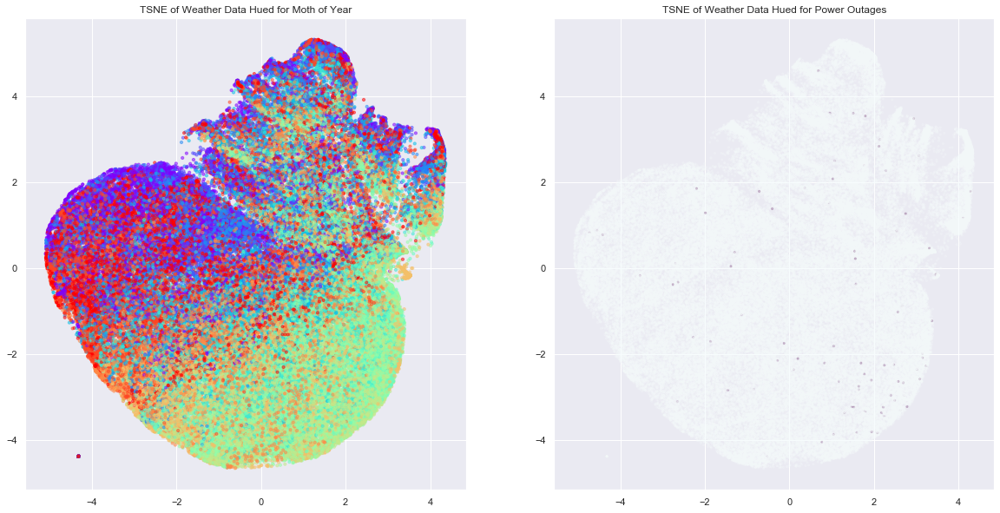

In [698]:
#plot the first two results of each reduction technique
plt.figure(figsize=(20,10))
plt.title('TSNE of Weather Data Hued for Power Outages')

plt.subplot(1,2,1)
plt.title('TSNE of Weather Data Hued for Moth of Year')

plt.scatter(tsne_results[:,0],
            tsne_results[:,1],
            c=Month_of_Year,
            cmap='rainbow',
            s=10,
            alpha =.5)
plt.subplot(1,2,2)
plt.title('TSNE of Weather Data Hued for Power Outages')

plt.scatter(tsne_results[:,0],
            tsne_results[:,1],
            c=outage_flags,
            cmap='BuPu',
            s=5,
            alpha =.2)
plt.show()

## Unsupervised Results 
In examining the Unsupervised Gaussian Mixture Clusters from the pivoted power dataset, weekday, holidays, and adjacent vacation days, that influenced electrical consumption where discernable. Specific weekday, holidays, and their adjacent days, such as New Years’ Eve, Thanksgiving, and the 4th of July could be added as variables to the dataset.  Power outages, and snow days were also discernable through the clusters, however, there was no evident pattern or predictable form of severe weather patterns.  Severe weather does not always result in power outages or snow days and can also be the combined result of failing hardware.  Patterns between weather and outages could be further explored by comparing outages from a larger area and with finer weather data such as radar. 


# Feature Engineering 
The relationship between temperature and power consumption is not linear, this is because in the mid-Atlantic states, electricity is used for both heating and cooling, therefore the temperature principle component will have to be transformed for use in linear models. 




[ 8.25402178e+02  1.42856122e+03 -4.03693115e+02 -1.81365736e+01
  1.92746107e+01 -2.04946255e-01 -2.93463174e-01] 27581.81036974633
(96461,)
96460 96460


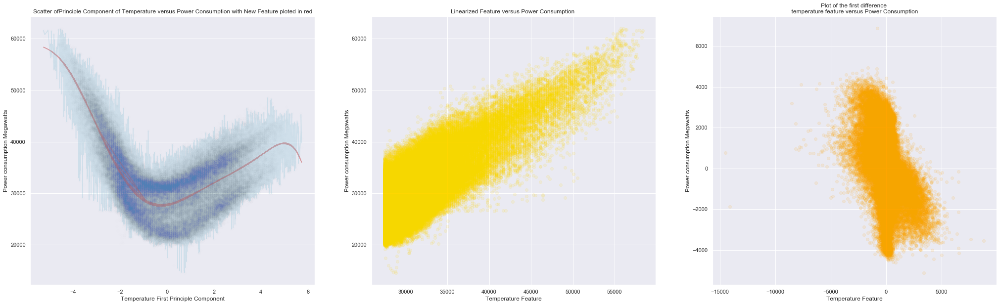

MAE = 3489.9207352790595
MSE = 16750569.000086945
RMSE = 4092.7458997703416
MAPE = 11.417299457100397


,temp_PHL,TempPC1,temp_feat,PJME
temp_PHL,1.000000,-0.994423,0.332845,0.252723
TempPC1,-0.994423,1.000000,-0.335561,-0.259631
temp_feat,0.332845,-0.335561,1.000000,0.773722
PJME,0.252723,-0.259631,0.773722,1.000000


In [712]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import mse, rmse
from sklearn.metrics import mean_absolute_error

variables = train_power[['TempPC1','PJME']].dropna()#subset=['TempPC1'])
med_power=variables[['PJME','TempPC1']].groupby(variables['TempPC1']).median()
X = variables[['TempPC1']]

y =variables['PJME']

poly = PolynomialFeatures(degree=7, include_bias=False)
X_poly = poly.fit_transform(X)
pol_reg = LinearRegression()
pol_reg.fit(X_poly,y)
dir(pol_reg)
intercept = pol_reg.intercept_
score = pol_reg.score
coef = pol_reg.coef_
y_pred = pol_reg.predict(X_poly)
print(coef,intercept)
#print(score)
#dir(pol_reg)
plt.figure(figsize=(35,10))

plt.subplot(1,3,1)

plt.scatter(variables['TempPC1'],variables['PJME'],color = 'b', alpha = 0.005)
plt.plot(variables['TempPC1'],y_pred, color = 'r',alpha = 0.5)
plt.plot(med_power['TempPC1'],med_power['PJME'],color = 'c', alpha = .2)
plt.title('Scatter ofPrinciple Component of Temperature versus Power Consumption with New Feature ploted in red')
plt.xlabel('Temperature First Principle Component')
plt.ylabel('Power consumption Megawatts')

plt.subplot(1,3,2)
plt.scatter(y_pred,variables['PJME'],color = 'gold', alpha = 0.1)
plt.title('Linearized Feature versus Power Consumption ')
plt.xlabel('Temperature Feature')
plt.ylabel('Power consumption Megawatts')
print(y_pred.shape)
print(len(np.diff(y_pred,n=1)),len(variables['PJME'].diff(-1)[1:]))

plt.subplot(1,3,3)
plt.scatter(np.diff(y_pred,n=1)[1:],variables['PJME'].diff(-1)[2:],color = 'orange', alpha = 0.1)
plt.title('Plot of the first difference \n temperature feature versus Power Consumption ')
plt.xlabel('Temperature Feature')
plt.ylabel('Power consumption Megawatts')
plt.show()

print ('MAE = {}'.format(mean_absolute_error(variables['PJME'], y_pred)))
print ('MSE = {}'.format(mse(variables['PJME'], y_pred)))
print ('RMSE = {}'.format(rmse(variables['PJME'], y_pred)))
print ('MAPE = {}'.format(np.mean(np.abs((variables['PJME'] - y_pred)/variables['PJME']))*100))
X_poly = poly.fit_transform(train_power[['TempPC1']])
train_power['temp_feat'] = pol_reg.predict(X_poly)
train_power[['temp_PHL','TempPC1','temp_feat','PJME']].corr() #.diff(1)

#predict for the test set
#test_variables = test_power[['TempPC1','PJME']].dropna()#subset=['TempPC1'])
#X_test = test_variables
#X_poly_test = poly.transform(X_test)
#test_power['temp_feat'] = pol_reg.predict(X_poly_test)

#get RSME and compare for different orders 




In [713]:
# transform the test set
X_poly = poly.transform(test_power[['TempPC1']])
test_power['temp_feat'] = pol_reg.predict(X_poly)


[ 1.34333006e+02  9.55165693e+02 -1.68021149e+02 -1.48675644e+01
  6.56404506e+00  2.46691469e-01 -1.05816504e-01] 28635.932572740174
(96461,)
96460 96460


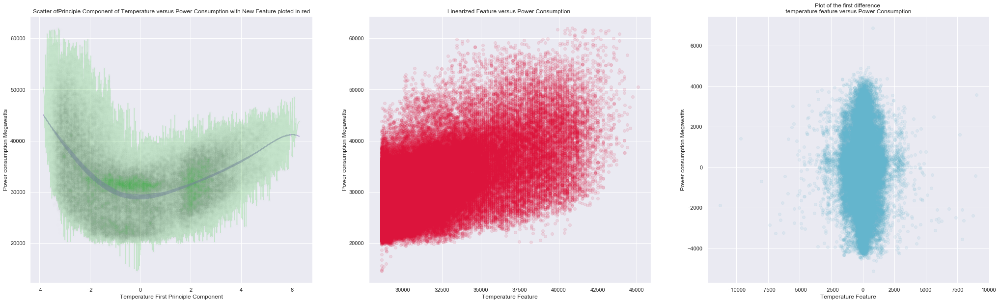

MAE = 4380.5297552656
MSE = 30201463.652579226
RMSE = 5495.585833428428
MAPE = 13.974668397906997


,dewPt_PHL,dewPtPC1,dewPt_feat,PJME,TempPC1,temp_feat
dewPt_PHL,1.000000,-0.978002,0.239308,0.110534,-0.873215,0.186483
dewPtPC1,-0.978002,1.000000,-0.238163,-0.125201,0.900604,-0.196788
dewPt_feat,0.239308,-0.238163,1.000000,0.525693,-0.244037,0.611889
PJME,0.110534,-0.125201,0.525693,1.000000,-0.259631,0.773722
TempPC1,-0.873215,0.900604,-0.244037,-0.259631,1.000000,-0.335561
temp_feat,0.186483,-0.196788,0.611889,0.773722,-0.335561,1.000000


In [714]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import mse, rmse
from sklearn.metrics import mean_absolute_error

variables = train_power[['dewPtPC1','PJME']].dropna()#subset=['TempPC1'])
med_power=variables[['PJME','dewPtPC1']].groupby(variables['dewPtPC1']).median()
X = variables[['dewPtPC1']]

y =variables['PJME']

poly = PolynomialFeatures(degree=7, include_bias=False)
X_poly = poly.fit_transform(X)
pol_reg = LinearRegression()
pol_reg.fit(X_poly,y)
dir(pol_reg)
intercept = pol_reg.intercept_
score = pol_reg.score
coef = pol_reg.coef_
y_pred = pol_reg.predict(X_poly)
print(coef,intercept)
#print(score)
#dir(pol_reg)
plt.figure(figsize=(35,10))

plt.subplot(1,3,1)

plt.scatter(variables['dewPtPC1'],variables['PJME'],color = 'g', alpha = 0.005)
plt.plot(variables['dewPtPC1'],y_pred, color = 'm',alpha = 0.5)
plt.plot(med_power['dewPtPC1'],med_power['PJME'],color = 'limegreen', alpha = .2)
plt.title('Scatter ofPrinciple Component of Temperature versus Power Consumption with New Feature ploted in red')
plt.xlabel('Temperature First Principle Component')
plt.ylabel('Power consumption Megawatts')

plt.subplot(1,3,2)
plt.scatter(y_pred,variables['PJME'],color = 'crimson', alpha = 0.1)
plt.title('Linearized Feature versus Power Consumption ')
plt.xlabel('Temperature Feature')
plt.ylabel('Power consumption Megawatts')
print(y_pred.shape)
print(len(np.diff(y_pred,n=1)),len(variables['PJME'].diff(-1)[1:]))

plt.subplot(1,3,3)
plt.scatter(np.diff(y_pred,n=1)[1:],variables['PJME'].diff(-1)[2:],color = 'c', alpha = 0.1)
plt.title('Plot of the first difference \n temperature feature versus Power Consumption ')
plt.xlabel('Temperature Feature')
plt.ylabel('Power consumption Megawatts')
plt.show()

print ('MAE = {}'.format(mean_absolute_error(variables['PJME'], y_pred)))
print ('MSE = {}'.format(mse(variables['PJME'], y_pred)))
print ('RMSE = {}'.format(rmse(variables['PJME'], y_pred)))
print ('MAPE = {}'.format(np.mean(np.abs((variables['PJME'] - y_pred)/variables['PJME']))*100))
X_poly = poly.fit_transform(train_power[['dewPtPC1']])
train_power['dewPt_feat'] = pol_reg.predict(X_poly)
train_power[['dewPt_PHL','dewPtPC1','dewPt_feat','PJME','TempPC1','temp_feat']].corr() #.diff(1)

#predict for the test set
#test_variables = test_power[['TempPC1','PJME']].dropna()#subset=['TempPC1'])
#X_test = test_variables
#X_poly_test = poly.transform(X_test)
#test_power['temp_feat'] = pol_reg.predict(X_poly_test)

#get RSME and compare for different orders 




# Parametric Modeling
## Vector Auto Regression 
Since Vector Autoregression is a Parametric Model, the time series will have to be made stationary. The variables show a high degree of seasonality that exists on daily, weekly, and yearly scales this will have to be removed. In addition to seasonality, the relationship between temperature and electrical consumption appears to be a polynomial, therefore the temperature variables will need to be transformed to account for this nonlinear relationship.


### Remove Seasonality

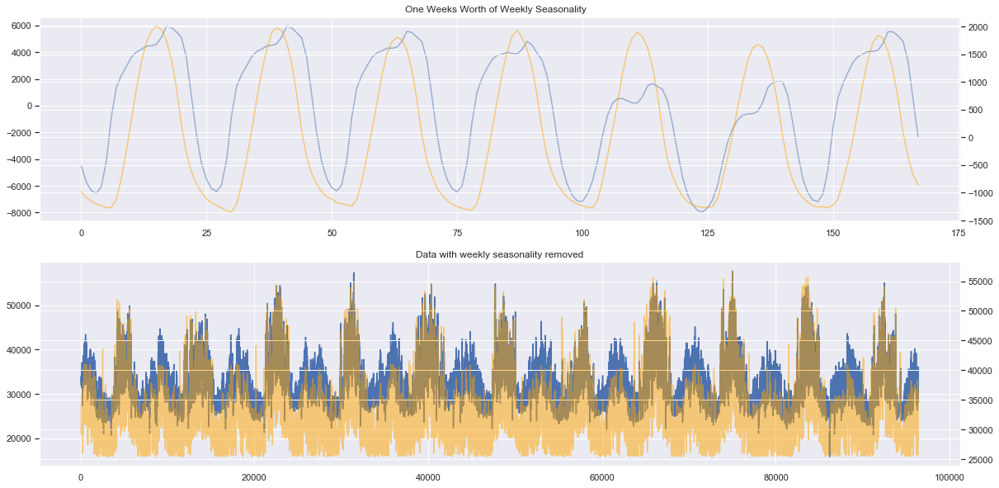

In [719]:
#create an array of the PJME values
elect1 = []
elect1 = train_power['PJME'].fillna(0).tolist()#.dropna().tolist()

#create an array of temperature values
temp1 = []
temp1 = train_power['temp_feat'].fillna(0).tolist()#.dropna().tolist()

from statsmodels.tsa.seasonal import seasonal_decompose
result_elect1 = seasonal_decompose(elect1,model = 'additive', freq = (168))

result_temp1 = seasonal_decompose(temp1,model = 'additive', freq = (168))

#result = seasonal_decompose(train,model = 'multiplicative', freq = (8766))
#resultweekly = seasonal_decompose(train,model = 'additive', freq = (168))

#plot the decomposed components
plt.figure(figsize=(20,10))
plt.subplot(2,1,1)
plt.plot(result_elect1.seasonal[0:168],color = 'b',alpha =.5)
#plt.plot(result_elect.seasonal[4200:4368],color = 'c',alpha =.5)

plt.title('One Weeks Worth of Weekly Seasonality   ')
plt.twinx()  # instantiate a second axes that shares the same x-axis
plt.plot(result_temp1.seasonal[0:168], color = 'orange',alpha =.5)

plt.subplot(2,1,2)
plt.plot(result_elect1.resid+result_elect1.trend)
plt.title('Data with weekly seasonality removed')
plt.twinx()  # instantiate a second axes that shares the same x-axis
plt.plot((result_temp1.resid+result_temp1.trend), color = 'orange',alpha =.5)
#plt.plot(result_temp2.resid, color = 'm',alpha =.5)

plt.show()

In [720]:
#add the weekly seasonality back into the dataframe 
train_power['weekly_elect_season']=result_elect1.seasonal
train_power['weekly_tempfeat_season']=result_temp1.seasonal
train_power['PJME_deseasoned_W']= train_power['PJME']-train_power['weekly_elect_season']#.dropna().tolist()
train_power['temp_feat_deseasoned_W']= train_power['temp_feat']-train_power['weekly_tempfeat_season']#.dropna().tolist()



In [721]:
#create an array of the PJME values
elect_anual = []
elect_anual = train_power['PJME_deseasoned_W'].to_list()
#create an array of temperature values
temp_anual = []
temp_anual = train_power['temp_feat_deseasoned_W'].tolist()


In [722]:
from statsmodels.tsa.seasonal import seasonal_decompose
result_elect2 = seasonal_decompose(elect_anual,model = 'additive', freq = (8766))

result_temp2 = seasonal_decompose(temp_anual,model = 'additive', freq = (8766))

#result = seasonal_decompose(train,model = 'multiplicative', freq = (8766))
#resultweekly = seasonal_decompose(train,model = 'additive', freq = (168))


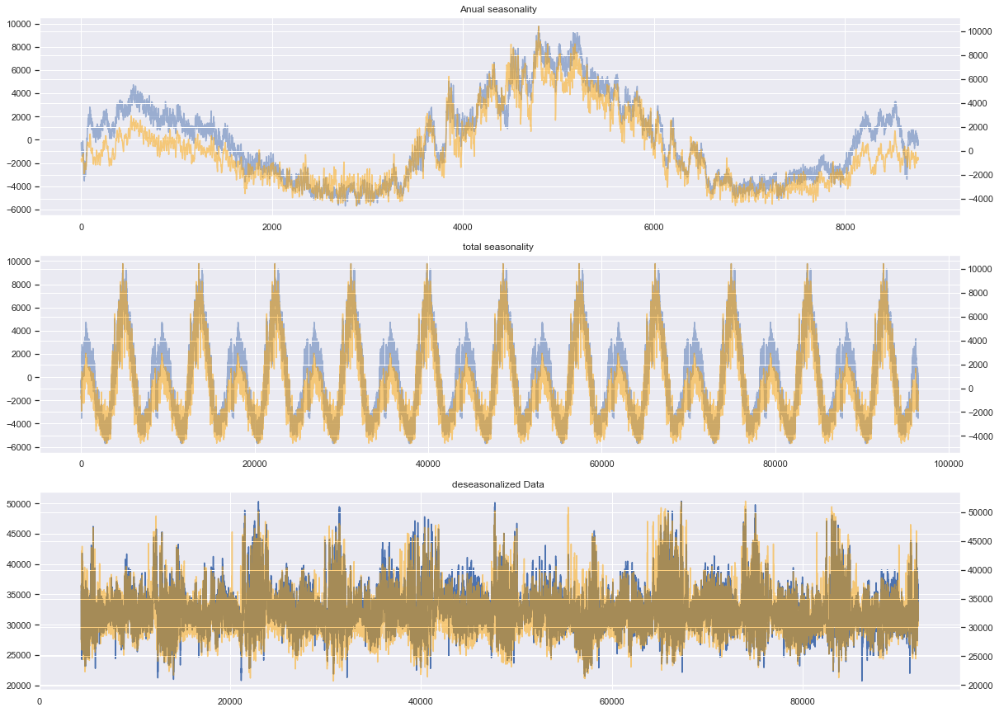

In [723]:
#plot the decomposed components
plt.figure(figsize=(20,15))
plt.subplot(3,1,1)
plt.plot(result_elect2.seasonal[0:8766],color = 'b',alpha =.5)

plt.title('Anual seasonality ')
plt.twinx()  # instantiate a second axes that shares the same x-axis
plt.plot(result_temp2.seasonal[0:8766], color = 'orange',alpha =.5)

plt.subplot(3,1,2)
plt.plot(result_elect2.seasonal,color = 'b',alpha =.5)

plt.title('total seasonality ')
plt.twinx()  # instantiate a second axes that shares the same x-axis
plt.plot(result_temp2.seasonal, color = 'orange',alpha =.5)

plt.subplot(3,1,3)
plt.plot(result_elect2.resid+result_elect2.trend)
plt.title('deseasonalized Data ')
plt.twinx()  # instantiate a second axes that shares the same x-axis
plt.plot((result_temp2.resid+result_temp2.trend), color = 'orange',alpha =.5)

plt.show()

In [724]:
#add the annual seasonality back into the dataframe 
train_power['annual_elect_season']=result_elect2.seasonal
train_power['annual_tempfeat_season']=result_temp2.seasonal
train_power['PJME_deseasoned_Y']= train_power['PJME_deseasoned_W']-train_power['weekly_elect_season']#.dropna().tolist()
train_power['temp_feat_deseasoned_Y']= train_power['temp_feat_deseasoned_W']-train_power['weekly_tempfeat_season']#.dropna().tolist()

train_power['rolled_annual_elect_season'] = train_power['annual_elect_season'].rolling(168, win_type='boxcar').mean()
train_power['rolled_annual_tempfeat_season'] = train_power['annual_tempfeat_season'].rolling(168, win_type='boxcar').mean()

train_power['rolled_annual_elect_season'] = train_power['annual_elect_season'].rolling(336, win_type='boxcar').mean()
train_power['rolled_annual_tempfeat_season'] = train_power['annual_tempfeat_season'].rolling(336, win_type='boxcar').mean()


#train_power['PJME']

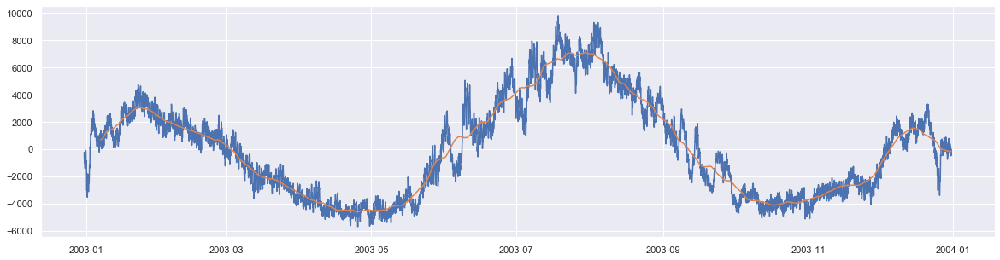

In [725]:
# smooth the seasonality 
plt.figure(figsize=(20,5))

plt.plot(train_power['annual_elect_season'][0:8766])
plt.plot(train_power['rolled_annual_elect_season'].shift(-168)[0:8766])
#plt.plot(train_power['rolled_annual_elect_season'].shift(-24)[0:8766])
#plt.plot(train_power['rolled_annual_elect_season'].shift(-168)[0:8766])
plt.show()

In [726]:
#get the start and end date for the test set
test_power
date_range = pd.date_range(start=PJM_df.PJME.first_valid_index(),end=PJM_df.PJME.last_valid_index(),freq='H',tz='US/Eastern')


In [727]:
print(test_power.first_valid_index(),
test_power.last_valid_index())
print(len(test_power))


2014-01-01 01:00:00-05:00 2018-01-01 19:00:00-05:00
35087


In [728]:
#weekly desasonalization 
test_power['weekly_elect_season'] = result_elect1.seasonal[-35088:-1]
test_power['weekly_tempfeat_season']=result_temp1.seasonal[-35088:-1]

test_power['PJME_deseasoned_W']= test_power['PJME']-test_power['weekly_elect_season']
test_power['temp_feat_deseasoned_W']= test_power['temp_feat']-test_power['weekly_tempfeat_season']

#anual deseasonalization
test_power['annual_tempfeat_season']=result_temp2.seasonal[-35088:-1]
test_power['annual_elect_season']=result_elect2.seasonal[-35088:-1]

test_power['PJME_deseasoned_Y']= test_power['PJME_deseasoned_W']-test_power['annual_tempfeat_season']
test_power['temp_feat_deseasoned_Y']= test_power['temp_feat_deseasoned_W']-test_power['annual_elect_season']

test_power.head()

,dst_flag,PJME,Datetime,temp_PHL,temp_DOV,temp_KEWR,temp_KSBY,temp_KACY,pres_PHL,pres_DOV,pres_KEWR,pres_KSBY,pres_KACY,wspd_PHL,wspd_DOV,wspd_KEWR,wspd_KSBY,wspd_KACY,gust_PHL,gust_DOV,gust_KEWR,gust_KSBY,gust_KACY,dewPt_PHL,dewPt_DOV,dewPt_KEWR,dewPt_KSBY,dewPt_KACY,precip_hrly_PHL,precip_hrly_DOV,precip_hrly_KEWR,precip_hrly_KSBY,precip_hrly_KACY,snow_PHL,snow_DOV,snow_KEWR,snow_KSBY,snow_KACY,clds_PHL,clds_DOV,clds_KEWR,clds_KSBY,clds_KACY,gas_price,day_of_week,hour_of_day,day_of_year,PJME_-1hour,PJME_-2hour,TempPC1,TempPC2,pressPC1,pressPC2,wspdPC1,wspdPC2,dewPtPC1,dewPtPC2,holiday_flags,temp_feat,weekly_elect_season,weekly_tempfeat_season,PJME_deseasoned_W,temp_feat_deseasoned_W,annual_tempfeat_season,annual_elect_season,PJME_deseasoned_Y,temp_feat_deseasoned_Y
2014-01-01 01:00:00-05:00,False,30404.0,2014-01-01 06:00:00,26.0,25.0,23.0,26.0,20.0,30.37,30.34,30.34,30.33,30.32,5.0,2.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.0,18.0,8.0,20.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BKN,CLR,CLR,CLR,CLR,4.286545,2,1,1,29905.0,29716.0,3.602266,0.125754,-3.467521,0.047836,-2.441109,0.547108,-2.441109,0.547108,True,36102.061655,-4079.958453,-1218.004787,34483.958453,37320.066442,-794.111515,-427.345352,35278.069968,37747.411794
2014-01-01 02:00:00-05:00,False,31095.0,2014-01-01 07:00:00,25.0,26.0,21.0,26.0,18.0,30.37,30.34,30.35,30.33,30.31,0.0,2.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.0,20.0,9.0,21.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,SCT,BKN,CLR,CLR,CLR,4.287794,2,2,1,30404.0,29905.0,3.711876,0.075824,-3.466571,0.021250,-2.870765,0.260523,-2.870765,0.260523,True,36436.131582,-850.262554,-1240.156134,31945.262554,37676.287716,-646.242821,-607.595269,32591.505375,38283.882985
2014-01-01 03:00:00-05:00,False,31302.0,2014-01-01 08:00:00,26.0,27.0,23.0,25.0,21.0,30.38,30.36,30.36,30.36,30.31,0.0,3.0,3.0,3.0,5.0,0.0,0.0,0.0,0.0,0.0,16.0,20.0,9.0,21.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BKN,CLR,BKN,CLR,CLR,4.289115,2,3,1,31095.0,30404.0,3.518114,0.049822,-3.604704,0.095811,-2.368560,-0.623232,-2.368560,-0.623232,True,35852.166521,1348.480070,-1119.761979,29953.519930,36971.928500,-625.814078,-1034.729561,30579.334008,38006.658061
2014-01-01 04:00:00-05:00,False,31624.0,2014-01-01 09:00:00,26.0,26.0,24.0,26.0,24.0,30.39,30.38,30.36,30.37,30.34,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,21.0,10.0,20.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BKN,CLR,BKN,CLR,CLR,4.290508,2,4,1,31302.0,31095.0,3.435322,0.016868,-3.743046,0.131787,-3.329381,-0.531512,-3.329381,-0.531512,True,35612.120522,2267.621712,-792.253618,29356.378288,36404.374140,-537.605283,-1391.803108,29893.983571,37796.177248
2014-01-01 05:00:00-05:00,False,31978.0,2014-01-01 10:00:00,27.0,28.0,23.0,26.0,23.0,30.39,30.39,30.38,30.38,30.35,6.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.0,23.0,11.0,21.0,16.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BKN,CLR,BKN,CLR,CLR,4.291972,2,5,1,31624.0,31302.0,3.406650,-0.019219,-3.840052,0.108218,-2.558143,-0.331178,-2.558143,-0.331178,True,35530.338322,2948.838382,-343.251054,29029.161618,35873.589376,-416.886233,-1288.402942,29446.047851,37161.992319


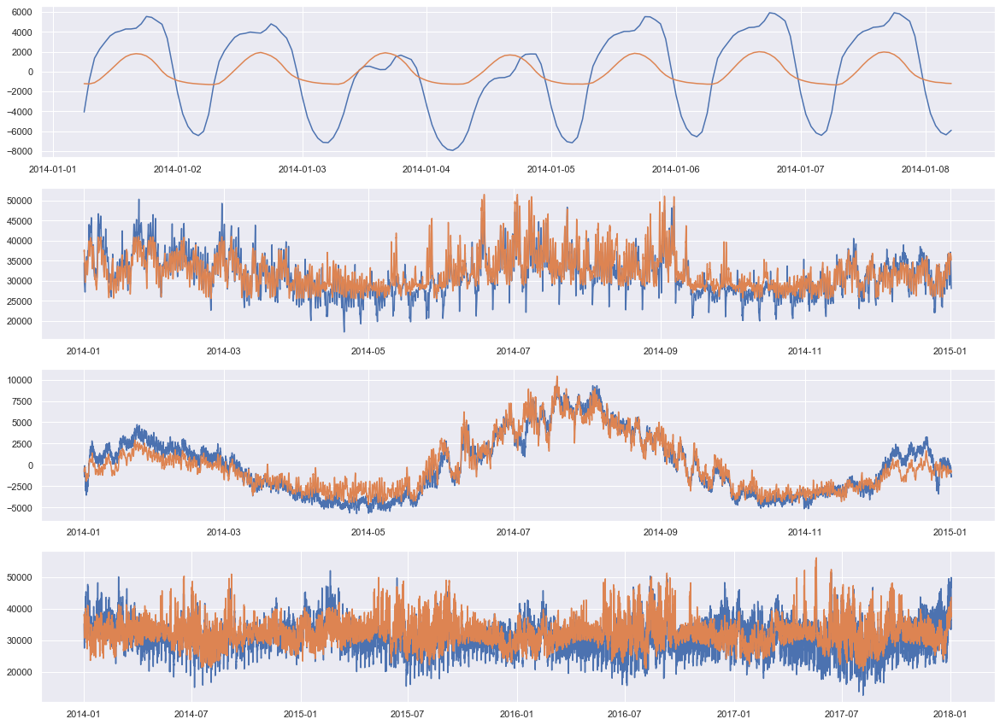

In [729]:
plt.figure(figsize=(20,15))
plt.subplot(4,1,1)
plt.plot(test_power['weekly_elect_season'][0:168] )
plt.plot(test_power['weekly_tempfeat_season'][0:168])

plt.subplot(4,1,2)
plt.plot(test_power['PJME_deseasoned_W'][0:8766])
plt.plot(test_power['temp_feat_deseasoned_W'][0:8766])

plt.subplot(4,1,3)
plt.plot(test_power['annual_elect_season'][0:8766])
plt.plot(test_power['annual_tempfeat_season'][0:8766])

plt.subplot(4,1,4)
plt.plot(test_power['PJME_deseasoned_Y'])
plt.plot(test_power['temp_feat_deseasoned_Y'])
plt.show()

In [730]:
#create variables to store the data in 
train_data = train_power[['PJME_deseasoned_Y','temp_feat_deseasoned_Y']].dropna()#.diff(0)
test_data =  test_power[['PJME_deseasoned_Y','temp_feat_deseasoned_Y']].dropna()#.diff(0)


In [731]:
type(train_data)

pandas.core.frame.DataFrame

### Augmented Dickey-Fuller Test & for Stationarity
The null hypothesis of the Augmented Dickey-Fuller is that there is a unit root, with the alternative that there is no unit root. If the p-value is above a critical size, then we cannot reject that there is a unit root. 
A unit root is a sign of non-stationarity. 


In [732]:
#Define a test for Stationarity
from statsmodels.tsa.stattools import adfuller

def Stationarity_test( variable_to_test, pvalue_threshold):
    #X = elecResiduals
    X = variable_to_test#[np.logical_not(np.isnan(variable_to_test))]
    fuller_result = adfuller(X)
    print('ADF Statistic: %f' % fuller_result[0])
    print('p-value: %f' % fuller_result[1])
    print('Critical Values:')
    if (fuller_result[1]<=pvalue_threshold):
        print("the p-value is less than {} therefore:\n We reject the null hypothesis that the time series is not stationary".format(pvalue_threshold))
    else :
        print("the p-value is greater than {} therefore:\n We fail to reject the null hypothesis that the time series is not stationary".format(pvalue_threshold))
   
    for key, value in fuller_result[4].items():
        print('\t%s: %.3f' % (key, value))
        

In [733]:
Stationarity_test(train_data['PJME_deseasoned_Y'],0.05)


ADF Statistic: -14.058557
p-value: 0.000000
Critical Values:
the p-value is less than 0.05 therefore:
 We reject the null hypothesis that the time series is not stationary
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [734]:
Stationarity_test(train_data['temp_feat_deseasoned_Y'],0.05)

ADF Statistic: -14.408056
p-value: 0.000000
Critical Values:
the p-value is less than 0.05 therefore:
 We reject the null hypothesis that the time series is not stationary
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [735]:
#use this once you add another variable to the model

# it assesses the validity of a cointegrating relationship,
#using a maximum likelihood estimates 

from statsmodels.tsa.vector_ar.vecm import coint_johansen
#from statsmodels.tsa.vector_ar.vecm import JohansenTestResult
#since the test works for only 12 variables, I have randomly dropped
#in the next iteration, I would drop another and check the eigenvalues
johan_test_temp = train_data
coint_johansen(train_data,-1,1).eig


array([0.21260477, 0.00153695])

In [435]:
## Auto Correlation functions 

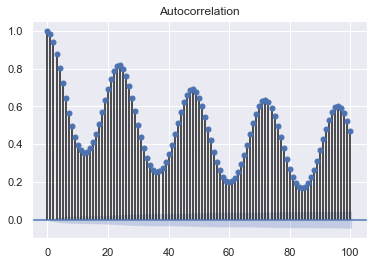

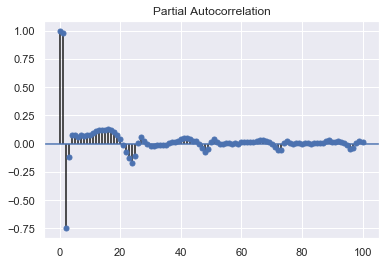

In [436]:

#sm.graphics.tsa.plot_acf(dta.values.squeeze(), lags=40)
sm.graphics.tsa.plot_acf(train_data['temp_feat_deseasoned_Y'], lags=100)
sm.graphics.tsa.plot_pacf(train_data['temp_feat_deseasoned_Y'], lags=100)

plt.show()

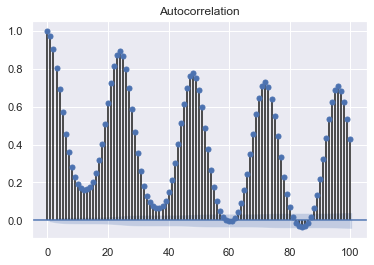

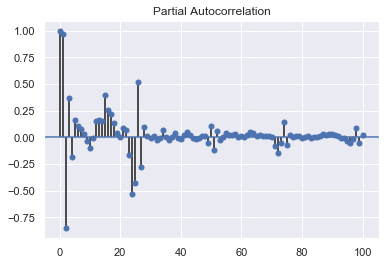

In [437]:
sm.graphics.tsa.plot_acf(train_data['PJME_deseasoned_Y'], lags=100)
sm.graphics.tsa.plot_pacf(train_data['PJME_deseasoned_Y'], lags=100)

plt.show()

Even with the seasonality removed the autocorrelation plots show a decaying correlation at 24 lags.


### Granger Causality Test

In [736]:
import statsmodels.api as sm
from statsmodels.tsa.stattools import grangercausalitytests
import numpy as np

gc_res = grangercausalitytests(train_data,[1,2,3,4,5])
#gc_res = grangercausalitytests(data,[9,10,11,12,13,14,15,16])

# Only lag 4 >>> 
#gc_res = grangercausalitytests(data, [4])


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=828.6553, p=0.0000  , df_denom=96457, df_num=1
ssr based chi2 test:   chi2=828.6811, p=0.0000  , df=1
likelihood ratio test: chi2=825.1417, p=0.0000  , df=1
parameter F test:         F=828.6553, p=0.0000  , df_denom=96457, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5002.6438, p=0.0000  , df_denom=96454, df_num=2
ssr based chi2 test:   chi2=10005.8062, p=0.0000  , df=2
likelihood ratio test: chi2=9520.1584, p=0.0000  , df=2
parameter F test:         F=5002.6438, p=0.0000  , df_denom=96454, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2562.9918, p=0.0000  , df_denom=96451, df_num=3
ssr based chi2 test:   chi2=7689.5333, p=0.0000  , df=3
likelihood ratio test: chi2=7398.4061, p=0.0000  , df=3
parameter F test:         F=2562.9918, p=0.0000  , df_denom=96451, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F

The first five lags of the Granger Causality Test have a p_value of 0.0000. The null hypothesis for Granger Causality Tests is that the time series in the second column, x2, do not cause the time series in the first column, x1. Granger Causality means that past values of x2 have a statistically significant correlation with the current value of x1, taking past values of x1 into account as regressors. We reject the null hypothesis that x2 does not  cause x1 if the values are below the desired size of the test.


# Vector Auto Regression 


In [754]:
import statsmodels.api as sm
from statsmodels.tsa.api import VAR
# make a VAR model
model = VAR(train_data)

In [755]:
#notes lowest BIC: -16.5017 lag 1

In [756]:
print(model.select_order(24))

model = VAR(train_data)
for i in range(0,10):
    result = model.fit(i)
    print('Lag Order =', i)
    print('AIC : ', result.aic)
    print('BIC : ', result.bic)
    print('FPE : ', result.fpe)
    print('HQIC: ', result.hqic, '\n')

<statsmodels.tsa.vector_ar.var_model.LagOrderResults object. Selected orders are: AIC -> 24, BIC -> 24, FPE -> 24, HQIC -> 24>
Lag Order = 0
AIC :  33.668474356345804
BIC :  33.668670848069105
FPE :  418825028830935.6
HQIC:  33.66853408352268 

Lag Order = 1
AIC :  28.064926942649127
BIC :  28.065516423285263
FPE :  1543273526143.9902
HQIC:  28.065106125924945 

Lag Order = 2
AIC :  25.965764069975524
BIC :  25.966746546813
FPE :  189142033538.65903
HQIC:  25.96606271167728 

Lag Order = 3
AIC :  25.82776560679899
BIC :  25.829141087126512
FPE :  164761631179.06564
HQIC:  25.828183709253747 

Lag Order = 4
AIC :  25.77799585685436
BIC :  25.779764347960853
FPE :  156762201956.96964
HQIC:  25.77853342238925 

Lag Order = 5
AIC :  25.746333043544425
BIC :  25.748494552719027
FPE :  151876426493.42316
HQIC:  25.74699007448665 

Lag Order = 6
AIC :  25.729061956562596
BIC :  25.73161649109466
FPE :  149275877319.57663
HQIC:  25.729838455239427 

Lag Order = 7
AIC :  25.7126264669162
BIC : 

In [757]:
# by using lag 4 we keep the residuals 
#low while maintaining significance in the pvalues for coeeficients 

results = model.fit(maxlags=4, ic='bic')

results.summary()


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Fri, 24, Jul, 2020
Time:                     01:28:53
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                    25.7798
Nobs:                     96457.0    HQIC:                   25.7785
Log likelihood:      -1.51695e+06    FPE:                1.56762e+11
AIC:                      25.7780    Det(Omega_mle):     1.56733e+11
--------------------------------------------------------------------
Results for equation PJME_deseasoned_Y
                               coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------------------
const                           501.227207        15.350962           32.651           0.000
L1.PJME_deseasoned_Y              2.114650         0.003163          668.511           0.000


In [758]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)
print(out)

#values close to two are desirable 4 is positive correlation and 0 is negative correlation

#for col, val in zip(df.columns, out):
 #   print(adjust(col), ':', round(val, 2))

[1.94540601 2.01877461]


In [759]:
# test for the normality of residuals

print(results.test_normality(signif=0.05))

<statsmodels.tsa.vector_ar.hypothesis_test_results.NormalityTestResults object. H_0: data generated by normally-distributed process: reject at 5% significance level. Test statistic: 710786.299, critical value: 9.488>, p-value: 0.000>


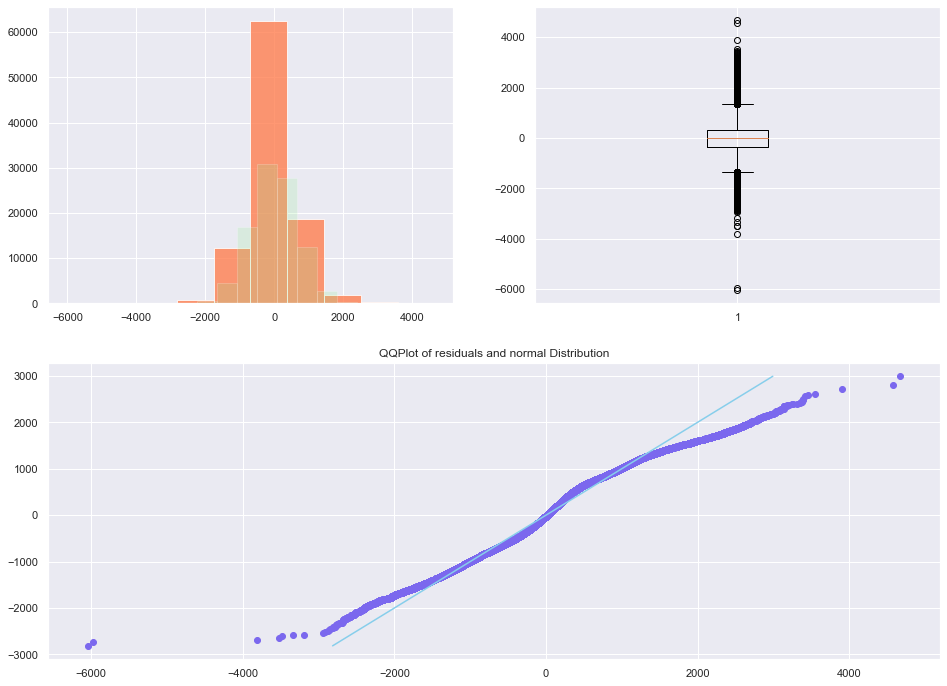

the Jarque berra stat is 16022.794646655022, and the pvalue is 0.0
NormaltestResult(statistic=4749.021181623592, pvalue=0.0)
the Minimum is -6040.063818375529
the Maximum is 4666.8599417581245
the Length is 96457
the Length is 96457
the Standard Deviation is 673.1104142114402
the Mean is -6.760650515211525e-11




In [814]:
results.resid
#normality test for the first step residuals
test_for_normality(results.resid.PJME_deseasoned_Y.values,None)


The errors fail the normality and jarque berra tests,and apear to be leptokurtic with some extreme outliers. The most extreme outliers are taking place during the peak of summer, as seen below. This it this may be due to problems with either measuring vacation days or with the polynomial transformation of the temperature feature. The nonnormality may be from an unacounted variable.

In [834]:
results.resid.loc[(results.resid.PJME_deseasoned_Y>3666)|(results.resid.PJME_deseasoned_Y<-3666)]
#results.resid.max()

,PJME_deseasoned_Y,temp_feat_deseasoned_Y
2003-06-24 13:00:00-04:00,3903.932284,908.440774
2003-06-24 14:00:00-04:00,-6040.063818,-436.379027
2003-07-20 08:00:00-04:00,-5970.746885,986.580371
2003-07-20 09:00:00-04:00,4666.859942,-734.853352
2006-08-02 04:00:00-04:00,4583.715781,10965.149992
2011-06-24 12:00:00-04:00,-3808.412892,1020.471907


In [836]:
irf = results.irf(10)

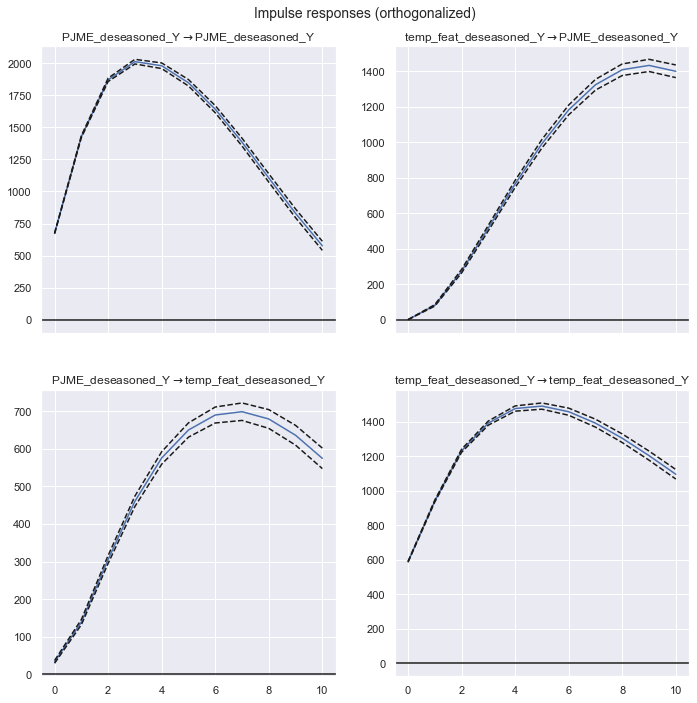

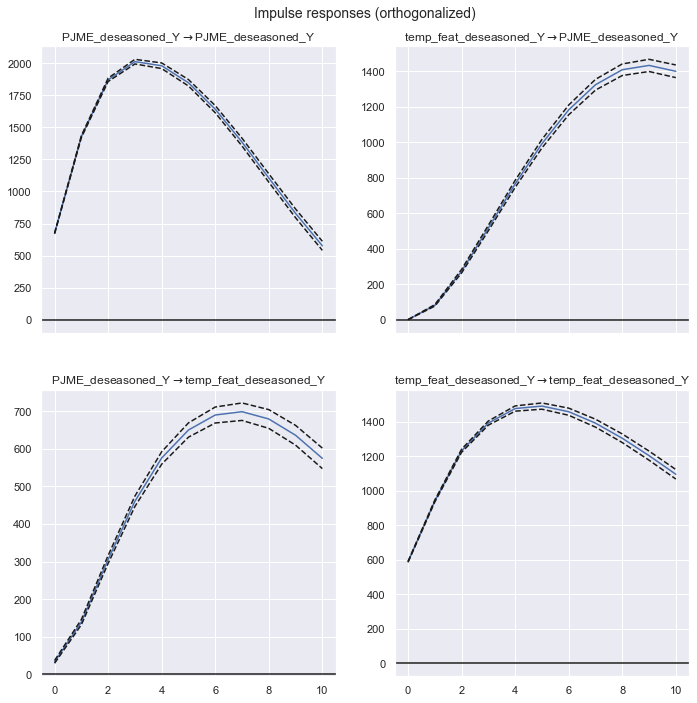

In [793]:
irf.plot(orth=True)

it apears that the trend stays with in one standard deviation 

### Test VAR Model

In [760]:
#add the last values of the training data to use as lag values for the test data
# Get the lag order
lag_order = results.k_ar
print('the lag order is',lag_order)  #> 4

# Input data for prediction 
predict_input = pd.concat([train_data[-lag_order:],test_data[:len(test_data)]])
print(predict_input.values)

the lag order is 4
[[41686.69525506 37211.82378477]
 [42332.74547113 37508.97232706]
 [42568.68319447 37899.06497112]
 ...
 [49780.80074404 42894.51348229]
 [48166.64310633 43600.52112817]
 [46758.37530585 43715.69686187]]


In [761]:
# Forecast
t = len(predict_input)

step1_PJME_deseasoned_Y = []
step2_PJME_deseasoned_Y = []
step3_PJME_deseasoned_Y = []
step4_PJME_deseasoned_Y = []

for i in range(4,t):
    fc = results.forecast(y=predict_input.values[i-4:i], steps=4)
    #we are only interested in testing the power consumumption
    step1_PJME_deseasoned_Y.append(fc[0,0])
    step2_PJME_deseasoned_Y.append(fc[1,0])
    step3_PJME_deseasoned_Y.append(fc[2,0])
    step4_PJME_deseasoned_Y.append(fc[3,0])
    
    
test_power['VAR_Pred_+1_deseasoned']= step1_PJME_deseasoned_Y
test_power['VAR_Pred_+2_deseasoned']= step2_PJME_deseasoned_Y
test_power['VAR_Pred_+3_deseasoned']= step3_PJME_deseasoned_Y
test_power['VAR_Pred_+4_deseasoned']= step4_PJME_deseasoned_Y
    
    
    
    #df_forecast = pd.DataFrame(fc, index=predict_input.index[-35091:], columns=test_data.columns + '_2d')
#df_forecast


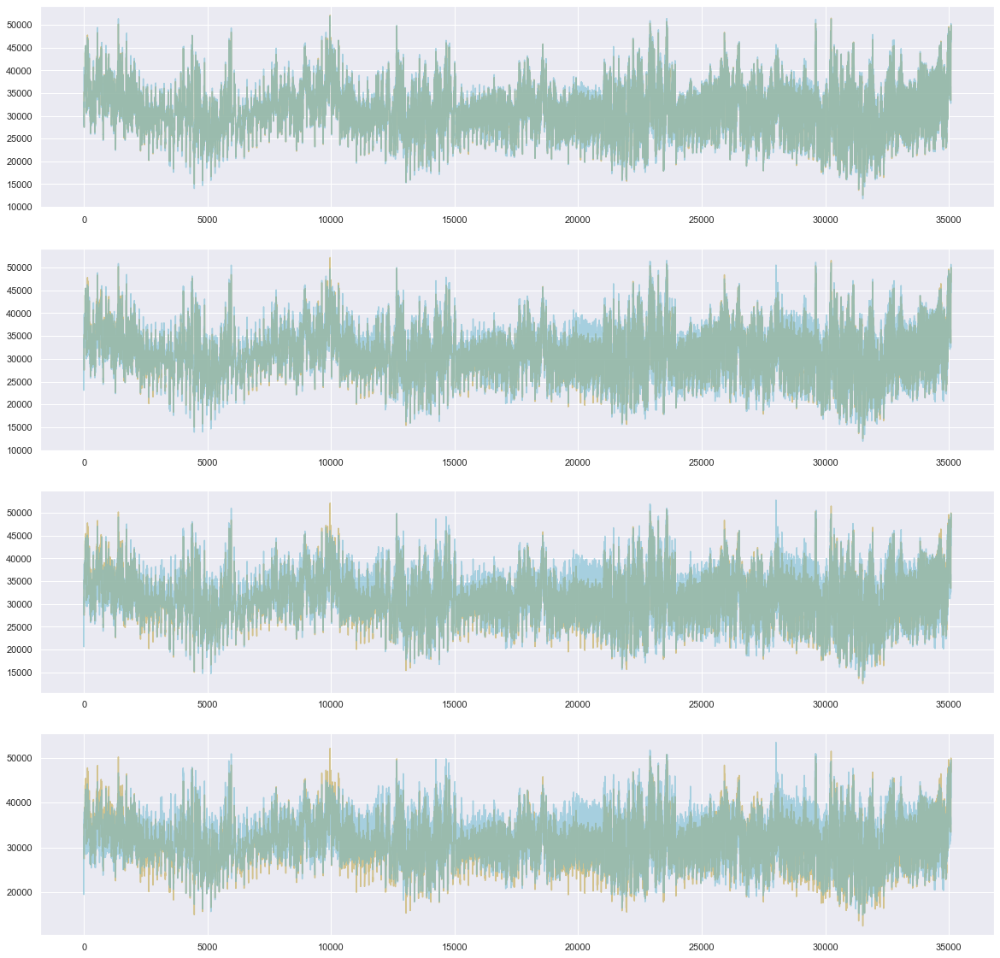

In [762]:
plt.figure(figsize=(20,20))
plt.subplot(4,1,1)
plt.plot(test_data['PJME_deseasoned_Y'].values, color='y',alpha=0.8)
plt.plot(step1_PJME_deseasoned_Y, color='c',alpha=0.5)
plt.subplot(4,1,2)
plt.plot(test_data['PJME_deseasoned_Y'].values, color='y',alpha=0.8)
plt.plot(step2_PJME_deseasoned_Y, color='c',alpha=0.5)
plt.subplot(4,1,3)
plt.plot(test_data['PJME_deseasoned_Y'].values, color='y',alpha=0.8)
plt.plot(step3_PJME_deseasoned_Y, color='c',alpha=0.5)
plt.subplot(4,1,4)
plt.plot(test_data['PJME_deseasoned_Y'].values, color='y',alpha=0.8)
plt.plot(step4_PJME_deseasoned_Y, color='c',alpha=0.5)
plt.show()

In [763]:
# Reseason the results of the Var prediction
test_power['VAR_Pred_+1_seasoned']=test_power['VAR_Pred_+1_deseasoned']+test_power['weekly_elect_season']+test_power['annual_elect_season']
test_power['VAR_Pred_+2_seasoned']=test_power['VAR_Pred_+2_deseasoned']+test_power['weekly_elect_season']+test_power['annual_elect_season']
test_power['VAR_Pred_+3_seasoned']=test_power['VAR_Pred_+3_deseasoned']+test_power['weekly_elect_season']+test_power['annual_elect_season']
test_power['VAR_Pred_+4_seasoned']=test_power['VAR_Pred_+4_deseasoned']+test_power['weekly_elect_season']+test_power['annual_elect_season']



In [764]:
from sklearn.metrics import r2_score
from statsmodels.tools.eval_measures import mse, rmse


y_preds_list = ['VAR_Pred_+1_seasoned',
'VAR_Pred_+2_seasoned',
'VAR_Pred_+3_seasoned',
'VAR_Pred_+4_seasoned']

for prediction in y_preds_list:
    y_pred = test_power[prediction]
    y_test = test_power['PJME']
    print('Results from ',prediction)
    print('R^2 score ={}'.format(r2_score(y_test, y_pred)))
    print('MSE = ',mse(y_test, y_pred))
    print('RMSE = ',rmse(y_test, y_pred))
    print("Mean absolute percentage error of the prediction is: {}%".format(np.mean(np.abs((y_test - y_pred) / y_test)) * 100))
    print('\n')

Results from  VAR_Pred_+1_seasoned
R^2 score =0.965021019652926
MSE =  1427321.6728926946
RMSE =  1194.7056846322841
Mean absolute percentage error of the prediction is: 3.1108592081246345%


Results from  VAR_Pred_+2_seasoned
R^2 score =0.949811158027586
MSE =  2047961.98099026
RMSE =  1431.0702222428708
Mean absolute percentage error of the prediction is: 3.5899658828888183%


Results from  VAR_Pred_+3_seasoned
R^2 score =0.9022029170015968
MSE =  3990622.2172363307
RMSE =  1997.6541785895602
Mean absolute percentage error of the prediction is: 4.890049064461248%


Results from  VAR_Pred_+4_seasoned
R^2 score =0.8271290079744474
MSE =  7054022.475334143
RMSE =  2655.9409773814896
Mean absolute percentage error of the prediction is: 6.45723512834915%




In [839]:
#define a test for normality 

#test for normality 
def test_for_normality(y_test,y_pred):
    from scipy.stats import boxcox
    from scipy.stats import jarque_bera
    from scipy.stats import normaltest
    colo = np.random.randint(3, size=1)
    colors=[['r','gold','c','m'],
            ['g','orange','b','hotpink'],
            ['skyblue','coral','lightgreen','mediumslateblue'],
           ['g','limegreen','orange','yellow']]
    
    try:
        data_series = y_pred-y_test
    except:
        data_series=y_test
    # input the mean, standard deviation and lenght of the residuals
    normal = np.random.normal(np.mean(data_series), np.std(data_series), len(data_series))

    plt.figure(figsize=(16, 12))

    plt.subplot(2, 2, 1)
    plt.hist(data_series,color = colors[colo[0]][1],alpha = 0.8)#bins=40,
    plt.hist(normal,color = colors[colo[0]][2], alpha = 0.2)

    #Generate a Box Plot of solar system counts
    plt.subplot(2, 2, 2)
    plt.boxplot(data_series)

    #Generate a QQ plot of the gamma distribution and the solar system counts 
    plt.subplot(2, 1, 2)
    orderd_normal = sorted(normal)
    ordered_data=sorted(data_series)
    plt.scatter(ordered_data,orderd_normal, color = colors[colo[0]][3])
    plt.plot(orderd_normal,orderd_normal,color= colors[colo[0]][0])
    plt.title('QQPlot of residuals and normal Distribution')
    plt.xlabel('residuals')
    plt.ylabel('normaly distributed')
    plt.show()

    jb_stats = jarque_bera(data_series)
    norm_stats = normaltest(data_series)
    print('the Jarque berra stat is {}, and the pvalue is {}'.format(jb_stats[0],jb_stats[1]))
    print(norm_stats)
    

    #elecResiduals = np.sort(result2_elect.resid[np.logical_not(np.isnan(result2_elect.resid))])
    sorted_data_series = np.sort(data_series[np.logical_not(np.isnan(data_series))])

    
    data_series_min = sorted_data_series.min()
    data_series_max = sorted_data_series.max()
    data_series_len = len(sorted_data_series)
    data_series_std = np.std(sorted_data_series)
    data_series_avg = np.mean(sorted_data_series)

    print('the Minimum is {}'.format(data_series_min))
    print('the Maximum is {}'.format(data_series_max))
    print('the Length is {}'.format(data_series_len))
    print('the Length is {}'.format(data_series_len))
    print('the Standard Deviation is {}'.format(data_series_std))
    print('the Mean is {}'.format(data_series_avg))
    print('\n')




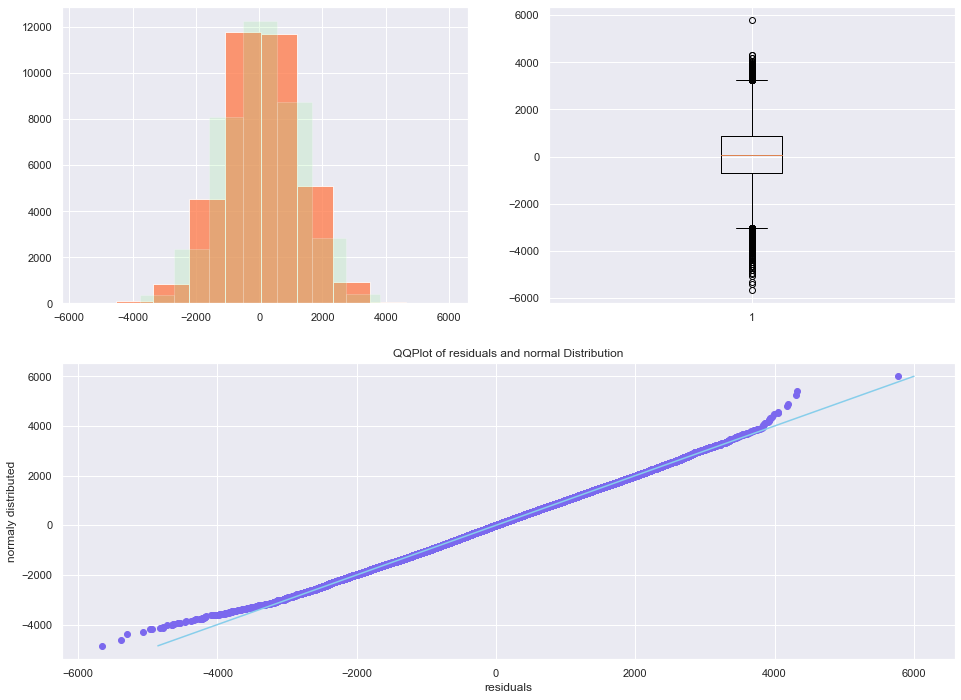

the Jarque berra stat is 84.74227607437783, and the pvalue is 0.0
NormaltestResult(statistic=75.79709098820773, pvalue=3.474328027008359e-17)
the Minimum is -5653.1789169892945
the Maximum is 5773.702669796083
the Length is 35087
the Length is 35087
the Standard Deviation is 1191.5962141374443
the Mean is 86.14020748758696




In [840]:
#normality test for the first step residuals
test_for_normality(test_power['PJME'] ,test_power['VAR_Pred_+1_seasoned'])


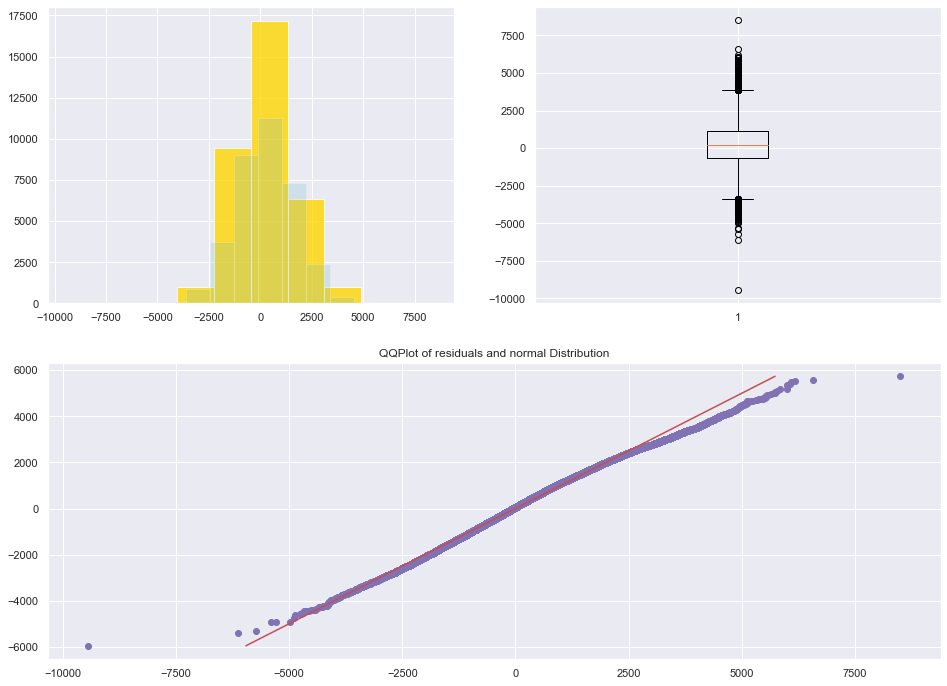

the Jarque berra stat is 624.8945720727312, and the pvalue is 0.0
NormaltestResult(statistic=496.06156721752234, pvalue=1.9124907203376895e-108)
the Minimum is -9439.028308018067
the Maximum is 8497.065687279886
the Length is 35087
the Length is 35087
the Standard Deviation is 1406.2003065625593
the Mean is 265.63636575895197




In [767]:
#normality test for the second step residuals

test_for_normality(test_power['PJME'] ,test_power['VAR_Pred_+2_seasoned'])

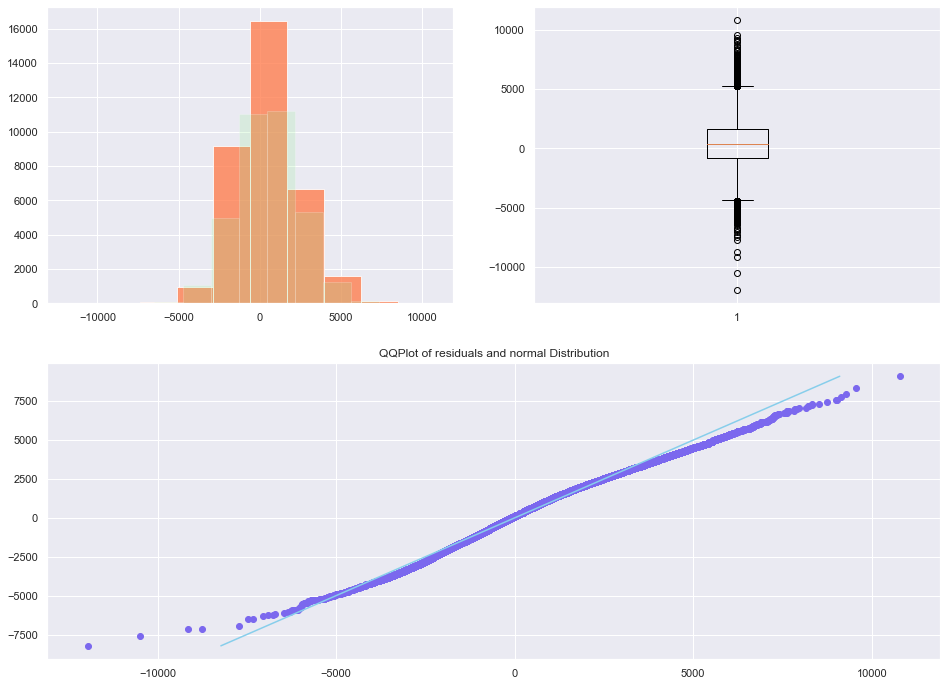

the Jarque berra stat is 1244.8604827354823, and the pvalue is 0.0
NormaltestResult(statistic=977.933655751122, pvalue=4.409657103691329e-213)
the Minimum is -11947.004644720804
the Maximum is 10783.399524044835
the Length is 35087
the Length is 35087
the Standard Deviation is 1936.2096380356431
the Mean is 491.64464282061994




In [768]:
#normality test for the third step residuals

test_for_normality(test_power['PJME'] ,test_power['VAR_Pred_+3_seasoned'])

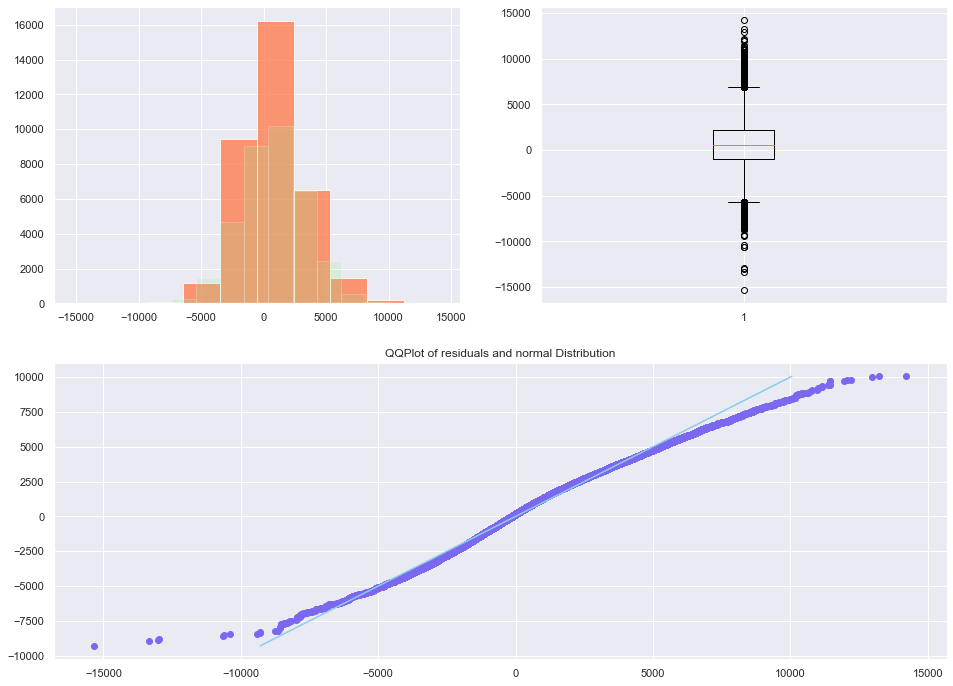

the Jarque berra stat is 1423.0548232459516, and the pvalue is 0.0
NormaltestResult(statistic=1006.3952049899196, pvalue=2.91110539749451e-219)
the Minimum is -15329.665963983578
the Maximum is 14201.709173561278
the Length is 35087
the Length is 35087
the Standard Deviation is 2555.725851284993
the Mean is 722.6948515160058




In [769]:
#normality test for the fourth step residuals
test_for_normality(test_power['PJME'] ,test_power['VAR_Pred_+4_seasoned'])

In [ ]:
test

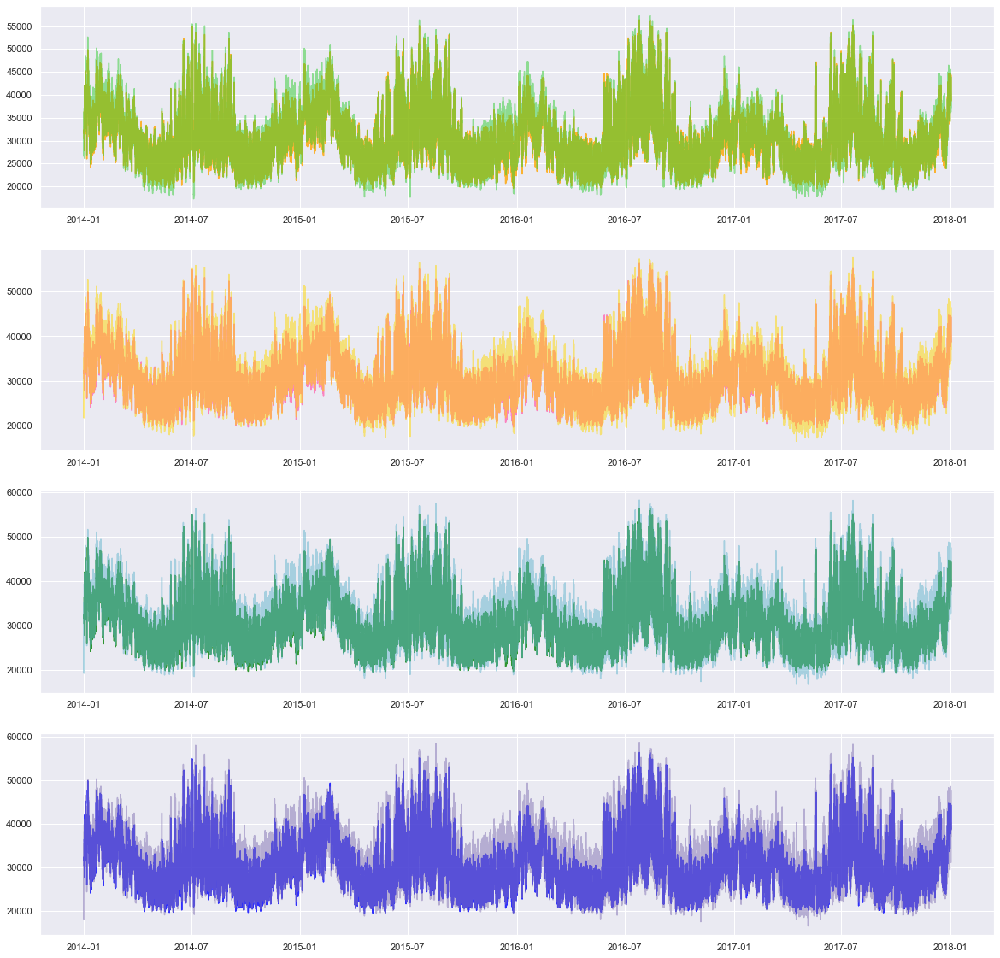

In [775]:

plt.figure(figsize=(20,20))
plt.subplot(4,1,1)
plt.plot(test_power['PJME'], color='orange',alpha=0.8)
plt.plot(test_power['VAR_Pred_+1_seasoned'], color='limegreen',alpha=0.5)
plt.subplot(4,1,2)
plt.plot(test_power['PJME'], color='hotpink',alpha=0.8)
plt.plot(test_power['VAR_Pred_+2_seasoned'], color='gold',alpha=0.5)
plt.subplot(4,1,3)
plt.plot(test_power['PJME'], color='green',alpha=0.8)
plt.plot(test_power['VAR_Pred_+3_seasoned'], color='c',alpha=0.5)
plt.subplot(4,1,4)
plt.plot(test_power['PJME'], color='blue',alpha=0.8)
plt.plot(test_power['VAR_Pred_+4_seasoned'], color='m',alpha=0.5)
plt.show()

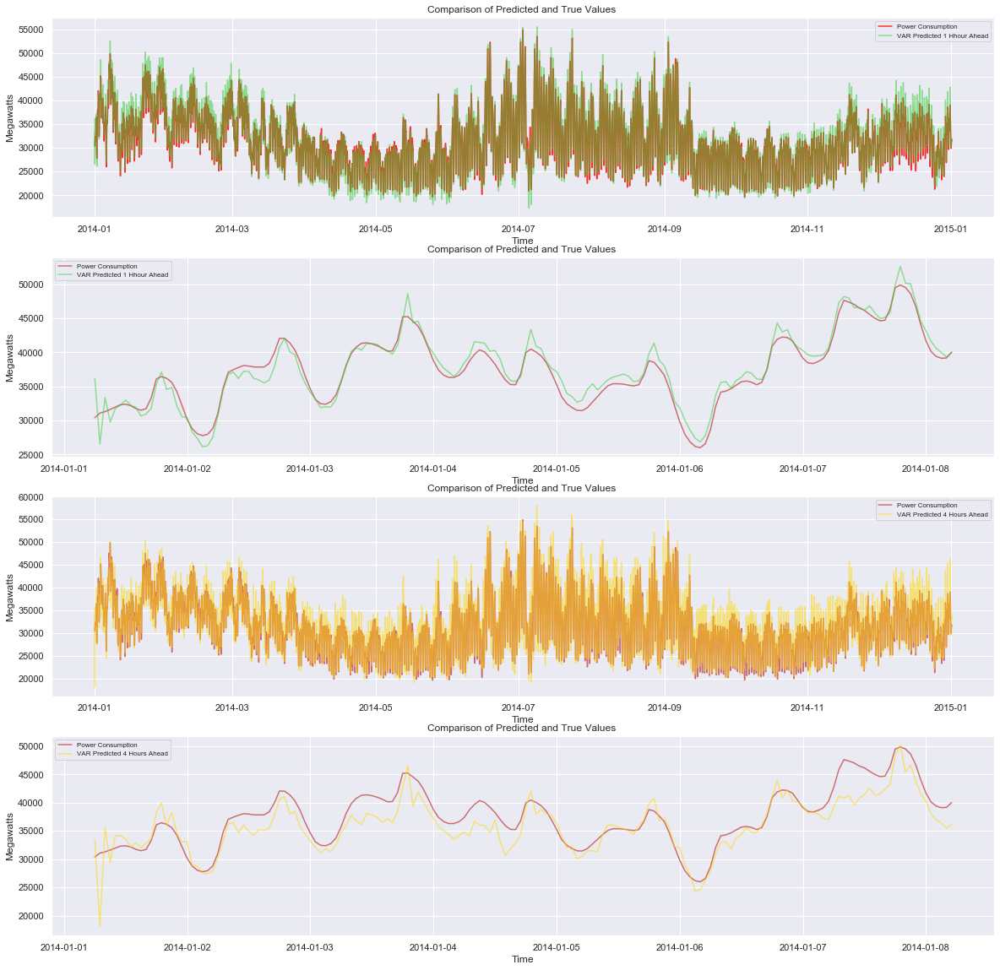

In [788]:
plt.figure(figsize=(20,20))

labels = ['Power Consumption ','VAR Predicted 1 Hhour Ahead','VAR Predicted 4 Hours Ahead']
plt.subplot(4,1,1)
plt.plot(test_power['PJME'][0:8766], color='red',alpha=0.8,label=labels[0])
plt.plot(test_power['VAR_Pred_+1_seasoned'][0:8766], color='limegreen',alpha=0.5,label=labels[1])
plt.title("Comparison of Predicted and True Values ")
plt.ylabel('Megawatts')
plt.xlabel('Time')
plt.legend(fontsize=8)

plt.subplot(4,1,2)
plt.plot(test_power['PJME'][0:168], color='r',alpha=0.8,label=labels[0])
plt.plot(test_power['VAR_Pred_+1_seasoned'][0:168], color='limegreen',alpha=0.5,label=labels[1])
plt.title("Comparison of Predicted and True Values ")
plt.ylabel('Megawatts')
plt.xlabel('Time')
plt.legend(fontsize=8)

plt.subplot(4,1,3)
plt.plot(test_power['PJME'][0:8766], color='r',alpha=0.8,label=labels[0])
plt.plot(test_power['VAR_Pred_+4_seasoned'][0:8766], color='gold',alpha=0.5,label=labels[2])
plt.title("Comparison of Predicted and True Values ")
plt.ylabel('Megawatts')
plt.xlabel('Time')
plt.legend(fontsize=8)

plt.subplot(4,1,4)
plt.plot(test_power['PJME'][0:168], color='r',alpha=0.8,label=labels[0])
plt.plot(test_power['VAR_Pred_+4_seasoned'][0:168], color='gold',alpha=0.5,label=labels[2])
plt.title("Comparison of Predicted and True Values ")
plt.ylabel('Megawatts')
plt.xlabel('Time')
plt.legend(fontsize=8)
plt.show()

#  Non-Parametric Modeling
In this section non-parametric models for cross-sectional data are adapted for time series by adding variables with calendar information such as day of the year, day of the week, the hour of the day, daylight savings time, and holidays. The models are also tested using lag variables.   


In [453]:
# set the variables
#'PJME_-1hour','PJME_-2hour',

train_power[['holiday_flags', 'dst_flag']] =train_power[['holiday_flags', 'dst_flag']].astype(int) 
test_power[['holiday_flags', 'dst_flag']] =test_power[['holiday_flags', 'dst_flag']].astype(int) 

y_train = train_power['PJME'].values
X_train = train_power[['dst_flag','precip_hrly_PHL',
                       'precip_hrly_DOV','precip_hrly_KEWR', 
                       'precip_hrly_KSBY','precip_hrly_KACY', 
                       'snow_PHL','snow_DOV', 
                       'snow_KEWR','snow_KSBY', 
                       'snow_KACY','gas_price', 
                       'day_of_week', 'hour_of_day',
                       'day_of_year', 'TempPC1',
                       #'PJME_-1hour','PJME_-2hour', #lag variables comment out for forcasting beyond 1hr
                       'TempPC2', 'pressPC1',
                       'pressPC2', 'wspdPC1',
                       'wspdPC2', 'dewPtPC1',
                       'dewPtPC2', 'holiday_flags']].values#.astype(float)
y_test = test_power['PJME'].values
X_test = test_power[['dst_flag','precip_hrly_PHL',
                    'precip_hrly_DOV','precip_hrly_KEWR',
                    'precip_hrly_KSBY','precip_hrly_KACY',
                    'snow_PHL','snow_DOV', 
                    'snow_KEWR', 'snow_KSBY', 
                    'snow_KACY', 'gas_price', 
                    'day_of_week', 'hour_of_day',
                    'day_of_year',  'TempPC1', 
                     #'PJME_-1hour','PJME_-2hour', #lag variables comment out for forcasting beyond 1hr
                    'TempPC2', 'pressPC1',
                    'pressPC2', 'wspdPC1',
                    'wspdPC2', 'dewPtPC1',
                    'dewPtPC2', 'holiday_flags']].values#.astype(float)
y_test = test_power['PJME'].values#.astype(float)

#'PJME_-1hour','PJME_-2hour',

### Random Forrest Regression

In [454]:
import sklearn.ensemble
from sklearn.ensemble import RandomForestRegressor
forrest = RandomForestRegressor(n_estimators = 2000, n_jobs=-1)
forrest.fit(X_train, y_train)
##n_jobs=-1

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=2000, n_jobs=-1, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [455]:
from sklearn.metrics import r2_score
from statsmodels.tools.eval_measures import mse, rmse
y_forest_pred = forrest.predict(X_test)
test_power['pjme_forest_pred']=y_forest_pred
print('R^2 score ={}'.format(r2_score(y_test, y_forest_pred)))
print('MSE = ',mse(y_test, y_forest_pred))
print('RMSE = ',rmse(y_test, y_forest_pred))
print("Mean absolute percentage error of the prediction is: {}%".format(np.mean(np.abs((y_test - y_forest_pred) / y_test)) * 100))


R^2 score =0.9158077019384088
MSE =  3435477.2643909515
RMSE =  1853.5040502763816
Mean absolute percentage error of the prediction is: 4.444821316659656%


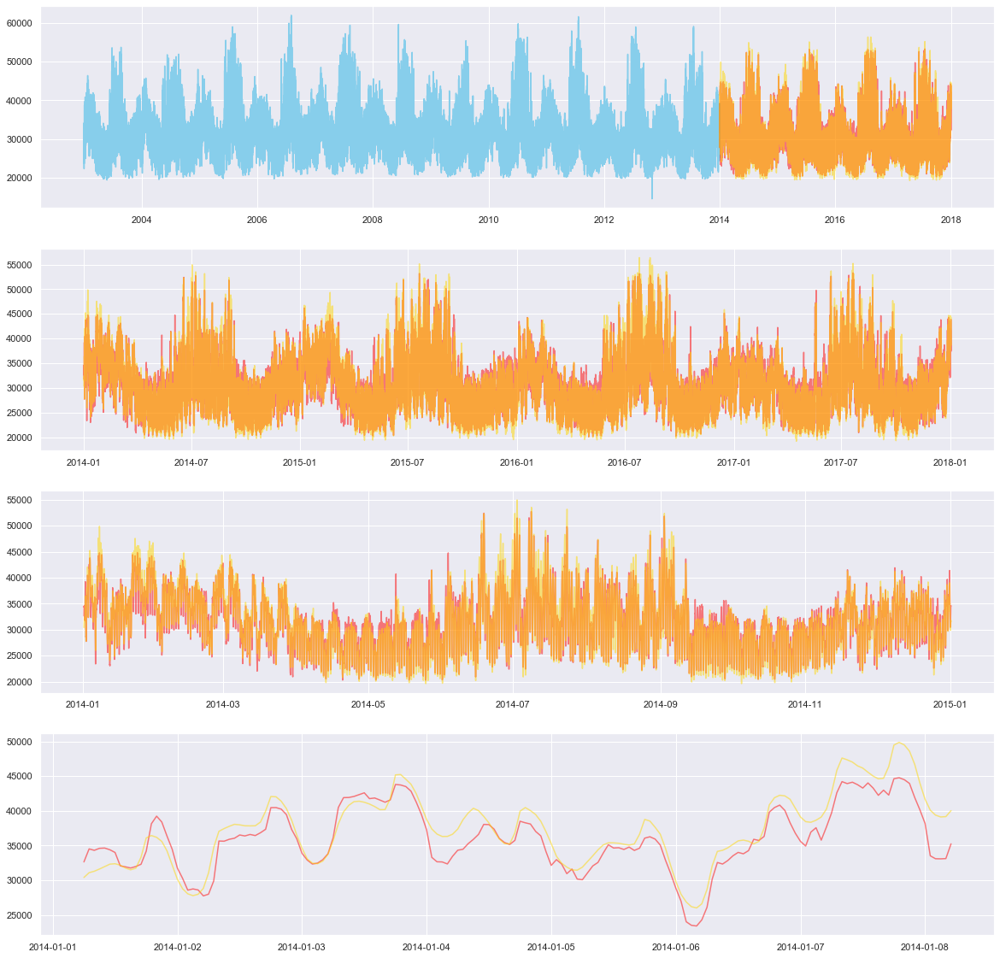

In [456]:
plt.figure(figsize=(20,20))
plt.subplot(4,1,1)
plt.plot(train_power['PJME'],color = 'skyblue', alpha = 1)
plt.plot(test_power['pjme_forest_pred'], color = 'red', alpha = .5)
plt.plot(test_power['PJME'], color = 'gold', alpha = .5)
plt.grid(True)

plt.subplot(4,1,2)
plt.plot(test_power['pjme_forest_pred'], color = 'red', alpha = .5)
plt.plot(test_power['PJME'], color = 'gold', alpha = .5)
plt.grid(True)

plt.subplot(4,1,3)
plt.plot(test_power['pjme_forest_pred'][0:8766], color = 'red', alpha = .5)
plt.plot(test_power['PJME'][0:8766], color = 'gold', alpha = .5)
plt.grid(True)

plt.subplot(4,1,4)
plt.plot(test_power['pjme_forest_pred'][0:168], color = 'red', alpha = .5)
plt.plot(test_power['PJME'][0:168], color = 'gold', alpha = .5)
plt.grid(True)
plt.show()

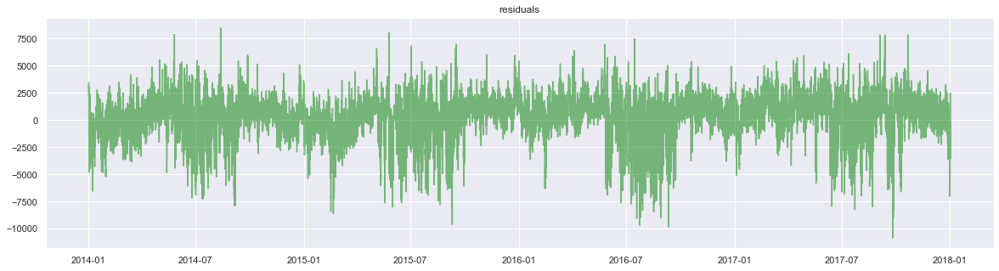

In [457]:
plt.figure(figsize=(20,5))
plt.plot((test_power['pjme_forest_pred']-test_power['PJME']), color = 'green', alpha = .5)
plt.title('residuals')
plt.grid(True)
plt.show()

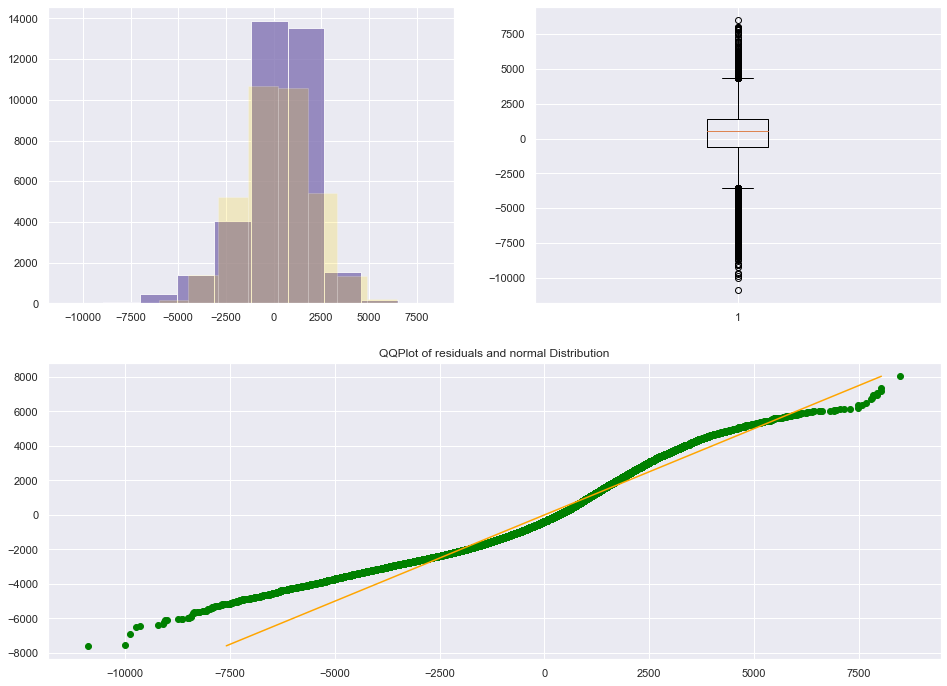

the Jarque berra stat is 12892.25340913822, and the pvalue is 0.0
NormaltestResult(statistic=5752.110549066617, pvalue=0.0)
the Minimum is -10875.233999999997
the Maximum is 8473.6135
the Length is 35087
the Length is 35087
the Standard Deviation is 1839.178857584753
the Mean is 229.9965091130619




In [564]:
test_for_normality(y_test ,y_forest_pred,[])

### Gradient Boosting Regression

In [460]:
est = GradientBoostingRegressor(n_estimators=800,
                                learning_rate=0.06,
                                max_depth=6,
                                random_state=0,
                                loss='ls',tol=1e-4
                               ).fit(X_train, y_train)

# early 
#try rmse for loss
# n_iter_no_change=5
#loss='ls',
#n_jobs=-1
#n_iter_no_change=5
#tol=1e-4
#n_iter_no_change=500


In [461]:
from statsmodels.tools.eval_measures import mse, rmse
y_boost_preds = est.predict(X_test)
test_power['y_boost_preds']=y_boost_preds
print('R^2 score ={}'.format(r2_score(y_test, y_boost_preds)))
print('mse= ',mse(y_test, y_boost_preds))
print('rmse= ',rmse(y_test, y_boost_preds))
print("Mean absolute percentage error of the prediction is: {}%".format(np.mean(np.abs((y_test - y_boost_preds) / y_test)) * 100))


R^2 score =0.9196369383780467
mse=  3279224.792000546
rmse=  1810.8629964744837
Mean absolute percentage error of the prediction is: 4.3027984311144305%


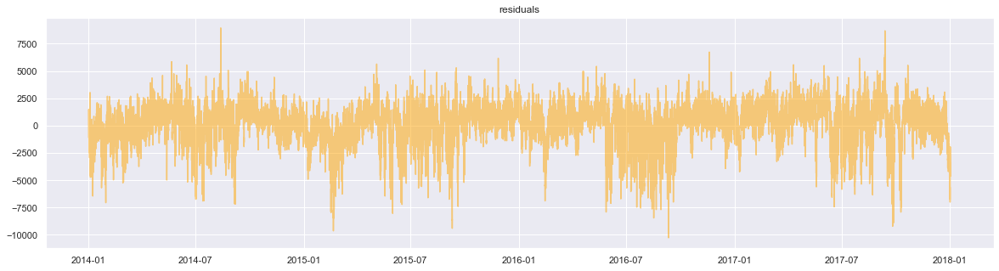

In [462]:
plt.figure(figsize=(20,5))
plt.plot((test_power['y_boost_preds']-test_power['PJME']), color = 'orange', alpha = .5)
plt.title('residuals')
plt.grid(True)
plt.show()

In [588]:
test_power['boost_resids']=test_power['y_boost_preds']-test_power['PJME']
test_power[test_power.boost_resids == test_power.boost_resids.max()]

,dst_flag,PJME,Datetime,temp_PHL,temp_DOV,temp_KEWR,temp_KSBY,temp_KACY,pres_PHL,pres_DOV,pres_KEWR,pres_KSBY,pres_KACY,wspd_PHL,wspd_DOV,wspd_KEWR,wspd_KSBY,wspd_KACY,gust_PHL,gust_DOV,gust_KEWR,gust_KSBY,gust_KACY,dewPt_PHL,dewPt_DOV,dewPt_KEWR,dewPt_KSBY,dewPt_KACY,precip_hrly_PHL,precip_hrly_DOV,precip_hrly_KEWR,precip_hrly_KSBY,precip_hrly_KACY,snow_PHL,snow_DOV,snow_KEWR,snow_KSBY,snow_KACY,clds_PHL,clds_DOV,clds_KEWR,clds_KSBY,clds_KACY,gas_price,day_of_week,hour_of_day,day_of_year,PJME_-1hour,PJME_-2hour,TempPC1,TempPC2,pressPC1,pressPC2,wspdPC1,wspdPC2,dewPtPC1,dewPtPC2,holiday_flags,temp_feat,weekly_elect_season,weekly_tempfeat_season,PJME_deseasoned_W,temp_feat_deseasoned_W,annual_tempfeat_season,annual_elect_season,PJME_deseasoned_Y,temp_feat_deseasoned_Y,VAR_Pred_+1_deseasoned,VAR_Pred_+2_deseasoned,VAR_Pred_+3_deseasoned,VAR_Pred_+4_deseasoned,VAR_Pred_+1_seasoned,VAR_Pred_+2_seasoned,VAR_Pred_+3_seasoned,VAR_Pred_+4_seasoned,pjme_forest_pred,y_boost_preds,boost_resids
2014-08-13 01:00:00-04:00,1,25787.0,2014-08-13 05:00:00,80.0,79.0,79.0,82.0,80.0,29.81,29.78,29.79,29.77,29.75,12.0,11.0,14.0,14.0,12.0,0.0,5.0,9.0,5.0,8.0,66.0,71.0,67.0,69.0,69.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,3.890734,2,1,225,25552.0,26020.0,-2.600256,-0.05557,2.014686,-0.091615,1.630301,-0.175569,1.630301,-0.175569,0,39244.112307,-5918.802782,-1198.115094,31705.802782,40442.2274,5500.362859,5749.824484,26205.439923,34692.402916,27205.335252,28098.930162,29281.36094,30501.883472,27036.356954,27929.951864,29112.382642,30332.905174,34260.6135,34734.472615,8947.472615


In [590]:
'2014-08-13'in(outages_start)

False

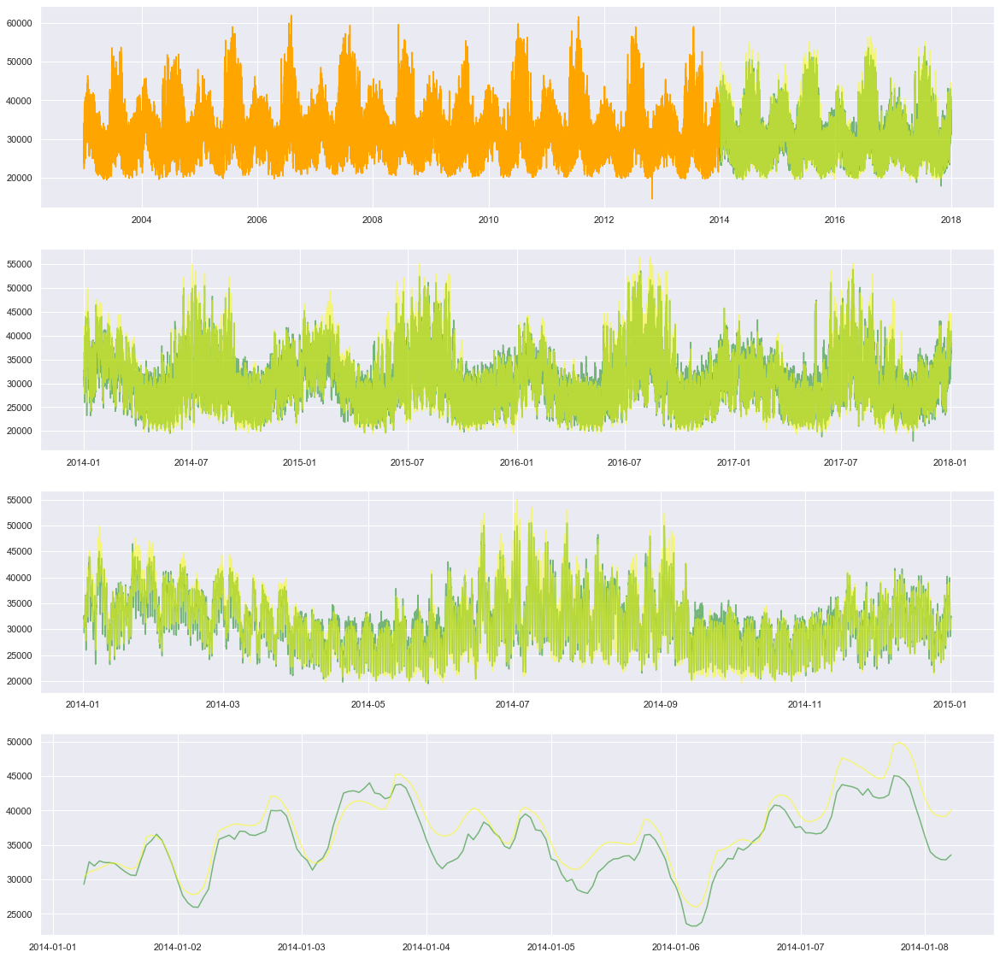

In [465]:
plt.figure(figsize=(20,20))
plt.subplot(4,1,1)
plt.plot(train_power['PJME'],color = 'orange', alpha = 1)
plt.plot(test_power['y_boost_preds'], color = 'green', alpha = .5)
plt.plot(test_power['PJME'], color = 'yellow', alpha = .5)
plt.grid(True)

plt.subplot(4,1,2)
plt.plot(test_power['y_boost_preds'], color = 'green', alpha = .5)
plt.plot(test_power['PJME'], color = 'yellow', alpha = .5)
plt.grid(True)

plt.subplot(4,1,3)
plt.plot(test_power['y_boost_preds'][0:8766], color = 'green', alpha = .5)
plt.plot(test_power['PJME'][0:8766], color = 'yellow', alpha = .5)
plt.grid(True)

plt.subplot(4,1,4)
plt.plot(test_power['y_boost_preds'][0:168], color = 'green', alpha = .5)
plt.plot(test_power['PJME'][0:168], color = 'yellow', alpha = .5)
plt.grid(True)
plt.show()
#doesnt recognize hourly data 

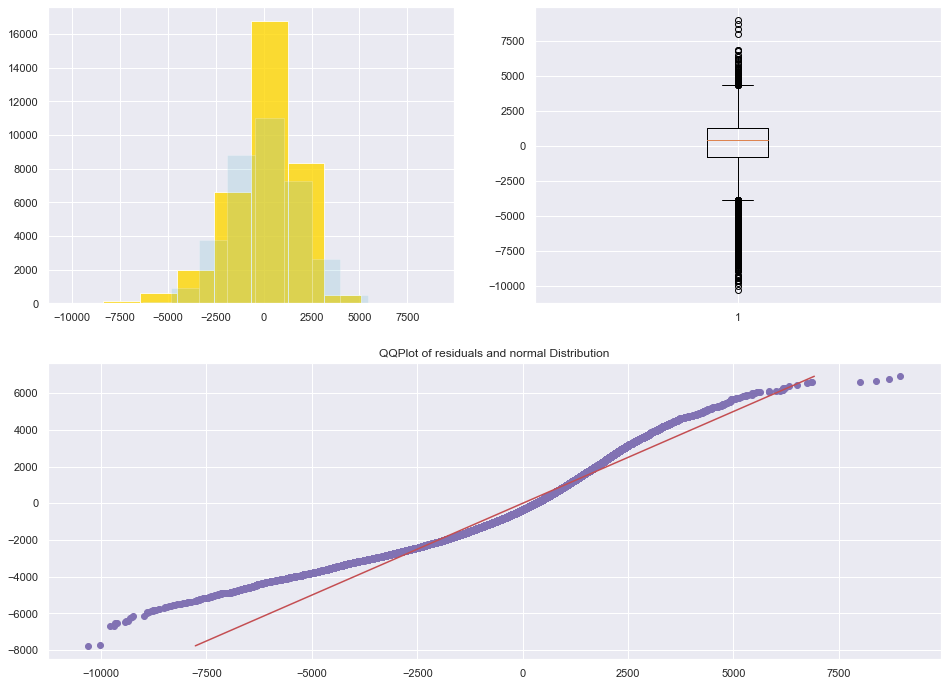

the Jarque berra stat is 12450.475145826533, and the pvalue is 0.0
NormaltestResult(statistic=5947.806616477338, pvalue=0.0)
the Minimum is -10304.0483682411
the Maximum is 8947.472614617414
the Length is 35087
the Length is 35087
the Standard Deviation is 1808.8042241498454
the Mean is 86.32537690750019




In [751]:
test_for_normality(y_test ,y_boost_preds)

## Modeling Results 

The results can be interpreted as a success. The vector autoregression model(VAR) and the Granger Causality Test were useful for demonstrating the significance of the correlation between temperature and power consumption.  This was further shown with the prediction metrics of the VAR model. In the VAR model, a lag order of 4 was used even though AIC and BIC scores showed a continued reduction with greater lags.  This is because beyond 4 lags, coefficients began to lose statistical significance. In the forecast prediction, forecasts were made up to 6 hours ahead of the current. The results were promising with the first 3 lags having R-squared values above 0.90, MAPEs between 3% and 6%, and RMSEs between 1194.70-2655.94, as promising as these results were, they were outperformed in nearly every way by the non-parametric models. 

The non-parametric models where fit twice with lagged target variables and without lagged target variables. The models with the lagged variables would be for forecasting up to one hour ahead, whereas the models without the lagged variables could be used to predict as far in advance as the accuracy of weather forecasts are. 

The Random Forest model with lagged target variables had an R-squared value of 0.996, a MAPE of 0.85%, and an RMSE =  398.22803227097523. This model showed a high level of leptokurtosis in its errors suggesting there were several points with high errors. Without the lagged variables the Random Forest model had an R-squared accuracy of 0.9156, a MAPE of 4.45, and an RMSE=1855.745215821366. These results are promising since they outperform many of the results on Kaggle. The Random Forest was outperformed by the Gradient Boosting Model. 

The Gradient Boosting Model with lagged variables had an R-squared value of 0.997, a MAPE of 0.76%, and an RMSE = 339.877687666841. Without the lagged variables it had an R-squared value of 0.92, a MAPE of 4.30%, and an RMSE = 1810.86. These results make the Gradient Boosting model the best predictor for energy consumption. The model is also adaptable to forecast without lag variables as far in advance as weather and fuel prices are accurately available.  




## Discussion

#### Avenues of improvement for current models
In building the models above, several ways to improve them became apparent. The VAR model could be improved by developing the interaction between temperature, humidity, and wind, since humidity and wind  can augment the thermal capacity of the air, effect evaporative cooling, and cause dwellings to lose heat more rapidly. 

Incorporation of econometric data might be able to improve power consumption predictions, if a daily sales metric or consumer confidence metric was available it might aid in determining the pace of economic production/activity. However much of this data is of a larger granularity, usually months and quarters. Its effect on consumption might be quite gradual. 

Electricity price data may also show a gradual but significant effect on power consumption, for example: people might use less energy once they see consecutively higher electric bills. However, this may only be useful for long term forecasts.   

Better data around vacations may help reduce errors, several of the days with the highest residuals may be due to  people taking a summer vacation. 

Another way to improve extreme errors would be to predict power disruption due to extreme weather events. 

In regards to the Vector auto regression model I would argue that  deaseasonalizing the dataset could be problematic if we are trying to measure the correlation of a variable such as temperature on electrical consumption, because temperature is likley a cause of anual and daily seasonality in electrical consumption. in the paper linked below authors outline a statistical method for measuring seasonal correlations in time series. Common Seasonality in Multivariate Time Series:  http://www3.stat.sinica.edu.tw/statistica/oldpdf/A26n43.pdf

Several of the models trying to predict power consumption on Kaggle used LSTM, and predicted with high accuracy, though many were outperformed by the gradient boosting model above. A Multivariate LSTM with more variables might be able to generate a more accurate prediction with fewer errors.

Finally, the covid19  pandemic has drastically altered life for nearly everyone on the planet. With people working from home, avoiding restaurants, and public spaces, it is likely affecting the way we consume electricity. Applying the models above to a contemporary power dataset would help to determine the robustness of the model. 

### Future Experimentation 

The models and data above can be considered a starting point for a better understanding of how to be strategic with a growing supply of renewable energy. By using rooftop data provided by the federal government and PVlib library, and satellite cloud imagery, it may be possible to predict the EMAAC power grids capacity for renewables, and too what extent they can be implemented before both short and long term energy storage solutions are needed. 

Electricity demand for PJME EMAAC rises and falls drastically on a daily basis.This leads to questions regrarding smaller aspects of the power grid. For example, when examining power demand at smaller grid nodes and substations, does the load fluctuate a greater amount, or is it smoothed by the collective power consumption of the local population? Understanding the network interactions overtime of the grid would help to better understand how residential renewables can be implemented successfully. It may also help to better understand the energy demands of certain populations. 

Finally As described in the paper below Electrical consumption can be used as and economic indicator, and by acounting for the influence of weather, we might be able to forcast econimic activity, and othe economic variables. 
https://www.eia.gov/workingpapers/pdf/electricity_indicator.pdf
